## Top 1% - Housing price competition Notebook

**If you want to learn something, learn it from the best**

    Outline

- Love


### Import libraries and dependencies

In [2]:
import warnings 

# Suppress all warnings
warnings.filterwarnings('ignore')

# Remove warning
warnings.simplefilter('ignore')


from pprint import pprint

import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats.mstats import winsorize
from scipy.stats import anderson
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
%matplotlib inline
import sys

from sklearn.base import clone
from sklearn import set_config
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, GridSearchCV, RandomizedSearchCV,  learning_curve
from sklearn.preprocessing import FunctionTransformer, PowerTransformer, RobustScaler, QuantileTransformer, StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, BaggingRegressor, ExtraTreesRegressor, AdaBoostRegressor, VotingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression
# from xgboost import XGBRegressor
# from lightgbm import LGBMRegressor
# from catboost import CatBoostRegressor

import joblib

from IPython.display import FileLink, HTML

# Set the default figure size for matplotlib to ensure 
sns.set_theme(style='darkgrid', palette='coolwarm', rc={'figure.figsize' :(15,10)})


from tqdm.notebook import tqdm
import time 


# Visualize pipeline

set_config(display='diagram')
set_config(transform_output='default')


# Set option of DataFrame
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)
pd.set_option('display.width', 100)



### Initiate DataFrame

In [3]:
full_sample_submission_df = pd.read_csv('home-data-for-ml-course/sample_submission.csv')
full_train_df = pd.read_csv('home-data-for-ml-course/train.csv')
full_test_df = pd.read_csv('home-data-for-ml-course/test.csv')

f"Full training shape : {full_train_df.shape}" ,\
f"Full test shape : {full_test_df.shape}" 


('Full training shape : (1460, 81)', 'Full test shape : (1459, 80)')

In [4]:
full_train_df_memory = full_train_df.memory_usage(deep=True).sum() / (1024 * 1024)
full_test_df_memory = full_test_df.memory_usage(deep=True).sum() / (1024 * 1024)

f'full test dataset memory usage: {full_test_df_memory:.2f}'
f'full training dataset memory usage: {full_train_df_memory:.2f}'


'full training dataset memory usage: 3.43'

### Split full_train_df into training and Holdout Sets

The full Testing and Holdout Sets will remain untouched until the prediction evaluation stage 
We pretend this data is not even existing

- Training set has 1168 rows (80.0%) and 81 columns
- Holdout set has 292 rows (20.0%) and 81 columns

In [5]:
train_df, holdout_df = train_test_split(full_train_df, test_size=0.2,  random_state=22)

### Exploratory Data Analysis (EDA) on training set ONLY - Understanding Data

- samples : 1168
- features : 81
- quantitative (numerical) : 36
- qualitative (categorical): 43 
- Id, SalePrice


In [6]:
train_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1070,1071,20,RL,72.0,10152,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,1956,1956,Hip,CompShg,MetalSd,MetalSd,BrkFace,120.0,TA,TA,CBlock,TA,TA,No,BLQ,586,Unf,0,462,1048,GasA,TA,Y,SBrkr,1048,0,0,1048,1,0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1956.0,Unf,1,286,TA,TA,Y,0,20,0,0,192,0,NaN,NaN,NaN,0,6,2007,WD,Normal,135000
1379,1380,80,RL,73.0,9735,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,167500
138,139,60,RL,73.0,9066,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,320.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,668,Unf,0,336,1004,GasA,Ex,Y,SBrkr,1004,848,0,1852,0,0,2,1,3,1,Gd,7,Typ,2,TA,Attchd,1999.0,Fin,3,660,TA,TA,Y,224,106,0,0,0,0,NaN,GdPrv,NaN,0,12,2008,WD,Normal,230000
667,668,20,RL,65.0,8125,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,6,5,1994,1998,Gable,CompShg,HdBoard,HdBoard,BrkFace,258.0,TA,TA,PConc,Gd,TA,No,GLQ,1138,Unf,0,270,1408,GasA,Ex,Y,SBrkr,1679,0,0,1679,1,0,2,0,3,1,Gd,7,Typ,1,Fa,Attchd,1994.0,RFn,2,575,TA,TA,Y,224,42,0,0,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal,193500
1215,1216,20,RL,99.0,7094,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1966,1966,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,180,LwQ,374,340,894,GasA,TA,Y,SBrkr,894,0,0,894,0,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1966.0,RFn,1,384,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,5,2007,WD,Normal,125000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356,357,20,RL,NaN,9248,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,6,1992,1992,Gable,CompShg,HdBoard,HdBoard,BrkFace,106.0,TA,TA,PConc,Gd,TA,No,GLQ,560,Unf,0,598,1158,GasA,Gd,Y,SBrkr,1167,0,0,1167,1,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,1992.0,RFn,2,400,TA,TA,Y,120,26,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,173000
960,961,20,RL,50.0,7207,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1Story,5,7,1958,2008,Gable,CompShg,Wd Sdng,Plywood,NaN,0.0,TA,Gd,CBlock,TA,TA,Gd,BLQ,696,Unf,0,162,858,GasA,Gd,Y,SBrkr,858,0,0,858,1,0,1,0,2,1,TA,4,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,117,0,0,0,0,0,NaN,NaN,NaN,0,2,2010,WD,Normal,116500
812,813,20,C (all),66.0,8712,Grvl,NaN,Reg,Bnk,AllPub,Inside,Mod,IDOTRR,Norm,Norm,1Fam,1Story,5,5,1952,1952,Hip,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,Fa,TA,CBlock,TA,TA,Av,Unf,0,Unf,0,540,540,GasA,TA,N,FuseA,1044,0,0,1044,0,0,1,0,2,1,Fa,4,Typ,0,NaN,Basment,1952.0,Unf,2,504,TA,TA,N,0,0,0,0,0,0,NaN,NaN,Shed,54,6,2010,WD,Alloca,55993
132,133,20,RL,75.0,7388,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1959,2002,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,405,Unf,0,658,1063,Ga

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1168 entries, 1070 to 885
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    956 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          72 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallCond

### Numerical Features Exploration

Focus on the main statistics of a dataset like **skewness,  range, mcv** columns
- If the skewness is **between minus 0.5 and 0.5**, we can usually conclude the data's reasonably symmetrical
- If the skewness is **between minus 1 and minus 0.5 or between 0.5 and 1**, the data moderately skews either negatively or  positively
- If the skewness is **less than minus 1 or more than 1**, the data is highly skews either negatively or positively 

**range** = Max - Min. Used to check if Scaling is needed. And in this case it is clear that original data should be scaled.

**MCV** = Most Common Value

We will later remove/ fil Null values, apply transformation that will make data more symmetrical and scale data. 

And we will may consider deleting features with more than 96% consistency with a single value, **Keep that in mind**


In [8]:
# Describe (count, mean, std, min, 25%, 50%, 75% and max , skewness ) all numeric columns

# Calculated skewness for each numerical column
skewness = train_df.select_dtypes(include=[np.number]).skew()
skewness

# Describe the DataFrame and transpose it to get statistics by columns
numerical_description = train_df.describe(include=[np.number]).transpose()
numerical_description

# add the skewness values and range as a new column to the description DataFrame
numerical_description['skewness'] = skewness
numerical_description['range'] = np.ptp(train_df.select_dtypes(include=[np.number]), axis=0)

# Add the  most common value and its percentage
mcv = train_df.mode().iloc[0]
mcv_freq = train_df[train_df == mcv].count()
mcv_percentage =((mcv_freq) / len(train_df) * 100 )

# Add the most common value and its percentage to the description DataFrame
numerical_description['mcv'] = mcv
numerical_description['mcv freq'] = mcv_freq
numerical_description['mcv %'] = mcv_percentage


# Understand this function to be able to style the DataFrame
def numerical_color_gradient(val, column_name):
    
    if column_name == 'skewness':
        if 0 <= abs(val) <= 0.49:
            color = mcolors.to_rgba('lightgreen')  # Bright green
        elif 0.5 <= abs(val) <= 0.99:
            color = mcolors.to_rgba((1.0, 0.8, 0.6))  # Darker orange
        else:
            color = mcolors.to_rgba((1.0, 0.6, 0.6))  # Darker red
            
    elif column_name == 'count':
        if val == numerical_description['count'].max():
            color = mcolors.to_rgba('lightgreen')
        else:
            color = mcolors.to_rgba((1.0, 0.8, 0.6))
            
    elif column_name == 'mcv %':
        if 0 <= val <= 49.99:
            color = mcolors.to_rgba('lightgreen')  # Bright green
        elif 50 <= val <= 95.99:
            color = mcolors.to_rgba((1.0, 0.8, 0.6))  # Darker orange
        else:
            color = mcolors.to_rgba((1.0, 0.6, 0.6))  # Darker red

    return f'background-color: {mcolors.to_hex(color)}; color: black; font-weight: bold'

# Apply the background gradient to the DataFrame



original_numerical_styled_df = numerical_description.style.applymap(lambda x: numerical_color_gradient(x, 'skewness'), subset=['skewness'])
original_numerical_styled_df = original_numerical_styled_df.applymap(lambda x: numerical_color_gradient(x, 'count'), subset=['count'])
original_numerical_styled_df = original_numerical_styled_df.applymap(lambda x: numerical_color_gradient(x, 'mcv %'), subset=['mcv %'])

# Display the styled DataFrame

original_numerical_styled_df

,count,mean,std,min,25%,50%,75%,max,skewness,range,mcv,mcv freq,mcv %
Id,1168.000000,733.429795,421.941047,3.000000,367.750000,726.500000,1106.500000,1460.000000,-0.001619,1457.000000,3,1,0.085616
MSSubClass,1168.000000,56.391267,41.656614,20.000000,20.000000,50.000000,70.000000,190.000000,1.427742,170.000000,20.000000,428,36.643836
LotFrontage,956.000000,70.322176,24.995764,21.000000,59.000000,69.000000,80.000000,313.000000,2.494902,nan,60.000000,120,10.273973
LotArea,1168.000000,10625.950342,10882.796556,1300.000000,7448.250000,9475.000000,11475.750000,215245.000000,11.702952,213945.000000,7200.000000,24,2.054795
OverallQual,1168.000000,6.103596,1.377523,1.000000,5.000000,6.000000,7.000000,10.000000,0.242828,9.000000,5.000000,319,27.311644
OverallCond,1168.000000,5.582192,1.109324,1.000000,5.000000,5.000000,6.000000,9.000000,0.644651,8.000000,5.000000,653,55.907534
YearBuilt,1168.000000,1971.206336,30.419507,1872.000000,1953.750000,1973.000000,2000.000000,2010.000000,-0.606084,138.000000,2006.000000,52,4.452055
YearRemodAdd,1168.000000,1985.014555,20.738234,1950.000000,1967.000000,1994.000000,2004.000000,2010.000000,-0.521554,60.000000,1950.000000,147,12.585616
MasVnrArea,1162.000000,99.905336,178.851431,0.000000,0.000000,0.000000,153.750000,1600.000000,2.865449,nan,0.000000,698,59.760274
BsmtFinSF1,1168.000000,446.885274,466.557836,0.000000,0.000000,383.500000,712.250000,5644.000000,1.860008,5644.000000,0.000000,380,32.534247


`Let's look at the distribution of all numerical columns sorted by skewness`

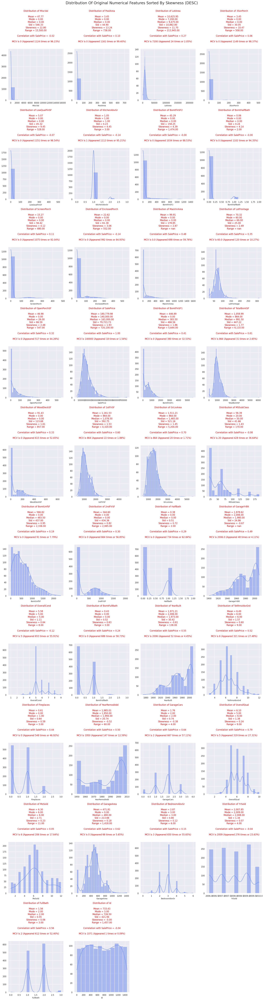

In [17]:
# Select numerical columns from train_df
numerical_columns = train_df.select_dtypes(include='number')

# Calculate the absolute skewness for each column
absolute_skewness = abs(numerical_columns.skew())

# Sort columns by absolute skewness in descending order
sorted_columns = absolute_skewness.sort_values(ascending=False).index

# Calculate correlations with SalePrice
correlations = numerical_columns.corr()['SalePrice'].sort_values(ascending=False)

# Set the number of columns and rows for subplots
num_cols = 4  # Number of columns per row
num_rows = (numerical_columns.shape[1] + num_cols - 1) // num_cols  # Calculate the number of rows

# Create a figure and axes for subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 75))

# Flatten the axes array
axes = axes.ravel()

# Add a main title to the entire set of subplots
fig.suptitle("Distribution Of Original Numerical Features Sorted By Skewness (DESC)", y=1, fontsize=20)

# Loop through numerical columns and create histograms
for i, column in enumerate(sorted_columns):

    vc = train_df[column].value_counts()
    values = vc.index[0]
    counts = vc.values[0]
    
    
    ax = axes[i]
    sns.histplot(train_df[column], kde=True, ax=ax)
    ax.set_xlabel(column, fontsize=10)
    ax.set_ylabel('', fontsize=10)
        
    # Add information about SalePrice correlation to the title
    correlation_with_saleprice = correlations[column]
    
    ax.set_title(f"Distribution of {column}\n"
                 "\n"
                 f"Mean = {train_df[column].mean():,.2f}\n"
                 f"Mode = {train_df[column].mode().iloc[0]:,.2f}\n"
                 f"Median = {train_df[column].median():,.2f}\n"
                 f"Std = {train_df[column].std():,.2f}\n"
                 f"Skewness = {train_df[column].skew():,.2f}\n"
                 f"Range = {np.ptp(train_df[column]):,.2f}\n"
                 "\n"
                 f"Correlation with SalePrice = {correlation_with_saleprice:.2f}\n"
                 "\n"
                 f"MCV is {values} (Appeared {counts} times or {counts / len(train_df) * 100:,.2f}%)\n"
                 "\n"
                 , fontsize=12, color='red')
     
# Remove empty subplots if necessary
if len(sorted_columns) < num_cols * num_rows:
    for i in range(len(sorted_columns), num_cols * num_rows):
        fig.delaxes(axes[i])


plt.tight_layout() # Adjust spacing between subplots
plt.show()


Those features that has a heavily skewness should be drop later.

`Visualize the Original Correlation Matrix`

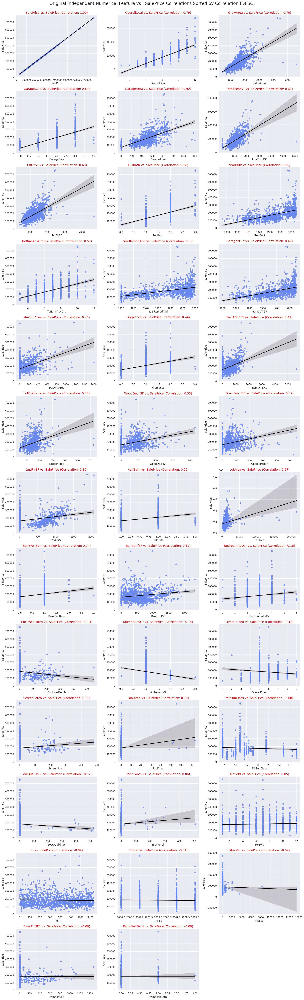

In [ ]:
# Select numerical columns from the train_df
corr = numerical_columns.corr()
corr

# Sort columns by correlation with 'SalePrice' in ascending order
sorted_columns = abs(corr['SalePrice']).sort_values(ascending=False).index

# Calculate the number of rows and columns for the subplots 
num_plots = len(sorted_columns)

num_cols = 3
num_rows = (num_plots - 1) // num_cols + 1

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

# Add a main title to the entire set of subplots
fig.suptitle("Original Independent Numerical Feature vs . SalePrice Correlations Sorted by Correlation (DESC)", y=1, fontsize=20)


# Create scatter plot for each combination
for i, col in enumerate(sorted_columns):

    row_idx = i // num_cols
    col_idx = i % num_cols

    correlation = corr.loc[col, 'SalePrice']
    sns.regplot(x=col, y='SalePrice', data=train_df, ax=axes[row_idx, col_idx], line_kws={'color':'black'})
    axes[row_idx, col_idx].set_xlabel(col, fontsize=12)
    axes[row_idx, col_idx].set_ylabel('SalePrice', fontsize=12)
    axes[row_idx, col_idx].set_title(f'{col} vs. SalePrice (Correlation: {correlation:.2f})', fontsize=14, color='red')
    axes[row_idx, col_idx].grid(True)

# Remove any empty subplots
for i in range(num_plots, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])  

# Adjust layout 
plt.tight_layout()
plt.show()




`Visualize the Original Correlation Matrix(SalePrice Correlation (>=abs(0.5)))`

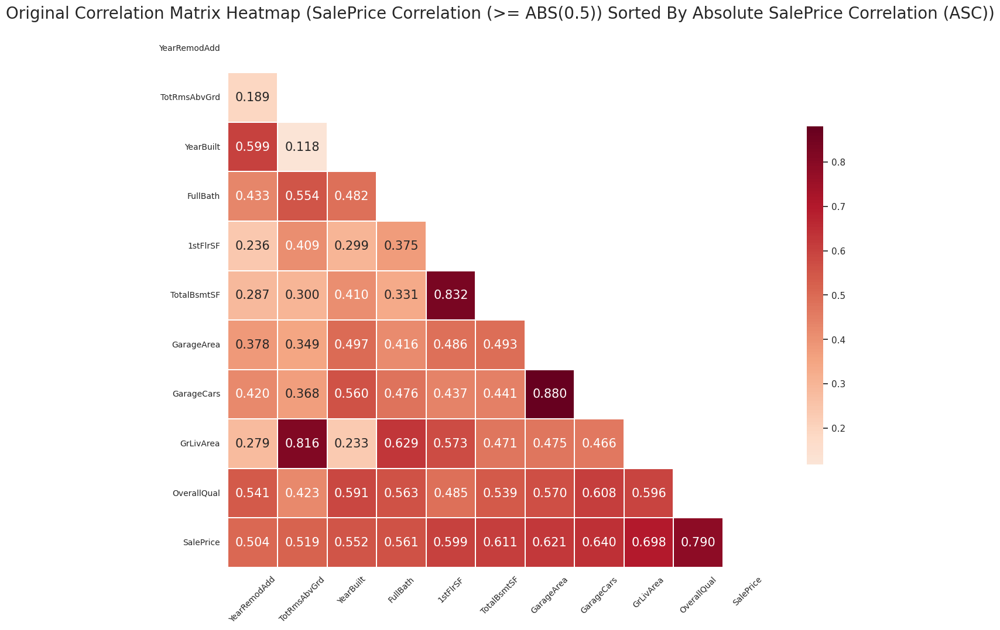

In [ ]:
# Get the features with absolute correlation >= 0.5 with 'SalePrice'
top_correlated_features = corr.index[abs(corr['SalePrice']) >= 0.5]

# Calculate the absolute correlations for the top correlated features
correlations_with_saleprice = abs(corr.loc[top_correlated_features, 'SalePrice'])

# Sort the top correlated features by their correlation with 'SalePrice' in descending order
sorted_features = correlations_with_saleprice.sort_values(ascending=True).index

# Filter the correlation matrix to keep only the top correlated features
corr_filtered = corr.loc[sorted_features, sorted_features]

# Create a mask to remove the upper triangle
mask = np.triu(np.ones_like(corr_filtered, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15,15))

# Generate a custom diverging colormap (choose colors here)
cmap = sns.color_palette("RdBu_r", as_cmap=True)  # "viridis", "cividis", "plasma", 'coolwarm', 'RdBu_r'

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_filtered, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=0.01, cbar_kws={"shrink": 0.5}, 
            annot=True, fmt=".3f", annot_kws={"fontsize": 15},
            linecolor='white', cbar=True)

# Set x and y label font size
ax.tick_params(axis='x', labelsize=10, rotation=45)
ax.tick_params(axis='y', labelsize=10, rotation=360)


plt.title("Original Correlation Matrix Heatmap (SalePrice Correlation (>= ABS(0.5)) Sorted By Absolute SalePrice Correlation (ASC))", fontsize=20)

# Remove grid lines from the upper-right triangle
ax.set_facecolor('white')
plt.show()

### Categorical Features Exploration

we will later fill NULL values and apply different encoding techniques.

In [ ]:
# Describe (count, unique, top and freq) all categorical features
categorical_description = train_df.describe(include=['object']).transpose()
categorical_description['mcv %'] = categorical_description['freq'] / len(train_df) * 100
categorical_description.rename(columns={'top':'mcv','freq':'mcv freq'}, inplace=True)
categorical_description

# Define custom color
def categorical_color_gradient(val, column_name):

    if column_name == 'count':
        if val == categorical_description['count'].max():
            color = mcolors.to_rgba('lightgreen')
        else :
            color = mcolors.to_rgba((1.0, 0.8, 0.6))
    elif column_name == 'mcv %':
        if 0 <= val <= 49.99:
            color = mcolors.to_rgba('lightgreen')  # Bright green
        elif 50 <= val <= 95.99:
            color = mcolors.to_rgba((1.0, 0.8, 0.6))  # Darker orange
        else:
            color = mcolors.to_rgba((1.0, 0.6, 0.6))  # Darker red
    
    return f'''background-color : {mcolors.to_hex(color)};
            color : black;
            font-weight: bold'''

categorical_description.sort_values('mcv %', inplace=True)

# Applying the background gradient to the DataFrame
original_categorical_styled_df = categorical_description.style.applymap(lambda x : categorical_color_gradient(x, 'count'), subset=['count'])
original_categorical_styled_df = original_categorical_styled_df.applymap(lambda x : categorical_color_gradient(x, 'mcv %'), subset=['mcv %'])

# Display the styled DataFrame
original_categorical_styled_df


,count,unique,mcv,mcv freq,mcv %
PoolQC,7,3,Gd,3,0.256849
MiscFeature,46,4,Shed,41,3.510274
Alley,72,2,Grvl,42,3.595890
Fence,225,4,MnPrv,128,10.958904
Neighborhood,1168,25,NAmes,170,14.554795
FireplaceQu,620,5,Gd,307,26.284247
MasVnrType,462,3,BrkFace,348,29.794521
BsmtFinType1,1140,6,Unf,352,30.136986
Exterior2nd,1168,16,VinylSd,398,34.075342
Exterior1st,1168,15,VinylSd,405,34.674658


`Visualize the countplots for all categorical features`

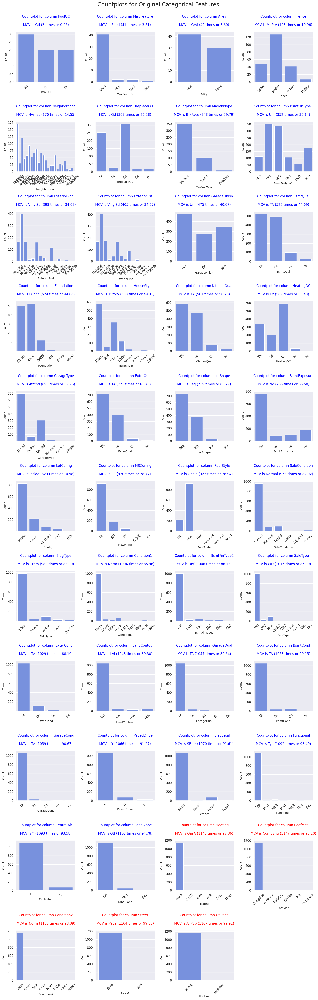

In [ ]:
# Select Categorical column in train_df
categorical_columns = train_df.select_dtypes(include=['object'])

# Set the number of columns and rows for subplots
num_cols = 4 # number of columns per rows
num_rows = (categorical_columns.shape[1] + num_cols - 1) // num_cols # Calculated the number of rows 

# Create a figure and axes for subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(16, 50))

# Flatten the axes
axes = axes.ravel()

# Add the main title to the entire subplots
fig.suptitle("Countplots for Original Categorical Features", y=1, fontsize=20)

# Sort categorical columns base on the most common value and its frequent (DESC)

# Loop though categorical columns and create count plots
for i, column in enumerate(categorical_description.index.values):
    
    vc = train_df[column].value_counts()
    values = vc.index[0]
    counts = vc.values[0]

    ax = axes[i]
    sns.countplot( x=column, data=train_df, ax=ax)
    ax.set_xlabel(column, fontsize=10)
    ax.set_ylabel('Count', fontsize=10)

    freq = counts/ len(train_df) * 100
    color = 'red'
    if freq > 96.00 :
        color = 'red'
    else :
        color = 'blue'

    ax.set_title(f'Countplot for column {column}\n\n' + 
                 f'MCV is {values} ({counts} times or {freq:,.2f})\n', fontsize=12, color=color)
    ax.tick_params(axis='x', rotation=45)

# Remove empty subplot if necessary
if len(categorical_columns.columns) < num_cols * num_rows:
    for i in range(len(categorical_columns.columns), num_cols * num_rows):
        fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

### Dependent (Target) Variable - SalePrice Exploration

In [ ]:
# Describe SalePrice Column
target_description = train_df['SalePrice'].describe()
target_description

# Add the skewness and range as a new column to the SalePrice description DataFrame
target_description['skew'] = train_df['SalePrice'].skew()
target_description['range'] = np.ptp(train_df['SalePrice'], axis=0)
target_description

# Calculate the most common value and its percentage
mcv = train_df['SalePrice'].mode().iloc[0]
mcv_freq = train_df[train_df == mcv]['SalePrice'].count()
mcv_percentage = (mcv_freq / len(train_df) * 100)

# Add the most common value and its percentage to the description DataFrame
target_description['mcv'] = mcv
target_description['mcv freq'] = mcv_freq
target_description['mcv %'] = mcv_percentage

target_description = pd.DataFrame(target_description).transpose()

target_description

,count,mean,std,min,25%,50%,75%,max,skew,range,mcv,mcv freq,mcv %
SalePrice,1168.0,180779.975171,79723.725153,34900.0,129000.0,163000.0,215000.0,755000.0,1.93385,720100.0,140000.0,18.0,1.541096


In [ ]:
# Check if there are any null values in column y (our target)
f' There are {train_df['SalePrice'].isnull().sum()} Null value in SalePrice feature.'

' There are 0 Null value in SalePrice feature.'

`Let's compare different transformation of SalePrice, such as Log1p, Sqrt, Power transformation, etc, Using Histplot, Distribution Plot, Q-Q plot, Box plot`

- **Histogram Plot** is a graphical representation of the distribution of a dataset. it displays data by dividing it into bins and counting the number of data points that fall to each bin. The resulting chart shows the frequency or count of data points within each bin, allow you to visualize the data's distribution and identify pattern

- **Distribution plot** is used to plot univariate distributions. It combines a histogram with a kernel density estimate (KDE)

- **Quantile - Quantile (Q-Q) plot** is a graphical tool used to assess whether a dataset/feature follows a particular theoretical distribution (e.g normal distribution,..)

- **Box plot** is a graphical representation of the distribution of a dataset. It displays summary statistics about the data's distribution, allowing you to visualize key characteristics such as median, quartile, and potential outliers, potential range,..

**Anderson-Darling** will be used to assess the goodness of fit of a sample to theoretical distribution, similar to the Kolmogorov-Smirnov test. The Andderson-Darling test places more weight on the tails of distribution, making it more sensitive to deviations in the tails compared to the Kolmogorov-Smirnov test. A lower Anderson-Darling statistic indicates a better fit.

In [ ]:
# Initiate fake_df for visualization of different versions  of target variable
fake_df = train_df['SalePrice'].copy().to_frame()
fake_df

# SalePrice in other transformations
fake_df['Log1p(SalePrice)'] = np.log1p(fake_df['SalePrice'])
fake_df['Sqrt(SalePrice)'] = np.sqrt(fake_df['SalePrice'])
fake_df['Cbrt(SalePrice)'] = np.cbrt(fake_df['SalePrice'])
fake_df['InverseTransform(SalePrice)'] = 1 / fake_df['SalePrice']
fake_df['Winsorized(SalePrice)'] = winsorize(fake_df['SalePrice'], limits=[0.05, 0.5])

# Applying Scaling technique
fake_df['MinMaxScaled(SalePrice)'] = MinMaxScaler().fit_transform(fake_df[['SalePrice']])
fake_df['StandardScaled(SalePrice)'] = StandardScaler().fit_transform(fake_df[['SalePrice']])
fake_df['RobustScaled(SalePrice)'] = RobustScaler().fit_transform(fake_df[['SalePrice']])

# Applying Yeo-Johnson and Box-CoX transformations with and without standardization
# Reshape the 'SalePrice' column to a 2D array-like format
power_yj_sf = PowerTransformer(method='yeo-johnson', standardize=False)
power_yj_st = PowerTransformer(method='yeo-johnson', standardize=True)

power_bc_sf = PowerTransformer(method='box-cox', standardize=False)
power_bc_st = PowerTransformer(method='box-cox', standardize=True)

fake_df['SalePrice_YJ_SF'] = power_yj_sf.fit_transform(fake_df['SalePrice'].values.reshape(-1,1))
fake_df['SalePrice_YJ_ST'] = power_yj_st.fit_transform(fake_df['SalePrice'].values.reshape(-1,1))

fake_df['SalePrice_BC_SF'] = power_bc_sf.fit_transform(fake_df['SalePrice'].values.reshape(-1,1))
fake_df['SalePrice_BC_ST'] = power_bc_st.fit_transform(fake_df['SalePrice'].values.reshape(-1,1))

# Apply Quantile Transformation with uniform and normal distribution
quantile_unif  = QuantileTransformer(output_distribution='uniform', n_quantiles=100)
quantile_norm  = QuantileTransformer(output_distribution='normal', n_quantiles=100)

fake_df['SalePrice_QT_UNIF'] = quantile_unif.fit_transform(fake_df['SalePrice'].values.reshape(-1,1))
fake_df['SalePrice_QT_NORM'] = quantile_norm.fit_transform(fake_df['SalePrice'].values.reshape(-1,1))

fake_df


,SalePrice,Log1p(SalePrice),Sqrt(SalePrice),Cbrt(SalePrice),InverseTransform(SalePrice),Winsorized(SalePrice),MinMaxScaled(SalePrice),StandardScaled(SalePrice),RobustScaled(SalePrice),SalePrice_YJ_SF,SalePrice_YJ_ST,SalePrice_BC_SF,SalePrice_BC_ST,SalePrice_QT_UNIF,SalePrice_QT_NORM
1070,135000,11.813037,367.423461,51.299278,0.000007,135000,0.139008,-0.574479,-0.325581,7.479903,-0.511601,7.480194,-0.511601,0.292929,-0.544847
1379,167500,12.028745,409.267639,55.123689,0.000006,163000,0.184141,-0.166646,0.052326,7.558859,0.031987,7.559158,0.031987,0.523797,0.059687
138,230000,12.345839,479.583152,61.269257,0.000004,163000,0.270935,0.617647,0.779070,7.672350,0.813339,7.672660,0.813338,0.797980,0.834427
667,193500,12.173038,439.886349,57.839828,0.000005,163000,0.220247,0.159620,0.354651,7.610879,0.390131,7.611183,0.390131,0.679032,0.464994
1215,125000,11.736077,353.553391,50.000000,0.000008,125000,0.125122,-0.699966,-0.441860,7.451384,-0.707949,7.451672,-0.707949,0.214342,-0.791446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356,173000,12.061053,415.932687,55.720547,0.000006,163000,0.191779,-0.097629,0.116279,7.570562,0.112556,7.570862,0.112556,0.555556,0.139710
960,116500,11.665655,341.320963,48.839961,0.000009,116500,0.113318,-0.806630,-0.540698,7.425125,-0.888735,7.425410,-0.888734,0.160211,-0.993592
812,55993,10.933000,236.628401,38.257029,0.000018,87000,0.029292,-1.565913,-1.244267,7.142481,-2.834664,7.142737,-2.834665,0.008230,-2.398547
132,150750,11.923385,388.265373,53.221336,0.000007,150750,0.160880,-0.376837,-0.142442,7.520473,-0.232288,7.520768,-0.232288,0.425217,-0.188565


In [ ]:
fake_df_description = fake_df.describe().transpose()

fake_df_description['skewness'] = fake_df.skew()
fake_df_description['range'] = np.ptp(fake_df, axis=0)

# Calculated the most common value and its percentage
mcv = fake_df.mode().iloc[0]
mcv_freq = fake_df[fake_df == mcv].count()
mcv_percentage = (mcv_freq / len(fake_df) * 100)

# Add the most common value and its percentage to the description DataFrame
fake_df_description['mcv'] = mcv
fake_df_description['mcv freq'] = mcv_freq
fake_df_description['mcv %'] = mcv_percentage

fake_df_description

,count,mean,std,min,25%,50%,75%,max,skewness,range,mcv,mcv freq,mcv %
SalePrice,1168.0,1.807800e+05,79723.725153,34900.000000,129000.000000,163000.000000,215000.000000,755000.000000,1.933850,720100.000000,140000.000000,18,1.541096
Log1p(SalePrice),1168.0,1.202270e+01,0.400854,10.460271,11.767575,12.001512,12.278398,13.534474,0.128773,3.074204,11.849405,18,1.541096
Sqrt(SalePrice),1168.0,4.163944e+02,86.035057,186.815417,359.165700,403.732585,463.680925,868.907360,0.945192,682.091943,374.165739,18,1.541096
Cbrt(SalePrice),1168.0,5.550894e+01,7.539933,32.679480,50.527743,54.625556,59.907264,91.057485,0.665180,58.378005,51.924941,18,1.541096
InverseTransform(SalePrice),1168.0,6.504672e-06,0.000003,0.000001,0.000005,0.000006,0.000008,0.000029,1.930672,0.000027,0.000007,18,1.541096
Winsorized(SalePrice),1168.0,1.446282e+05,24217.386957,87000.000000,129000.000000,163000.000000,163000.000000,163000.000000,-1.092495,76000.000000,163000.000000,585,50.085616
MinMaxScaled(SalePrice),1168.0,2.025829e-01,0.110712,0.000000,0.130676,0.177892,0.250104,1.000000,1.933850,1.000000,0.145952,18,1.541096
StandardScaled(SalePrice),1168.0,-1.292725e-16,1.000428,-1.830603,-0.649771,-0.223115,0.429417,7.205709,1.933850,9.036312,-0.511735,18,1.541096
RobustScaled(SalePrice),1168.0,2.067439e-01,0.927020,-1.489535,-0.395349,0.000000,0.604651,6.883721,1.933850,8.373256,-0.267442,18,1.541096
SalePrice_YJ_SF,1168.0,7.554213e+00,0.145311,6.950623,7.463079,7.548970,7.648465,8.071763,-0.008041,1.121140,7.493316,18,1.541096


*This code below was copied completely without rewrite any line of code.*

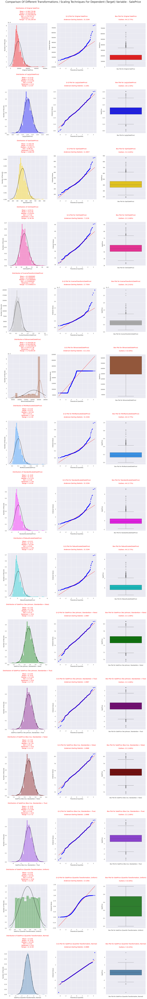

In [ ]:
# Create a figure with three rows and two columns of subplots

fig, axes = plt.subplots(15, 3, figsize=(20, 135))        

# Add a main title to the entire set of subplots

fig.suptitle("Comparison Of Different Transformations / Scaling Techniques For Dependent (Target) Variable - SalePrice", y=1, fontsize=25)



################################### Original SalePrice ###################################

# Original SalePrice distribution plot

#sns.histplot(fake_df['SalePrice'], kde=True, ax=axes[0, 0], color='red')
sns.distplot(fake_df['SalePrice'], kde=True, ax=axes[0, 0], color='red', fit = stats.norm, fit_kws={"color": "black"})
axes[0, 0].set_xlabel('Original SalePrice', fontsize=12)
axes[0, 0].set_ylabel('Number of Records', fontsize=12)
axes[0, 0].set_title(f"\n"
                     f"Distribution of Original SalePrice\n"
                     f"\n"
                     f"Mean = $ {fake_df['SalePrice'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['SalePrice'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['SalePrice'].median():,.2f}\n"
                     f"Std = $ {fake_df['SalePrice'].std():,.2f}\n"
                     f"Skewness = {fake_df['SalePrice'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['SalePrice']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for Original SalePrice

stats.probplot(fake_df['SalePrice'], dist="norm", plot=axes[0, 1])
axes[0, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[0, 1].set_ylabel('Ordered Values', fontsize=12)
axes[0, 1].set_title(f"\n"
                     f"Q-Q Plot for Original SalePrice\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['SalePrice']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['SalePrice'], stats.probplot(fake_df['SalePrice'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['SalePrice'], stats.probplot(fake_df['SalePrice'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for Original SalePrice

# Calculate and add information about outliers

Q1 = fake_df['SalePrice'].quantile(0.25)
Q3 = fake_df['SalePrice'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['SalePrice'] < Q1 - 1.5 * IQR) | (fake_df['SalePrice'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='SalePrice', data=fake_df, ax=axes[0, 2], color='red')
axes[0, 2].set_xlabel('Box Plot for Original SalePrice', fontsize=12)
axes[0, 2].set_ylabel('SalePrice', fontsize=12)
axes[0, 2].set_title(f"\n"
                     f"Box Plot for Original SalePrice\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### Log1p(SalePrice) ###################################

# Log1p(SalePrice) distribution plot

#sns.histplot(fake_df['Log1p(SalePrice)'], kde=True, ax=axes[1, 0], color='blue')
sns.distplot(fake_df['Log1p(SalePrice)'], kde=True, ax=axes[1, 0], color='blue', fit = stats.norm, fit_kws={"color": "black"})
axes[1, 0].set_xlabel('Log1p(SalePrice)', fontsize=12)
axes[1, 0].set_ylabel('Number of Records', fontsize=12)
axes[1, 0].set_title(f"\n"
                     f"Distribution of Log1p(SalePrice)\n"
                     f"\n"
                     f"Mean = $ {fake_df['Log1p(SalePrice)'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['Log1p(SalePrice)'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['Log1p(SalePrice)'].median():,.2f}\n"
                     f"Std = $ {fake_df['Log1p(SalePrice)'].std():,.2f}\n"
                     f"Skewness = {fake_df['Log1p(SalePrice)'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['Log1p(SalePrice)']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice after applying np.log1p()

stats.probplot(fake_df['Log1p(SalePrice)'], dist="norm", plot=axes[1, 1])
axes[1, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[1, 1].set_ylabel('Ordered Values', fontsize=12)
axes[1, 1].set_title(f"\n"
                     f"Q-Q Plot for Log1p(SalePrice)\n"                     
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['Log1p(SalePrice)']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['Log1p(SalePrice)'], stats.probplot(fake_df['Log1p(SalePrice)'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['Log1p(SalePrice)'], stats.probplot(fake_df['Log1p(SalePrice)'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for SalePrice after applying np.log1p()

# Calculate and add information about outliers

Q1 = fake_df['Log1p(SalePrice)'].quantile(0.25)
Q3 = fake_df['Log1p(SalePrice)'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['Log1p(SalePrice)'] < Q1 - 1.5 * IQR) | (fake_df['Log1p(SalePrice)'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='Log1p(SalePrice)', data=fake_df, ax=axes[1, 2], color='blue')
axes[1, 2].set_xlabel('Box Plot for Log1p(SalePrice)', fontsize=12)
axes[1, 2].set_ylabel('SalePrice', fontsize=12)
axes[1, 2].set_title(f"\n"
                     f"Box Plot for Log1p(SalePrice)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### Sqrt(SalePrice) ###################################

# Sqrt(SalePrice) distribution plot

#sns.histplot(fake_df['Sqrt(SalePrice)'], kde=True, ax=axes[2, 0], color='gold')
sns.distplot(fake_df['Sqrt(SalePrice)'], kde=True, ax=axes[2, 0], color='gold', fit = stats.norm, fit_kws={"color": "black"})
axes[2, 0].set_xlabel('Sqrt(SalePrice)', fontsize=12)
axes[2, 0].set_ylabel('Number of Records', fontsize=12)
axes[2, 0].set_title(f"\n"
                     f"Distribution of Sqrt(SalePrice)\n"
                     f"\n"
                     f"Mean = $ {fake_df['Sqrt(SalePrice)'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['Sqrt(SalePrice)'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['Sqrt(SalePrice)'].median():,.2f}\n"
                     f"Std = $ {fake_df['Sqrt(SalePrice)'].std():,.2f}\n"
                     f"Skewness = {fake_df['Sqrt(SalePrice)'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['Sqrt(SalePrice)']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice after applying np.sqrt()

stats.probplot(fake_df['Sqrt(SalePrice)'], dist="norm", plot=axes[2, 1])
axes[2, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[2, 1].set_ylabel('Ordered Values', fontsize=12)
axes[2, 1].set_title(f"\n"
                     f"Q-Q Plot for Sqrt(SalePrice)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['Sqrt(SalePrice)']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['Sqrt(SalePrice)'], stats.probplot(fake_df['Sqrt(SalePrice)'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['Sqrt(SalePrice)'], stats.probplot(fake_df['Sqrt(SalePrice)'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for SalePrice after applying np.sqrt()

Q1 = fake_df['Sqrt(SalePrice)'].quantile(0.25)
Q3 = fake_df['Sqrt(SalePrice)'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['Sqrt(SalePrice)'] < Q1 - 1.5 * IQR) | (fake_df['Sqrt(SalePrice)'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='Sqrt(SalePrice)', data=fake_df, ax=axes[2, 2], color='gold')
axes[2, 2].set_xlabel('Box Plot for Sqrt(SalePrice)', fontsize=12)
axes[2, 2].set_ylabel('SalePrice', fontsize=12)
axes[2, 2].set_title(f"\n"
                     f"Box Plot for Sqrt(SalePrice)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### Cbrt(SalePrice) ###################################

# Cbrt(SalePrice) distribution plot

#sns.histplot(fake_df['Cbrt(SalePrice)'], kde=True, ax=axes[3, 0], color='deeppink')
sns.distplot(fake_df['Cbrt(SalePrice)'], kde=True, ax=axes[3, 0], color='deeppink', fit = stats.norm, fit_kws={"color": "black"})
axes[3, 0].set_xlabel('Cbrt(SalePrice)', fontsize=12)
axes[3, 0].set_ylabel('Number of Records', fontsize=12)
axes[3, 0].set_title(f"\n"
                     f"Distribution of Cbrt(SalePrice)\n"
                     f"\n"
                     f"Mean = $ {fake_df['Cbrt(SalePrice)'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['Cbrt(SalePrice)'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['Cbrt(SalePrice)'].median():,.2f}\n"
                     f"Std = $ {fake_df['Cbrt(SalePrice)'].std():,.2f}\n"
                     f"Skewness = {fake_df['Cbrt(SalePrice)'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['Cbrt(SalePrice)']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice after applying np.cbrt()

stats.probplot(fake_df['Cbrt(SalePrice)'], dist="norm", plot=axes[3, 1])
axes[3, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[3, 1].set_ylabel('Ordered Values', fontsize=12)
axes[3, 1].set_title(f"\n"
                     f"Q-Q Plot for Cbrt(SalePrice)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['Cbrt(SalePrice)']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['Cbrt(SalePrice)'], stats.probplot(fake_df['Cbrt(SalePrice)'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['Cbrt(SalePrice)'], stats.probplot(fake_df['Cbrt(SalePrice)'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for SalePrice after applying np.cbrt()

# Calculate and add information about outliers

Q1 = fake_df['Cbrt(SalePrice)'].quantile(0.25)
Q3 = fake_df['Cbrt(SalePrice)'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['Cbrt(SalePrice)'] < Q1 - 1.5 * IQR) | (fake_df['Cbrt(SalePrice)'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='Cbrt(SalePrice)', data=fake_df, ax=axes[3, 2], color='deeppink')
axes[3, 2].set_xlabel('Box Plot for Cbrt(SalePrice)', fontsize=12)
axes[3, 2].set_ylabel('SalePrice', fontsize=12)
axes[3, 2].set_title(f"\n"
                     f"Box Plot for Cbrt(SalePrice)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### InverseTransform(SalePrice) ###################################

# InverseTransform(SalePrice) distribution plot

#sns.histplot(fake_df['InverseTransform(SalePrice)'], kde=True, ax=axes[4, 0], color='darkgray')
sns.distplot(fake_df['InverseTransform(SalePrice)'], kde=True, ax=axes[4, 0], color='darkgray', fit = stats.norm, fit_kws={"color": "black"})
axes[4, 0].set_xlabel('InverseTransform(SalePrice)', fontsize=12)
axes[4, 0].set_ylabel('Number of Records', fontsize=12)
axes[4, 0].set_title(f"\n"
                     f"Distribution of InverseTransform(SalePrice)\n"
                     f"\n"
                     f"Mean = $ {fake_df['InverseTransform(SalePrice)'].mean():,.7f}\n"
                     f"Mode = $ {fake_df['InverseTransform(SalePrice)'].mode().iloc[0]:,.7f}\n"
                     f"Median = $ {fake_df['InverseTransform(SalePrice)'].median():,.7f}\n"
                     f"Std = $ {fake_df['InverseTransform(SalePrice)'].std():,.7f}\n"
                     f"Skewness = {fake_df['InverseTransform(SalePrice)'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['InverseTransform(SalePrice)']):,.7f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice after applying Inverse Transformation

stats.probplot(fake_df['InverseTransform(SalePrice)'], dist="norm", plot=axes[4, 1])
axes[4, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[4, 1].set_ylabel('Ordered Values', fontsize=12)
axes[4, 1].set_title(f"\n"
                     f"Q-Q Plot for InverseTransform(SalePrice)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['InverseTransform(SalePrice)']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['InverseTransform(SalePrice)'], stats.probplot(fake_df['InverseTransform(SalePrice)'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['InverseTransform(SalePrice)'], stats.probplot(fake_df['InverseTransform(SalePrice)'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for SalePrice after applying Inverse Transformation

# Calculate and add information about outliers

Q1 = fake_df['InverseTransform(SalePrice)'].quantile(0.25)
Q3 = fake_df['InverseTransform(SalePrice)'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['InverseTransform(SalePrice)'] < Q1 - 1.5 * IQR) | (fake_df['InverseTransform(SalePrice)'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='InverseTransform(SalePrice)', data=fake_df, ax=axes[4, 2], color='darkgray')
axes[4, 2].set_xlabel('Box Plot for InverseTransform(SalePrice)', fontsize=12)
axes[4, 2].set_ylabel('SalePrice', fontsize=12)
axes[4, 2].set_title(f"\n"
                     f"Box Plot for InverseTransform(SalePrice)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### Winsorized(SalePrice) ###################################

# Winsorized(SalePrice) distribution plot

#sns.histplot(fake_df['Winsorized(SalePrice)'], kde=True, ax=axes[5, 0], color='sienna')
sns.distplot(fake_df['Winsorized(SalePrice)'], kde=True, ax=axes[5, 0], color='sienna', fit = stats.norm, fit_kws={"color": "black"})
axes[5, 0].set_xlabel('Winsorized(SalePrice)', fontsize=12)
axes[5, 0].set_ylabel('Number of Records', fontsize=12)
axes[5, 0].set_title(f"\n"
                     f"Distribution of Winsorized(SalePrice)\n"
                     f"\n"
                     f"Mean = $ {fake_df['Winsorized(SalePrice)'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['Winsorized(SalePrice)'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['Winsorized(SalePrice)'].median():,.2f}\n"
                     f"Std = $ {fake_df['Winsorized(SalePrice)'].std():,.2f}\n"
                     f"Skewness = {fake_df['Winsorized(SalePrice)'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['Winsorized(SalePrice)']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice after applying Winsorizing Technique

stats.probplot(fake_df['Winsorized(SalePrice)'], dist="norm", plot=axes[5, 1])
axes[5, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[5, 1].set_ylabel('Ordered Values', fontsize=12)
axes[5, 1].set_title(f"\n"
                     f"Q-Q Plot for Winsorized(SalePrice)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['Winsorized(SalePrice)']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['Winsorized(SalePrice)'], stats.probplot(fake_df['Winsorized(SalePrice)'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['Winsorized(SalePrice)'], stats.probplot(fake_df['Winsorized(SalePrice)'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for SalePrice after applying Winsorizing Technique

# Calculate and add information about outliers

Q1 = fake_df['Winsorized(SalePrice)'].quantile(0.25)
Q3 = fake_df['Winsorized(SalePrice)'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['Winsorized(SalePrice)'] < Q1 - 1.5 * IQR) | (fake_df['Winsorized(SalePrice)'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='Winsorized(SalePrice)', data=fake_df, ax=axes[5, 2], color='sienna')
axes[5, 2].set_xlabel('Box Plot for Winsorized(SalePrice)', fontsize=12)
axes[5, 2].set_ylabel('SalePrice', fontsize=12)
axes[5, 2].set_title(f"\n"
                     f"Box Plot for Winsorized(SalePrice)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### MinMaxScaled(SalePrice) ###################################

# MinMaxScaled(SalePrice) distribution plot

#sns.histplot(fake_df['MinMaxScaled(SalePrice)'], kde=True, ax=axes[6, 0], color='dodgerblue')
sns.distplot(fake_df['MinMaxScaled(SalePrice)'], kde=True, ax=axes[6, 0], color='dodgerblue', fit = stats.norm, fit_kws={"color": "black"})
axes[6, 0].set_xlabel('MinMaxScaled(SalePrice)', fontsize=12)
axes[6, 0].set_ylabel('Number of Records', fontsize=12)
axes[6, 0].set_title(f"\n"
                     f"Distribution of MinMaxScaled(SalePrice)\n"
                     f"\n"
                     f"Mean = $ {fake_df['MinMaxScaled(SalePrice)'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['MinMaxScaled(SalePrice)'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['MinMaxScaled(SalePrice)'].median():,.2f}\n"
                     f"Std = $ {fake_df['MinMaxScaled(SalePrice)'].std():,.2f}\n"
                     f"Skewness = {fake_df['MinMaxScaled(SalePrice)'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['MinMaxScaled(SalePrice)']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice after applying MinMaxScaler Technique

stats.probplot(fake_df['MinMaxScaled(SalePrice)'], dist="norm", plot=axes[6, 1])
axes[6, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[6, 1].set_ylabel('Ordered Values', fontsize=12)
axes[6, 1].set_title(f"\n"
                     f"Q-Q Plot for MinMaxScaled(SalePrice)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['MinMaxScaled(SalePrice)']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['MinMaxScaled(SalePrice)'], stats.probplot(fake_df['MinMaxScaled(SalePrice)'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['MinMaxScaled(SalePrice)'], stats.probplot(fake_df['MinMaxScaled(SalePrice)'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for SalePrice after applying MinMaxScaler Technique

# Calculate and add information about outliers

Q1 = fake_df['MinMaxScaled(SalePrice)'].quantile(0.25)
Q3 = fake_df['MinMaxScaled(SalePrice)'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['MinMaxScaled(SalePrice)'] < Q1 - 1.5 * IQR) | (fake_df['MinMaxScaled(SalePrice)'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='MinMaxScaled(SalePrice)', data=fake_df, ax=axes[6, 2], color='dodgerblue')
axes[6, 2].set_xlabel('Box Plot for MinMaxScaled(SalePrice)', fontsize=12)
axes[6, 2].set_ylabel('SalePrice', fontsize=12)
axes[6, 2].set_title(f"\n"
                     f"Box Plot for MinMaxScaled(SalePrice)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### StandardScaled(SalePrice) ###################################

# StandardScaled(SalePrice) distribution plot

#sns.histplot(fake_df['StandardScaled(SalePrice)'], kde=True, ax=axes[7, 0], color='fuchsia')
sns.distplot(fake_df['StandardScaled(SalePrice)'], kde=True, ax=axes[7, 0], color='fuchsia', fit = stats.norm, fit_kws={"color": "black"})
axes[7, 0].set_xlabel('StandardScaled(SalePrice)', fontsize=12)
axes[7, 0].set_ylabel('Number of Records', fontsize=12)
axes[7, 0].set_title(f"\n"
                     f"Distribution of StandardScaled(SalePrice)\n"
                     f"\n"
                     f"Mean = $ {fake_df['StandardScaled(SalePrice)'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['StandardScaled(SalePrice)'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['StandardScaled(SalePrice)'].median():,.2f}\n"
                     f"Std = $ {fake_df['StandardScaled(SalePrice)'].std():,.2f}\n"
                     f"Skewness = {fake_df['StandardScaled(SalePrice)'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['StandardScaled(SalePrice)']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice after applying StandardScaler Technique

stats.probplot(fake_df['StandardScaled(SalePrice)'], dist="norm", plot=axes[7, 1])
axes[7, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[7, 1].set_ylabel('Ordered Values', fontsize=12)
axes[7, 1].set_title(f"\n"
                     f"Q-Q Plot for StandardScaled(SalePrice)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['StandardScaled(SalePrice)']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['StandardScaled(SalePrice)'], stats.probplot(fake_df['StandardScaled(SalePrice)'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['StandardScaled(SalePrice)'], stats.probplot(fake_df['StandardScaled(SalePrice)'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for SalePrice after applying StandardScaler Technique

# Calculate and add information about outliers

Q1 = fake_df['StandardScaled(SalePrice)'].quantile(0.25)
Q3 = fake_df['StandardScaled(SalePrice)'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['StandardScaled(SalePrice)'] < Q1 - 1.5 * IQR) | (fake_df['StandardScaled(SalePrice)'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='StandardScaled(SalePrice)', data=fake_df, ax=axes[7, 2], color='fuchsia')
axes[7, 2].set_xlabel('Box Plot for StandardScaled(SalePrice)', fontsize=12)
axes[7, 2].set_ylabel('SalePrice', fontsize=12)
axes[7, 2].set_title(f"\n"
                     f"Box Plot for StandardScaled(SalePrice)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### RobustScaled(SalePrice) ###################################

# RobustScaled(SalePrice) distribution plot

#sns.histplot(fake_df['RobustScaled(SalePrice)'], kde=True, ax=axes[8, 0], color='darkturquoise')
sns.distplot(fake_df['RobustScaled(SalePrice)'], kde=True, ax=axes[8, 0], color='darkturquoise', fit = stats.norm, fit_kws={"color": "black"})
axes[8, 0].set_xlabel('RobustScaled(SalePrice)', fontsize=12)
axes[8, 0].set_ylabel('Number of Records', fontsize=12)
axes[8, 0].set_title(f"\n"
                     f"Distribution of RobustScaled(SalePrice)\n"
                     f"\n"
                     f"Mean = $ {fake_df['RobustScaled(SalePrice)'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['RobustScaled(SalePrice)'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['RobustScaled(SalePrice)'].median():,.2f}\n"
                     f"Std = $ {fake_df['RobustScaled(SalePrice)'].std():,.2f}\n"
                     f"Skewness = {fake_df['RobustScaled(SalePrice)'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['RobustScaled(SalePrice)']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice after applying RobustScaler Technique

stats.probplot(fake_df['RobustScaled(SalePrice)'], dist="norm", plot=axes[8, 1])
axes[8, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[8, 1].set_ylabel('Ordered Values', fontsize=12)
axes[8, 1].set_title(f"\n"
                     f"Q-Q Plot for RobustScaled(SalePrice)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['RobustScaled(SalePrice)']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['RobustScaled(SalePrice)'], stats.probplot(fake_df['RobustScaled(SalePrice)'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['RobustScaled(SalePrice)'], stats.probplot(fake_df['RobustScaled(SalePrice)'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for SalePrice after applying RobustScaler Technique

# Calculate and add information about outliers

Q1 = fake_df['RobustScaled(SalePrice)'].quantile(0.25)
Q3 = fake_df['RobustScaled(SalePrice)'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['RobustScaled(SalePrice)'] < Q1 - 1.5 * IQR) | (fake_df['RobustScaled(SalePrice)'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='RobustScaled(SalePrice)', data=fake_df, ax=axes[8, 2], color='darkturquoise')
axes[8, 2].set_xlabel('Box Plot for RobustScaled(SalePrice)', fontsize=12)
axes[8, 2].set_ylabel('SalePrice', fontsize=12)
axes[8, 2].set_title(f"\n"
                     f"Box Plot for RobustScaled(SalePrice)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### SalePrice (Yeo-Johnson, Standardize = False) ###################################

# SalePrice (Yeo-Johnson, Standardize = False) distribution plot

#sns.histplot(fake_df['SalePrice_YJ_SF'], kde=True, ax=axes[9, 0], color='green')
sns.distplot(fake_df['SalePrice_YJ_SF'], kde=True, ax=axes[9, 0], color='green', fit = stats.norm, fit_kws={"color": "black"})
axes[9, 0].set_xlabel('SalePrice (Yeo-Johnson, Standardize = False)', fontsize=12)
axes[9, 0].set_ylabel('Number of Records', fontsize=12)
axes[9, 0].set_title(f"\n"
                     f"Distribution of SalePrice (Yeo-Johnson, Standardize = False)\n"
                     f"\n"
                     f"Mean = $ {fake_df['SalePrice_YJ_SF'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['SalePrice_YJ_SF'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['SalePrice_YJ_SF'].median():,.2f}\n"
                     f"Std = $ {fake_df['SalePrice_YJ_SF'].std():,.2f}\n"
                     f"Skewness = {fake_df['SalePrice_YJ_SF'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['SalePrice_YJ_SF']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice (Yeo-Johnson, Standardize = False)

stats.probplot(fake_df['SalePrice_YJ_SF'], dist="norm", plot=axes[9, 1])
axes[9, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[9, 1].set_ylabel('Ordered Values', fontsize=12)
axes[9, 1].set_title(f"\n"
                     f"Q-Q Plot for SalePrice (Yeo-Johnson, Standardize = False)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['SalePrice_YJ_SF']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['SalePrice_YJ_SF'], stats.probplot(fake_df['SalePrice_YJ_SF'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['SalePrice_YJ_SF'], stats.probplot(fake_df['SalePrice_YJ_SF'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for Original SalePrice (Yeo-Johnson, Standardize = False)

# Calculate and add information about outliers

Q1 = fake_df['SalePrice_YJ_SF'].quantile(0.25)
Q3 = fake_df['SalePrice_YJ_SF'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['SalePrice_YJ_SF'] < Q1 - 1.5 * IQR) | (fake_df['SalePrice_YJ_SF'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='SalePrice_YJ_SF', data=fake_df, ax=axes[9, 2], color='green')
axes[9, 2].set_xlabel('Box Plot for SalePrice (Yeo-Johnson, Standardize = False)', fontsize=12)
axes[9, 2].set_ylabel('SalePrice', fontsize=12)
axes[9, 2].set_title(f"\n"
                     f"Box Plot for SalePrice (Yeo-Johnson, Standardize = False)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### SalePrice (Yeo-Johnson, Standardize = True) ###################################

# SalePrice (Yeo-Johnson, Standardize = True) distribution plot

#sns.histplot(fake_df['SalePrice_YJ_ST'], kde=True, ax=axes[10, 0], color='purple')
sns.distplot(fake_df['SalePrice_YJ_ST'], kde=True, ax=axes[10, 0], color='purple', fit = stats.norm, fit_kws={"color": "black"})
axes[10, 0].set_xlabel('SalePrice SalePrice (Yeo-Johnson, Standardize = True)', fontsize=12)
axes[10, 0].set_ylabel('Number of Records', fontsize=12)
axes[10, 0].set_title(f"\n"
                     f"Distribution of SalePrice SalePrice (Yeo-Johnson, Standardize = True)\n"
                     f"\n"
                     f"Mean = $ {fake_df['SalePrice_YJ_ST'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['SalePrice_YJ_ST'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['SalePrice_YJ_ST'].median():,.2f}\n"
                     f"Std = $ {fake_df['SalePrice_YJ_ST'].std():,.2f}\n"
                     f"Skewness = {fake_df['SalePrice_YJ_ST'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['SalePrice_YJ_ST']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for Original SalePrice (Yeo-Johnson, Standardize = True)

stats.probplot(fake_df['SalePrice_YJ_ST'], dist="norm", plot=axes[10, 1])
axes[10, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[10, 1].set_ylabel('Ordered Values', fontsize=12)
axes[10, 1].set_title(f"\n"
                     f"Q-Q Plot for SalePrice (Yeo-Johnson, Standardize = True)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['SalePrice_YJ_ST']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['SalePrice_YJ_ST'], stats.probplot(fake_df['SalePrice_YJ_ST'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['SalePrice_YJ_ST'], stats.probplot(fake_df['SalePrice_YJ_ST'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for Original SalePrice (Yeo-Johnson, Standardize = True)

# Calculate and add information about outliers

Q1 = fake_df['SalePrice_YJ_ST'].quantile(0.25)
Q3 = fake_df['SalePrice_YJ_ST'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['SalePrice_YJ_ST'] < Q1 - 1.5 * IQR) | (fake_df['SalePrice_YJ_ST'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='SalePrice_YJ_ST', data=fake_df, ax=axes[10, 2], color='purple')
axes[10, 2].set_xlabel('Box Plot for SalePrice (Yeo-Johnson, Standardize = True)', fontsize=12)
axes[10, 2].set_ylabel('SalePrice', fontsize=12)
axes[10, 2].set_title(f"\n"
                     f"Box Plot for SalePrice (Yeo-Johnson, Standardize = True)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### SalePrice (Box-Cox, Standardize = False) ###################################

# SalePrice (Box-Cox, Standardize = False) distribution plot

#sns.histplot(fake_df['SalePrice_BC_SF'], kde=True, ax=axes[11, 0], color='maroon')
sns.distplot(fake_df['SalePrice_BC_SF'], kde=True, ax=axes[11, 0], color='maroon', fit = stats.norm, fit_kws={"color": "black"})
axes[11, 0].set_xlabel('SalePrice (Box-Cox, Standardize = False)', fontsize=12)
axes[11, 0].set_ylabel('Number of Records', fontsize=12)
axes[11, 0].set_title(f"\n"
                     f"Distribution of SalePrice (Box-Cox, Standardize = False)\n"
                     f"\n"
                     f"Mean = $ {fake_df['SalePrice_BC_SF'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['SalePrice_BC_SF'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['SalePrice_BC_SF'].median():,.2f}\n"
                     f"Std = $ {fake_df['SalePrice_BC_SF'].std():,.2f}\n"
                     f"Skewness = {fake_df['SalePrice_BC_SF'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['SalePrice_BC_SF']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice (Box-Cox, Standardize = False)

stats.probplot(fake_df['SalePrice_BC_SF'], dist="norm", plot=axes[11, 1])
axes[11, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[11, 1].set_ylabel('Ordered Values', fontsize=12)
axes[11, 1].set_title(f"\n"
                     f"Q-Q Plot for SalePrice (Box-Cox, Standardize = False)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['SalePrice_BC_SF']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['SalePrice_BC_SF'], stats.probplot(fake_df['SalePrice_BC_SF'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['SalePrice_BC_SF'], stats.probplot(fake_df['SalePrice_BC_SF'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for Original SalePrice (Box-Cox, Standardize = False)

# Calculate and add information about outliers

Q1 = fake_df['SalePrice_BC_SF'].quantile(0.25)
Q3 = fake_df['SalePrice_BC_SF'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['SalePrice_BC_SF'] < Q1 - 1.5 * IQR) | (fake_df['SalePrice_BC_SF'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='SalePrice_BC_SF', data=fake_df, ax=axes[11, 2], color='maroon')
axes[11, 2].set_xlabel('Box Plot for SalePrice (Box-Cox, Standardize = False)', fontsize=12)
axes[11, 2].set_ylabel('SalePrice', fontsize=12)
axes[11, 2].set_title(f"\n"
                     f"Box Plot for SalePrice (Box-Cox, Standardize = False)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### SalePrice (Box-Cox, Standardize = True) ###################################

# SalePrice (Box-Cox, Standardize = True) distribution plot

#sns.histplot(fake_df['SalePrice_BC_ST'], kde=True, ax=axes[12, 0], color='blueviolet')
sns.distplot(fake_df['SalePrice_BC_ST'], kde=True, ax=axes[12, 0], color='blueviolet', fit = stats.norm, fit_kws={"color": "black"})
axes[12, 0].set_xlabel('SalePrice (Box-Cox, Standardize = True)', fontsize=12)
axes[12, 0].set_ylabel('Number of Records', fontsize=12)
axes[12, 0].set_title(f"\n"
                     f"Distribution of SalePrice (Box-Cox, Standardize = True)\n"
                     f"\n"
                     f"Mean = $ {fake_df['SalePrice_BC_ST'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['SalePrice_BC_ST'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['SalePrice_BC_ST'].median():,.2f}\n"
                     f"Std = $ {fake_df['SalePrice_BC_ST'].std():,.2f}\n"
                     f"Skewness = {fake_df['SalePrice_BC_ST'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['SalePrice_BC_ST']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice (Box-Cox, Standardize = True)

stats.probplot(fake_df['SalePrice_BC_ST'], dist="norm", plot=axes[12, 1])
axes[12, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[12, 1].set_ylabel('Ordered Values', fontsize=12)
axes[12, 1].set_title(f"\n"
                     f"Q-Q Plot for SalePrice (Box-Cox, Standardize = True)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['SalePrice_BC_ST']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['SalePrice_BC_ST'], stats.probplot(fake_df['SalePrice_BC_ST'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['SalePrice_BC_ST'], stats.probplot(fake_df['SalePrice_BC_ST'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for Original SalePrice (Box-Cox, Standardize = True)

# Calculate and add information about outliers

Q1 = fake_df['SalePrice_BC_ST'].quantile(0.25)
Q3 = fake_df['SalePrice_BC_ST'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['SalePrice_BC_ST'] < Q1 - 1.5 * IQR) | (fake_df['SalePrice_BC_ST'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='SalePrice_BC_ST', data=fake_df, ax=axes[12, 2], color='blueviolet')
axes[12, 2].set_xlabel('Box Plot for SalePrice (Box-Cox, Standardize = True)', fontsize=12)
axes[12, 2].set_ylabel('SalePrice', fontsize=12)
axes[12, 2].set_title(f"\n"
                     f"Box Plot for SalePrice (Box-Cox, Standardize = True)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### SalePrice (Quantile Transformation, Uniform) ###################################

# SalePrice (Quantile Transformation, Uniform) distribution plot

#sns.histplot(fake_df['SalePrice_QT_UNIF'], kde=True, ax=axes[13, 0], color='forestgreen')
sns.distplot(fake_df['SalePrice_QT_UNIF'], kde=True, ax=axes[13, 0], color='forestgreen', fit = stats.norm, fit_kws={"color": "black"})
axes[13, 0].set_xlabel('SalePrice (Quantile Transformation, Uniform)', fontsize=12)
axes[13, 0].set_ylabel('Number of Records', fontsize=12)
axes[13, 0].set_title(f"\n"
                     f"Distribution of SalePrice (Quantile Transformation, Uniform)\n"
                     f"\n"
                     f"Mean = $ {fake_df['SalePrice_QT_UNIF'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['SalePrice_QT_UNIF'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['SalePrice_QT_UNIF'].median():,.2f}\n"
                     f"Std = $ {fake_df['SalePrice_QT_UNIF'].std():,.2f}\n"
                     f"Skewness = {fake_df['SalePrice_QT_UNIF'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['SalePrice_QT_UNIF']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice (Quantile Transformation, Uniform)

stats.probplot(fake_df['SalePrice_QT_UNIF'], dist="norm", plot=axes[13, 1])
axes[13, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[13, 1].set_ylabel('Ordered Values', fontsize=12)
axes[13, 1].set_title(f"\n"
                     f"Q-Q Plot for SalePrice (Quantile Transformation, Uniform)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['SalePrice_QT_UNIF']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['SalePrice_QT_UNIF'], stats.probplot(fake_df['SalePrice_QT_UNIF'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['SalePrice_QT_UNIF'], stats.probplot(fake_df['SalePrice_QT_UNIF'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for SalePrice (Quantile Transformation, Uniform)

# Calculate and add information about outliers

Q1 = fake_df['SalePrice_QT_UNIF'].quantile(0.25)
Q3 = fake_df['SalePrice_QT_UNIF'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['SalePrice_QT_UNIF'] < Q1 - 1.5 * IQR) | (fake_df['SalePrice_QT_UNIF'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='SalePrice_QT_UNIF', data=fake_df, ax=axes[13, 2], color='forestgreen')
axes[13, 2].set_xlabel('Box Plot for SalePrice (Quantile Transformation, Uniform)', fontsize=12)
axes[13, 2].set_ylabel('SalePrice', fontsize=12)
axes[13, 2].set_title(f"\n"
                     f"Box Plot for SalePrice (Quantile Transformation, Uniform)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



################################### SalePrice (Quantile Transformation, Normal) ###################################

# SalePrice (Quantile Transformation, Normal) distribution plot

#sns.histplot(fake_df['SalePrice_QT_NORM'], kde=True, ax=axes[14, 0], color='steelblue')
sns.distplot(fake_df['SalePrice_QT_NORM'], kde=True, ax=axes[14, 0], color='steelblue', fit = stats.norm, fit_kws={"color": "black"})
axes[14, 0].set_xlabel('SalePrice (Quantile Transformation, Normal)', fontsize=12)
axes[14, 0].set_ylabel('Number of Records', fontsize=12)
axes[14, 0].set_title(f"\n"
                     f"Distribution of SalePrice (Quantile Transformation, Normal)\n"
                     f"\n"
                     f"Mean = $ {fake_df['SalePrice_QT_NORM'].mean():,.2f}\n"
                     f"Mode = $ {fake_df['SalePrice_QT_NORM'].mode().iloc[0]:,.2f}\n"
                     f"Median = $ {fake_df['SalePrice_QT_NORM'].median():,.2f}\n"
                     f"Std = $ {fake_df['SalePrice_QT_NORM'].std():,.2f}\n"
                     f"Skewness = {fake_df['SalePrice_QT_NORM'].skew():,.2f}\n"
                     f"Range = $ {np.ptp(fake_df['SalePrice_QT_NORM']):,.2f}\n", fontsize=14, y=1.02, color = 'red')

# Q-Q Plot for SalePrice (Quantile Transformation, Normal)

stats.probplot(fake_df['SalePrice_QT_NORM'], dist="norm", plot=axes[14, 1])
axes[14, 1].set_xlabel('Theoretical Quantiles', fontsize=12)
axes[14, 1].set_ylabel('Ordered Values', fontsize=12)
axes[14, 1].set_title(f"\n"
                     f"Q-Q Plot for SalePrice (Quantile Transformation, Normal)\n"
                     f"\n"
                     f"Anderson-Darling Statistic: {anderson(fake_df['SalePrice_QT_NORM']).statistic:.4f}\n", fontsize=14, y=1.02, color = 'red')
#                      "\n"
#                      f"KS Statistic: {stats.ks_2samp(fake_df['SalePrice_QT_NORM'], stats.probplot(fake_df['SalePrice_QT_NORM'], dist='norm')[1])[0]:.4f}\n"
#                      f"P-Value: {stats.ks_2samp(fake_df['SalePrice_QT_NORM'], stats.probplot(fake_df['SalePrice_QT_NORM'], dist='norm')[1])[1]:.4f}", fontsize=14, y=1.02)

# Box Plot for SalePrice (Quantile Transformation, Normal)

# Calculate and add information about outliers

Q1 = fake_df['SalePrice_QT_NORM'].quantile(0.25)
Q3 = fake_df['SalePrice_QT_NORM'].quantile(0.75)
IQR = Q3 - Q1
iqr_outliers = (fake_df['SalePrice_QT_NORM'] < Q1 - 1.5 * IQR) | (fake_df['SalePrice_QT_NORM'] > Q3 + 1.5 * IQR)
percent_iqr_outliers = (sum(iqr_outliers) / len(fake_df)) * 100

sns.boxplot(y='SalePrice_QT_NORM', data=fake_df, ax=axes[14, 2], color='steelblue')
axes[14, 2].set_xlabel('Box Plot for SalePrice (Quantile Transformation, Normal)', fontsize=12)
axes[14, 2].set_ylabel('SalePrice', fontsize=12)
axes[14, 2].set_title(f"\n"
                     f"Box Plot for SalePrice (Quantile Transformation, Normal)\n"
                     f"\n"
                     f'Outliers: {sum(iqr_outliers)} ({percent_iqr_outliers:.2f}%)\n', fontsize=14, y=1.02, color = 'red')



# Adjust spacing between subplots

plt.tight_layout()

plt.show()

*Look at those diagram above, If you still wondering Why we doing these thing and for what, I'll show you right now*

*We're doing these cause we want to see the SalePrice shape in other scaler and transformation, cause the original was so skewness, so we need to transform it into another shape or distribution in order to turn it into a good shape distribution just for better model performance*

*So look at the transformation right above this cell, the Quantile Transformation, already normalized. You see the distribution in the most left plot, good shape. And at the middle, the line was so fit, good one. and the last one in the right most was show a incredible proportion of ourlier 0.43%. Very good.*

*You should take a look at other plots above, you'll see the difference, I mean the big difference*

`Visualize (RegPlot) Original Independent Numerical Features vs. Transformed Version of SalePrice + Correlation`

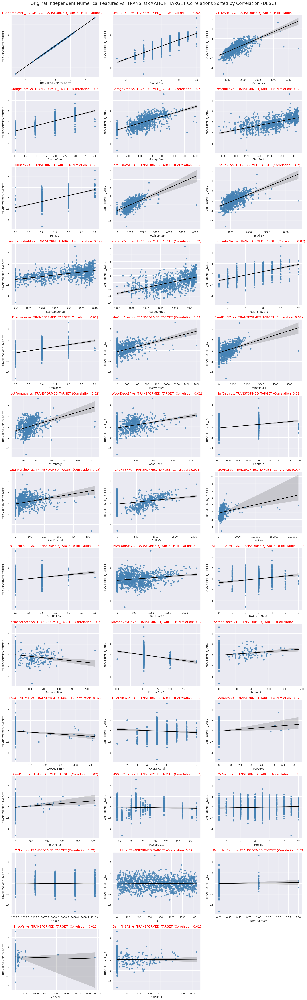

In [ ]:
transformed_target_df = train_df.copy()
transformed_target_df['TRANSFORMED_TARGET'] = QuantileTransformer(output_distribution='normal', n_quantiles=100).fit_transform(transformed_target_df['SalePrice'].values.reshape(-1,1))

transformed_target_df = transformed_target_df.drop('SalePrice',axis=1)

# Select numerical columns from train_df
numerical_columns = transformed_target_df.select_dtypes(include='number')

# Select numerical columns from train_df
corr = numerical_columns.corr()

# Sort columns by correlation with tranformed 'SalePrice' in ascending order
sorted_columns = abs(corr['TRANSFORMED_TARGET']).sort_values(ascending=False).index

# Calculated the number of rows and columns for the subplots
num_cols = 3
num_rows = (num_plots - 1) // num_cols + 1

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

# Add the main title to the entire set of subplots
fig.suptitle("Original Independent Numerical Features vs. TRANSFORMATION_TARGET Correlations Sorted by Correlation (DESC)", y=1, fontsize=20)

# Create a scatter plot for each combination 
for i, column in enumerate(sorted_columns):

    row_idx = i // num_cols
    col_idx = i % num_cols

    correlation = corr.loc[col, 'TRANSFORMED_TARGET']
    sns.regplot(x=column, y='TRANSFORMED_TARGET', data=transformed_target_df, color='steelblue', ax=axes[row_idx, col_idx], line_kws={'color':'black'} )
    axes[row_idx, col_idx].set_xlabel(column, fontsize=12)
    axes[row_idx, col_idx].set_ylabel('TRANSFORMED_TARGET', fontsize=12)
    axes[row_idx, col_idx].set_title(f'{column} vs. TRANSFORMED_TARGET (Correlation: {correlation:.2f})', fontsize=14, color='red')
    axes[row_idx, col_idx].grid('True')

# Remove any empty subplots
for i in range(num_plots, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

# Adjust layout 
plt.tight_layout()
plt.show()


`Let's visualize Transformed Correlation Matrix`

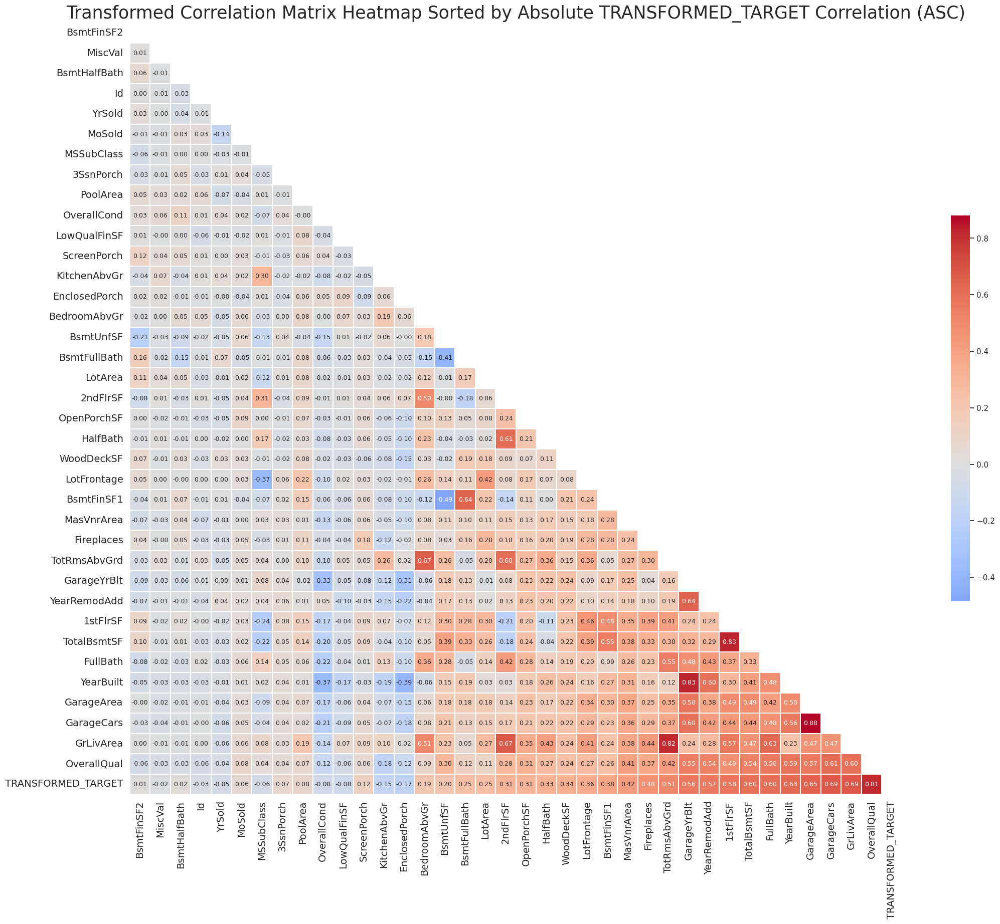

In [ ]:
# Select numerical columns from train_df
numerical_columns = transformed_target_df.select_dtypes(include='number')

# Compute the correlation matrix
corr = numerical_columns.corr()

# Sort columns by correlation with 'SalePrice' in descending order
sorted_columns = abs(corr['TRANSFORMED_TARGET']).sort_values(ascending=True).index
corr = corr.loc[sorted_columns, sorted_columns]

# Generate a mask for the upper triangle (otherwise this looks like the square we had and is redundant)
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
fig, axes = plt.subplots(figsize=(25, 20))

# Generate a custom diverging colormap 
cmap = sns.color_palette('coolwarm',as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, 
            square=True, linecolor='white', linewidths=0.01, cbar_kws={'shrink' : 0.5},
            annot=True, fmt='.2f', annot_kws={'fontsize' : 9}, cbar=True)

# Set x and y label  font size
axes.tick_params(axis='x', labelsize=14, rotation=90)
axes.tick_params(axis='y', labelsize=14)

# Add a title 
plt.title("Transformed Correlation Matrix Heatmap Sorted by Absolute TRANSFORMED_TARGET Correlation (ASC)", fontsize=25)

# Remove grid lines from the upper-right triangle
axes.set_facecolor('white')

plt.show()

### Missing Value Exploration

*We may consider deleting features with more than 90% of missing values in it or use techniques to impute them*

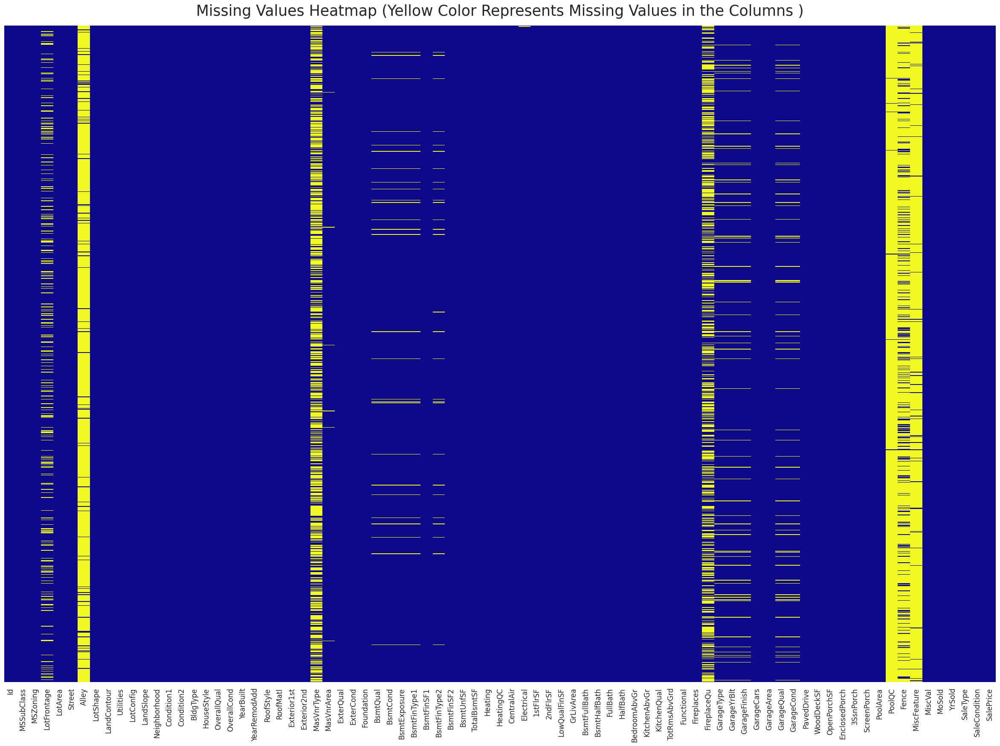

In [ ]:
### Visualize the missing values in training data

# Get names of columns with missing values
cols_with_missing = [col for col in train_df.columns if train_df[col].isnull().any()]

plt.figure(figsize=(30, 20))

sns.heatmap(train_df.isnull(), yticklabels=False, cbar=False, cmap='plasma')

# Customize the size of the axis labels
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=8)
plt.title('Missing Values Heatmap (Yellow Color Represents Missing Values in the Columns )', fontsize=25, y=1.01)
plt.show()

In [ ]:
def null_statistics(df):

    # Create a DataFrame to show column information 
    null_info = pd.DataFrame({
        'Column Name' : df.columns,
        'Columns Data Type' : df.dtypes,
        'Null Values' : df.isnull().sum(),
        'Null Percentage' : df.isnull().mean() * 100
    })

    null_info.reset_index(drop=True, inplace=True)

    null_info = null_info[null_info['Null Values'] > 0]
    null_info = null_info.sort_values(by='Null Values', ascending=False).reset_index(drop=True)

    print("")
    print(f"There are {null_info.shape[0]} columns ({null_info.shape[0] / len(df.columns) * 100:,.2f} %) with Null Values out of ({len(df.columns)} columns in DataFrame.)")
    print("")

    return null_info

train_null_data = null_statistics(train_df)
train_null_data


There are 19 columns (23.46 %) with Null Values out of (81 columns in DataFrame.)



,Column Name,Columns Data Type,Null Values,Null Percentage
0,PoolQC,object,1161,99.400685
1,MiscFeature,object,1122,96.061644
2,Alley,object,1096,93.835616
3,Fence,object,943,80.736301
4,MasVnrType,object,706,60.445205
5,FireplaceQu,object,548,46.917808
6,LotFrontage,float64,212,18.150685
7,GarageType,object,66,5.650685
8,GarageYrBlt,float64,66,5.650685
9,GarageFinish,object,66,5.650685


### Outlier Exploration

*This time we will not remove any outlier, because we have small dataset. we will apply techniques to handle them, so they don't adversely impact prediction*

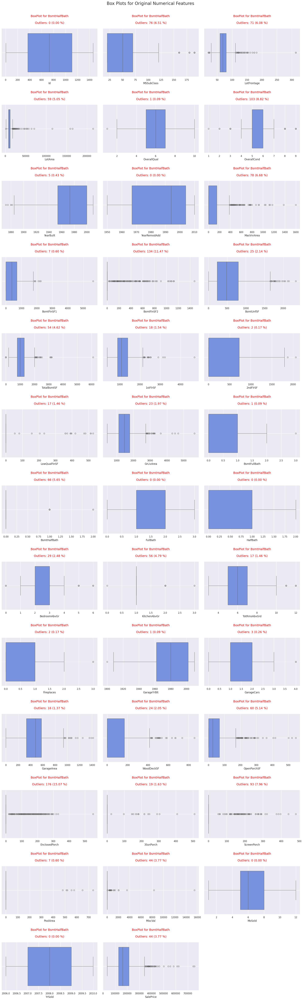

In [ ]:
# Select numerical columns from train_df
numerical_columns =  train_df.select_dtypes(include='number')

# Sort columns y correlation with 'SalePrice' in ascending order
sorted_columns = numerical_columns.columns

# Calculate the number of rows and columns for the subplots
num_plots = len(sorted_columns)

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = (num_plots - 1 ) // num_cols + 1

# Create subplots 
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

# Add the main title to the entire set of subplots
fig.suptitle("Box Plots for Original Numerical Features ", y=1, fontsize=20)

# Create a box plot for each feature
for i, column in enumerate(sorted_columns):

    # Calculate the current row and column for the subplot
    row_idx = i // num_cols
    col_idx = i % num_cols

    # Calculate and add information about outliers
    Q1 = train_df[column].quantile(0.25)
    Q3 = train_df[column].quantile(0.75)
    IQR = Q3 - Q1

    iqr_outlier = (train_df[column] < Q1 - 1.5 * IQR) | (train_df[column] > Q3 + 1.5 * IQR)
    percent_iqr_outliers = (sum(iqr_outlier)  / len(train_df)) * 100

    sns.boxplot(x=train_df[column], ax=axes[row_idx, col_idx])
    axes[row_idx, col_idx].set_xlabel(column, fontsize=12)
    axes[row_idx, col_idx].set_title(f'\nBoxPlot for {col}\n\nOutliers: {sum(iqr_outlier)} ({percent_iqr_outliers:.2f} %)\n', fontsize=14, color='red')
    axes[row_idx, col_idx].grid(True)

# Remove any empty subplots
for i in range(num_plots, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

# Adjust layout 
plt.tight_layout()
plt.show()



*Those plot above demonstrate the outlier in entire numerical columns*

*These code below was copied completely without recode myself*

*This function was here to show us what happen to the specific feature if we transform it using these technique*

## 2. Data Preprocessing

In the following section, we will work on a pivotal phase in the machine learning pipeline - **Data Preprocessing**. This stage arguably the most crucial ensuring the success of our ml model Through meticulous data cleaning, thoughtful transformation, and strategic adjustment, we will refine our dataset to optimize it for the training process. This process is indispensable for addressing missing values, handling outliers, and molding the data into format that is amenable to machine learning algorithm. Our goal is to prepare a high-quality dataset that serves a the foundation for building robust and accurate machine learning models.

In [ ]:
train_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1070,1071,20,RL,72.0,10152,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,1956,1956,Hip,CompShg,MetalSd,MetalSd,BrkFace,120.0,TA,TA,CBlock,TA,TA,No,BLQ,586,Unf,0,462,1048,GasA,TA,Y,SBrkr,1048,0,0,1048,1,0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1956.0,Unf,1,286,TA,TA,Y,0,20,0,0,192,0,NaN,NaN,NaN,0,6,2007,WD,Normal,135000
1379,1380,80,RL,73.0,9735,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,167500
138,139,60,RL,73.0,9066,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,320.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,668,Unf,0,336,1004,GasA,Ex,Y,SBrkr,1004,848,0,1852,0,0,2,1,3,1,Gd,7,Typ,2,TA,Attchd,1999.0,Fin,3,660,TA,TA,Y,224,106,0,0,0,0,NaN,GdPrv,NaN,0,12,2008,WD,Normal,230000
667,668,20,RL,65.0,8125,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,6,5,1994,1998,Gable,CompShg,HdBoard,HdBoard,BrkFace,258.0,TA,TA,PConc,Gd,TA,No,GLQ,1138,Unf,0,270,1408,GasA,Ex,Y,SBrkr,1679,0,0,1679,1,0,2,0,3,1,Gd,7,Typ,1,Fa,Attchd,1994.0,RFn,2,575,TA,TA,Y,224,42,0,0,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal,193500
1215,1216,20,RL,99.0,7094,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1966,1966,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,180,LwQ,374,340,894,GasA,TA,Y,SBrkr,894,0,0,894,0,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1966.0,RFn,1,384,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,5,2007,WD,Normal,125000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356,357,20,RL,NaN,9248,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,6,1992,1992,Gable,CompShg,HdBoard,HdBoard,BrkFace,106.0,TA,TA,PConc,Gd,TA,No,GLQ,560,Unf,0,598,1158,GasA,Gd,Y,SBrkr,1167,0,0,1167,1,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,1992.0,RFn,2,400,TA,TA,Y,120,26,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,173000
960,961,20,RL,50.0,7207,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1Story,5,7,1958,2008,Gable,CompShg,Wd Sdng,Plywood,NaN,0.0,TA,Gd,CBlock,TA,TA,Gd,BLQ,696,Unf,0,162,858,GasA,Gd,Y,SBrkr,858,0,0,858,1,0,1,0,2,1,TA,4,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,117,0,0,0,0,0,NaN,NaN,NaN,0,2,2010,WD,Normal,116500
812,813,20,C (all),66.0,8712,Grvl,NaN,Reg,Bnk,AllPub,Inside,Mod,IDOTRR,Norm,Norm,1Fam,1Story,5,5,1952,1952,Hip,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,Fa,TA,CBlock,TA,TA,Av,Unf,0,Unf,0,540,540,GasA,TA,N,FuseA,1044,0,0,1044,0,0,1,0,2,1,Fa,4,Typ,0,NaN,Basment,1952.0,Unf,2,504,TA,TA,N,0,0,0,0,0,0,NaN,NaN,Shed,54,6,2010,WD,Alloca,55993
132,133,20,RL,75.0,7388,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1959,2002,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,405,Unf,0,658,1063,Ga

In [ ]:
train_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea',
       'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'Ope

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1168 entries, 1070 to 885
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    956 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          72 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallCond

In [ ]:
train_df.shape

(1168, 81)

In [ ]:
prep_train_df = train_df.copy()

### 2.1 Remove Id Column

In [ ]:
def drop_id_column(df, id_column_name='Id'):

    dropped_id_column = df[id_column_name].copy()
    df = df.drop(id_column_name, axis=1)

    return df, dropped_id_column

In [ ]:
prep_train_df, train_id_column = drop_id_column(prep_train_df)


In [ ]:
prep_train_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1070,20,RL,72.0,10152,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,1956,1956,Hip,CompShg,MetalSd,MetalSd,BrkFace,120.0,TA,TA,CBlock,TA,TA,No,BLQ,586,Unf,0,462,1048,GasA,TA,Y,SBrkr,1048,0,0,1048,1,0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1956.0,Unf,1,286,TA,TA,Y,0,20,0,0,192,0,NaN,NaN,NaN,0,6,2007,WD,Normal,135000
1379,80,RL,73.0,9735,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,167500
138,60,RL,73.0,9066,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,320.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,668,Unf,0,336,1004,GasA,Ex,Y,SBrkr,1004,848,0,1852,0,0,2,1,3,1,Gd,7,Typ,2,TA,Attchd,1999.0,Fin,3,660,TA,TA,Y,224,106,0,0,0,0,NaN,GdPrv,NaN,0,12,2008,WD,Normal,230000
667,20,RL,65.0,8125,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,6,5,1994,1998,Gable,CompShg,HdBoard,HdBoard,BrkFace,258.0,TA,TA,PConc,Gd,TA,No,GLQ,1138,Unf,0,270,1408,GasA,Ex,Y,SBrkr,1679,0,0,1679,1,0,2,0,3,1,Gd,7,Typ,1,Fa,Attchd,1994.0,RFn,2,575,TA,TA,Y,224,42,0,0,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal,193500
1215,20,RL,99.0,7094,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1966,1966,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,180,LwQ,374,340,894,GasA,TA,Y,SBrkr,894,0,0,894,0,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1966.0,RFn,1,384,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,5,2007,WD,Normal,125000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356,20,RL,NaN,9248,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,6,1992,1992,Gable,CompShg,HdBoard,HdBoard,BrkFace,106.0,TA,TA,PConc,Gd,TA,No,GLQ,560,Unf,0,598,1158,GasA,Gd,Y,SBrkr,1167,0,0,1167,1,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,1992.0,RFn,2,400,TA,TA,Y,120,26,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal,173000
960,20,RL,50.0,7207,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1Story,5,7,1958,2008,Gable,CompShg,Wd Sdng,Plywood,NaN,0.0,TA,Gd,CBlock,TA,TA,Gd,BLQ,696,Unf,0,162,858,GasA,Gd,Y,SBrkr,858,0,0,858,1,0,1,0,2,1,TA,4,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,117,0,0,0,0,0,NaN,NaN,NaN,0,2,2010,WD,Normal,116500
812,20,C (all),66.0,8712,Grvl,NaN,Reg,Bnk,AllPub,Inside,Mod,IDOTRR,Norm,Norm,1Fam,1Story,5,5,1952,1952,Hip,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,Fa,TA,CBlock,TA,TA,Av,Unf,0,Unf,0,540,540,GasA,TA,N,FuseA,1044,0,0,1044,0,0,1,0,2,1,Fa,4,Typ,0,NaN,Basment,1952.0,Unf,2,504,TA,TA,N,0,0,0,0,0,0,NaN,NaN,Shed,54,6,2010,WD,Alloca,55993
132,20,RL,75.0,7388,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1959,2002,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,405,Unf,0,658,1063,GasA,Gd,Y,SBrkr,1327,0,0,1327,1,0,1,0,3,1,Gd,7,T

In [ ]:
train_id_column

1070    1071
1379    1380
138      139
667      668
1215    1216
        ... 
356      357
960      961
812      813
132      133
885      886
Name: Id, Length: 1168, dtype: int64

### 2.2 Remove Target Column (SalePrice)

In [ ]:
def drop_target_column(df, target_column_name='SalePrice'):

    dropped_target_column = df[target_column_name].copy()
    df = df.drop([target_column_name], axis=1)

    return df, dropped_target_column




In [ ]:
prep_train_df, train_target_column = drop_target_column(prep_train_df)

In [ ]:
prep_train_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1070,20,RL,72.0,10152,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,1956,1956,Hip,CompShg,MetalSd,MetalSd,BrkFace,120.0,TA,TA,CBlock,TA,TA,No,BLQ,586,Unf,0,462,1048,GasA,TA,Y,SBrkr,1048,0,0,1048,1,0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1956.0,Unf,1,286,TA,TA,Y,0,20,0,0,192,0,NaN,NaN,NaN,0,6,2007,WD,Normal
1379,80,RL,73.0,9735,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal
138,60,RL,73.0,9066,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,320.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,668,Unf,0,336,1004,GasA,Ex,Y,SBrkr,1004,848,0,1852,0,0,2,1,3,1,Gd,7,Typ,2,TA,Attchd,1999.0,Fin,3,660,TA,TA,Y,224,106,0,0,0,0,NaN,GdPrv,NaN,0,12,2008,WD,Normal
667,20,RL,65.0,8125,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,6,5,1994,1998,Gable,CompShg,HdBoard,HdBoard,BrkFace,258.0,TA,TA,PConc,Gd,TA,No,GLQ,1138,Unf,0,270,1408,GasA,Ex,Y,SBrkr,1679,0,0,1679,1,0,2,0,3,1,Gd,7,Typ,1,Fa,Attchd,1994.0,RFn,2,575,TA,TA,Y,224,42,0,0,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal
1215,20,RL,99.0,7094,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1966,1966,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,180,LwQ,374,340,894,GasA,TA,Y,SBrkr,894,0,0,894,0,0,1,0,3,1,TA,5,Typ,0,NaN,Detchd,1966.0,RFn,1,384,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,5,2007,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
356,20,RL,NaN,9248,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,6,1992,1992,Gable,CompShg,HdBoard,HdBoard,BrkFace,106.0,TA,TA,PConc,Gd,TA,No,GLQ,560,Unf,0,598,1158,GasA,Gd,Y,SBrkr,1167,0,0,1167,1,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,1992.0,RFn,2,400,TA,TA,Y,120,26,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
960,20,RL,50.0,7207,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1Story,5,7,1958,2008,Gable,CompShg,Wd Sdng,Plywood,NaN,0.0,TA,Gd,CBlock,TA,TA,Gd,BLQ,696,Unf,0,162,858,GasA,Gd,Y,SBrkr,858,0,0,858,1,0,1,0,2,1,TA,4,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,117,0,0,0,0,0,NaN,NaN,NaN,0,2,2010,WD,Normal
812,20,C (all),66.0,8712,Grvl,NaN,Reg,Bnk,AllPub,Inside,Mod,IDOTRR,Norm,Norm,1Fam,1Story,5,5,1952,1952,Hip,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,Fa,TA,CBlock,TA,TA,Av,Unf,0,Unf,0,540,540,GasA,TA,N,FuseA,1044,0,0,1044,0,0,1,0,2,1,Fa,4,Typ,0,NaN,Basment,1952.0,Unf,2,504,TA,TA,N,0,0,0,0,0,0,NaN,NaN,Shed,54,6,2010,WD,Alloca
132,20,RL,75.0,7388,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1959,2002,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,405,Unf,0,658,1063,GasA,Gd,Y,SBrkr,1327,0,0,1327,1,0,1,0,3,1,Gd,7,Typ,0,NaN,Detchd,1974.0,Unf,2,624,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,

In [ ]:
train_target_column

1070    135000
1379    167500
138     230000
667     193500
1215    125000
         ...  
356     173000
960     116500
812      55993
132     150750
885     328900
Name: SalePrice, Length: 1168, dtype: int64

### 2.3 Fill Missing Values
- For **Numerical Columns** we will impute Null values using **KNNImputer**
- For **Categorical Columns** we will impute NUll values with **ConstantValue = "Unknown"**


In [ ]:
null_statistics(prep_train_df)


There are 19 columns (24.05 %) with Null Values out of (79 columns in DataFrame.)



,Column Name,Columns Data Type,Null Values,Null Percentage
0,PoolQC,object,1161,99.400685
1,MiscFeature,object,1122,96.061644
2,Alley,object,1096,93.835616
3,Fence,object,943,80.736301
4,MasVnrType,object,706,60.445205
5,FireplaceQu,object,548,46.917808
6,LotFrontage,float64,212,18.150685
7,GarageType,object,66,5.650685
8,GarageYrBlt,float64,66,5.650685
9,GarageFinish,object,66,5.650685


In [ ]:
# Define categorical and numerical columns
num_columns = prep_train_df.select_dtypes(include=['int64', 'float64']).columns
cat_columns = prep_train_df.select_dtypes(include=['object','category']).columns

# Impute numerical columns
num_imputer = KNNImputer(n_neighbors=5, weights='distance')
num_imputed_data = num_imputer.fit_transform(prep_train_df[num_columns])
num_imputed_df = pd.DataFrame(num_imputed_data, columns=num_columns)
num_imputed_df

# Impute Categorical columns
cat_imputer = SimpleImputer(strategy='constant', fill_value='Unknown')
cat_imputed_data = cat_imputer.fit_transform(prep_train_df[cat_columns])
cat_imputed_df = pd.DataFrame(cat_imputed_data, columns=cat_columns)
cat_imputed_df

# Combine the two DataFrame back together, excellent
prep_train_filled_df = pd.concat([ cat_imputed_df, num_imputed_df], axis=1)
prep_train_filled_df    

# Ensure column order and data type are consistent, excellent
prep_train_filled_df = prep_train_filled_df[prep_train_df.columns]
prep_train_filled_df

for col in num_columns:
    prep_train_filled_df[col] = prep_train_filled_df[col].astype(prep_train_df[col].dtype)



In [ ]:
null_statistics(prep_train_filled_df)


There are 0 columns (0.00 %) with Null Values out of (79 columns in DataFrame.)



,Column Name,Columns Data Type,Null Values,Null Percentage


In [ ]:
prep_train_filled_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RL,72.000000,10152,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,1956,1956,Hip,CompShg,MetalSd,MetalSd,BrkFace,120.0,TA,TA,CBlock,TA,TA,No,BLQ,586,Unf,0,462,1048,GasA,TA,Y,SBrkr,1048,0,0,1048,1,0,1,0,3,1,TA,6,Typ,0,Unknown,Attchd,1956.000000,Unf,1,286,TA,TA,Y,0,20,0,0,192,0,Unknown,Unknown,Unknown,0,6,2007,WD,Normal
1,80,RL,73.000000,9735,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,Unknown,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,Unknown,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,Unknown,BuiltIn,2007.000000,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,Unknown,Unknown,Unknown,0,5,2008,WD,Normal
2,60,RL,73.000000,9066,Pave,Unknown,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,320.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,668,Unf,0,336,1004,GasA,Ex,Y,SBrkr,1004,848,0,1852,0,0,2,1,3,1,Gd,7,Typ,2,TA,Attchd,1999.000000,Fin,3,660,TA,TA,Y,224,106,0,0,0,0,Unknown,GdPrv,Unknown,0,12,2008,WD,Normal
3,20,RL,65.000000,8125,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,6,5,1994,1998,Gable,CompShg,HdBoard,HdBoard,BrkFace,258.0,TA,TA,PConc,Gd,TA,No,GLQ,1138,Unf,0,270,1408,GasA,Ex,Y,SBrkr,1679,0,0,1679,1,0,2,0,3,1,Gd,7,Typ,1,Fa,Attchd,1994.000000,RFn,2,575,TA,TA,Y,224,42,0,0,0,0,Unknown,Unknown,Unknown,0,10,2008,WD,Normal
4,20,RL,99.000000,7094,Pave,Unknown,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1966,1966,Gable,CompShg,VinylSd,VinylSd,Unknown,0.0,TA,TA,CBlock,TA,TA,No,Rec,180,LwQ,374,340,894,GasA,TA,Y,SBrkr,894,0,0,894,0,0,1,0,3,1,TA,5,Typ,0,Unknown,Detchd,1966.000000,RFn,1,384,TA,TA,Y,0,0,0,0,0,0,Unknown,MnPrv,Unknown,0,5,2007,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,20,RL,77.952747,9248,Pave,Unknown,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,6,1992,1992,Gable,CompShg,HdBoard,HdBoard,BrkFace,106.0,TA,TA,PConc,Gd,TA,No,GLQ,560,Unf,0,598,1158,GasA,Gd,Y,SBrkr,1167,0,0,1167,1,0,2,0,3,1,Gd,6,Typ,0,Unknown,Attchd,1992.000000,RFn,2,400,TA,TA,Y,120,26,0,0,0,0,Unknown,Unknown,Unknown,0,7,2009,WD,Normal
1164,20,RL,50.000000,7207,Pave,Unknown,IR1,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1Story,5,7,1958,2008,Gable,CompShg,Wd Sdng,Plywood,Unknown,0.0,TA,Gd,CBlock,TA,TA,Gd,BLQ,696,Unf,0,162,858,GasA,Gd,Y,SBrkr,858,0,0,858,1,0,1,0,2,1,TA,4,Typ,0,Unknown,Unknown,1966.049213,Unknown,0,0,Unknown,Unknown,Y,117,0,0,0,0,0,Unknown,Unknown,Unknown,0,2,2010,WD,Normal
1165,20,C (all),66.000000,8712,Grvl,Unknown,Reg,Bnk,AllPub,Inside,Mod,IDOTRR,Norm,Norm,1Fam,1Story,5,5,1952,1952,Hip,CompShg,Wd Sdng,Wd Sdng,Unknown,0.0,Fa,TA,CBlock,TA,TA,Av,Unf,0,Unf,0,540,540,GasA,TA,N,FuseA,1044,0,0,1044,0,0,1,0,2,1,Fa,4,Typ,0,Unknown,Basment,1952.000000,Unf,2,504,TA,TA,N,0,0,0,0,0,0,Unknown,Unknown,Shed,54,6,2010,WD,Alloca
1166,20,RL,75.000000,7388,Pave,Unknown,Reg,Lvl,

### 2.4 Feature Engineering

In [ ]:
# You Must have experience in this kind of field in order to custom these feature on purpose.
# All of these code was copied completely form the original without modification, Why,
# You need to analyze all those plot above combine with your experience in order to make these engineering,
# This's not a playground for amateur player.
def custom_features(df):

    # TotalBsmtSF = BSmtFinSF1 + BsmtFinSF2 + BsmtUnfSF
    # GrLivArea = 1stFlrSF + 2ndFlrSF

    df['TotalSF_NEW'] = df['TotalBsmtSF'] + df['GrLivArea']
    df['TotalBath_NEW'] = df['FullBath'] + 0.5 * df['HalfBath'] + df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath']
    df['TotalSF_PerRoomOrBath_NEW'] = df['TotalSF_NEW'] / (df['TotRmsAbvGrd'] + df['TotalBath_NEW'])
    df['TotalSF_PerRoom_NEW'] = df['TotalSF_NEW'] / df['TotRmsAbvGrd']
    df['OverallQual_PerSF_NEW'] = df['OverallQual'] + df['TotalSF_NEW']
    df['TotalOutdoorSF_NEW'] = df['WoodDeckSF'] + df['OpenPorchSF'] + df['EnclosedPorch'] + df['ScreenPorch'] + df['3SsnPorch']
    df['SF_ByBedroom_NEW'] = df['GrLivArea'] / df['TotRmsAbvGrd']
    df['TotalLivingAreaRatio_NEW'] = df['GrLivArea'] / df['LotArea']

    df['PropertyAgeSold_NEW'] = df['YrSold'] - df['YearBuilt']
    df['AgeSinceLastRemodel_NEW'] = df['YrSold'] - df['YearRemodAdd']
    df['AgeRemodelAfterBuilt_NEW'] = df['YearRemodAdd'] - df['YearBuilt']
    df['GarageAgeAtSale'] = df['YrSold'] - df['GarageYrBlt']
    df['SeasonSold_NEW'] = df['MoSold'].map({1 : 'Winter',2 : 'Winter',3 : 'Spring',4 : 'Spring',5 : 'Spring',6 : 'Summer',7 : 'Summer',8 : 'Summer',9 : 'Fall',10 : 'Fall',11 : 'Fall',12 : 'Winter'})
    df['HasRemodeled_NEW'] = (df['YearRemodAdd'] != df['YearBuilt']).astype(str)
    df['Has2ndFloor_NEW'] = (df['2ndFlrSF'] > 0).astype(str)
    df['HasGarage_NEW'] = (df['GarageArea'] > 0).astype(str)
    df['HasFireplace_NEW'] = (df['Fireplaces'] > 0).astype(str)
    df['HasWoodDeck_NEW'] = (df['WoodDeckSF'] > 0).astype(str)
    df['HasBasement_NEW'] = (df['TotalBsmtSF'] > 0).astype(str)

    df['HasPool_NEW'] = (df['PoolArea'] > 0).astype(str)
    df['HasPorch_NEW'] = ((df['OpenPorchSF'] > 0) | (df['EnclosedPorch'] > 0) | (df['ScreenPorch'] > 0) | (df['3SsnPorch'] > 0)).astype(str)
    df['HasFullBath_NEW'] = (df['FullBath'] > 0).astype(str)
    df['HasHalfBath_NEW'] = (df['HalfBath'] > 0).astype(str)
    df['HasSecondKitchen_NEW'] = ((df['BsmtFullBath'] > 0) | (df['BsmtHalfBath'] > 0)).astype(str)
    df['HasBasementBathroom_NEW'] = ((df['BsmtFullBath'] > 0) | (df['BsmtHalfBath'] > 0)).astype(str)
    df['HasMultipleFireplaces_NEW'] = (df['Fireplaces'] > 1).astype(str)
    df['HasMultipleFullBath_NEW'] = (df['FullBath'] >= 2).astype(str)
    df['HasThreeOrMoreBedrooms_NEW'] = (df['BedroomAbvGr'] >= 3).astype(str)
    df['HasHighOverallQual_NEW'] = (df['OverallQual'] >= 8).astype(str)

    return df


In [ ]:
prep_train_filled_fe_df = custom_features(prep_train_filled_df.copy())

In [ ]:
prep_train_filled_fe_df


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,TotalSF_NEW,TotalBath_NEW,TotalSF_PerRoomOrBath_NEW,TotalSF_PerRoom_NEW,OverallQual_PerSF_NEW,TotalOutdoorSF_NEW,SF_ByBedroom_NEW,TotalLivingAreaRatio_NEW,PropertyAgeSold_NEW,AgeSinceLastRemodel_NEW,AgeRemodelAfterBuilt_NEW,GarageAgeAtSale,SeasonSold_NEW,HasRemodeled_NEW,Has2ndFloor_NEW,HasGarage_NEW,HasFireplace_NEW,HasWoodDeck_NEW,HasBasement_NEW,HasPool_NEW,HasPorch_NEW,HasFullBath_NEW,HasHalfBath_NEW,HasSecondKitchen_NEW,HasBasementBathroom_NEW,HasMultipleFireplaces_NEW,HasMultipleFullBath_NEW,HasThreeOrMoreBedrooms_NEW,HasHighOverallQual_NEW
0,20,RL,72.000000,10152,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,1956,1956,Hip,CompShg,MetalSd,MetalSd,BrkFace,120.0,TA,TA,CBlock,TA,TA,No,BLQ,586,Unf,0,462,1048,GasA,TA,Y,SBrkr,1048,0,0,1048,1,0,1,0,3,1,TA,6,Typ,0,Unknown,Attchd,1956.000000,Unf,1,286,TA,TA,Y,0,20,0,0,192,0,Unknown,Unknown,Unknown,0,6,2007,WD,Normal,2096,2.0,262.000000,349.333333,2101,212,174.666667,0.103231,51,51,0,51.000000,Summer,False,False,True,False,False,True,False,True,True,False,True,True,False,False,True,False
1,80,RL,73.000000,9735,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,Unknown,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,Unknown,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,Unknown,BuiltIn,2007.000000,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,Unknown,Unknown,Unknown,0,5,2008,WD,Normal,1778,2.5,187.157895,254.000000,1783,100,199.142857,0.143195,2,1,1,1.000000,Spring,True,True,True,False,True,True,False,False,True,True,False,False,False,True,True,False
2,60,RL,73.000000,9066,Pave,Unknown,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,320.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,668,Unf,0,336,1004,GasA,Ex,Y,SBrkr,1004,848,0,1852,0,0,2,1,3,1,Gd,7,Typ,2,TA,Attchd,1999.000000,Fin,3,660,TA,TA,Y,224,106,0,0,0,0,Unknown,GdPrv,Unknown,0,12,2008,WD,Normal,2856,2.5,300.631579,408.000000,2864,330,264.571429,0.204280,9,8,1,9.000000,Winter,True,True,True,True,True,True,False,True,True,True,False,False,True,True,True,True
3,20,RL,65.000000,8125,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,6,5,1994,1998,Gable,CompShg,HdBoard,HdBoard,BrkFace,258.0,TA,TA,PConc,Gd,TA,No,GLQ,1138,Unf,0,270,1408,GasA,Ex,Y,SBrkr,1679,0,0,1679,1,0,2,0,3,1,Gd,7,Typ,1,Fa,Attchd,1994.000000,RFn,2,575,TA,TA,Y,224,42,0,0,0,0,Unknown,Unknown,Unknown,0,10,2008,WD,Normal,3087,3.0,308.700000,441.000000,3093,266,239.857143,0.206646,14,10,4,14.000000,Fall,True,False,True,True,True,True,False,True,True,False,True,True,False,True,True,False
4,20,RL,99.000000,7094,Pave,Unknown,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1966,1966,Gable,CompShg,VinylSd,VinylSd,Unknown,0.0,TA,TA,CBlock,TA,TA,No,Rec,180,LwQ,374,340,894,GasA,TA,Y,SBrkr,894,0,0,894,0,0,1,0,3,1,TA,5,Typ,0,Unknown,Detchd,1966.000000,RFn,1,384,TA,TA,Y,0,0,0,0,0,0,Unknown,MnPrv,Unknown,0,5,2007,WD,Normal,1788,1.0,298.000000,357.600000,1793,0,178.800000,0.126022,41,41,0,41.000000,Spring,False,False,True,False,False,True,False,False,True,False,False,False,False,False,True,False
...,...,...,...,...,...,

### 2.5 Convert Columns to Correct Data Types

In [ ]:
def convert_to_correct_dtypes(df):

    # Remove digits from Year and Month columns in case they appear after KNNInputer
    df['MSSubClass'] = df['MSSubClass'].astype('int64')
    df['YearBuilt'] = df['YearBuilt'].astype('int64')
    df['YearRemodAdd'] = df['YearRemodAdd'].astype('int64')
    df['GarageYrBlt'] = df['GarageYrBlt'].astype('int64')
    df['MoSold'] = df['MoSold'].astype('int64')
    df['YrSold'] = df['YrSold'].astype('int64')

    # Convert to correct data type
    df['MSSubClass']  = df['MSSubClass'].astype('object')
    df['YearBuilt'] = df['YearBuilt'].astype('object')
    df['YearRemodAdd'] = df['YearRemodAdd'].astype('object')
    df['GarageYrBlt'] = df['GarageYrBlt'].astype('object')
    df['MoSold'] = df['MoSold'].astype('object')
    df['YrSold'] = df['YrSold'].astype('object')

    return df


In [ ]:
prep_train_filled_fe_conv_df = convert_to_correct_dtypes(prep_train_filled_fe_df.copy())

In [ ]:
prep_train_filled_fe_conv_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,TotalSF_NEW,TotalBath_NEW,TotalSF_PerRoomOrBath_NEW,TotalSF_PerRoom_NEW,OverallQual_PerSF_NEW,TotalOutdoorSF_NEW,SF_ByBedroom_NEW,TotalLivingAreaRatio_NEW,PropertyAgeSold_NEW,AgeSinceLastRemodel_NEW,AgeRemodelAfterBuilt_NEW,GarageAgeAtSale,SeasonSold_NEW,HasRemodeled_NEW,Has2ndFloor_NEW,HasGarage_NEW,HasFireplace_NEW,HasWoodDeck_NEW,HasBasement_NEW,HasPool_NEW,HasPorch_NEW,HasFullBath_NEW,HasHalfBath_NEW,HasSecondKitchen_NEW,HasBasementBathroom_NEW,HasMultipleFireplaces_NEW,HasMultipleFullBath_NEW,HasThreeOrMoreBedrooms_NEW,HasHighOverallQual_NEW
0,20,RL,72.000000,10152,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,5,1956,1956,Hip,CompShg,MetalSd,MetalSd,BrkFace,120.0,TA,TA,CBlock,TA,TA,No,BLQ,586,Unf,0,462,1048,GasA,TA,Y,SBrkr,1048,0,0,1048,1,0,1,0,3,1,TA,6,Typ,0,Unknown,Attchd,1956,Unf,1,286,TA,TA,Y,0,20,0,0,192,0,Unknown,Unknown,Unknown,0,6,2007,WD,Normal,2096,2.0,262.000000,349.333333,2101,212,174.666667,0.103231,51,51,0,51.000000,Summer,False,False,True,False,False,True,False,True,True,False,True,True,False,False,True,False
1,80,RL,73.000000,9735,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,Unknown,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,Unknown,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,Unknown,BuiltIn,2007,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,Unknown,Unknown,Unknown,0,5,2008,WD,Normal,1778,2.5,187.157895,254.000000,1783,100,199.142857,0.143195,2,1,1,1.000000,Spring,True,True,True,False,True,True,False,False,True,True,False,False,False,True,True,False
2,60,RL,73.000000,9066,Pave,Unknown,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,320.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,668,Unf,0,336,1004,GasA,Ex,Y,SBrkr,1004,848,0,1852,0,0,2,1,3,1,Gd,7,Typ,2,TA,Attchd,1999,Fin,3,660,TA,TA,Y,224,106,0,0,0,0,Unknown,GdPrv,Unknown,0,12,2008,WD,Normal,2856,2.5,300.631579,408.000000,2864,330,264.571429,0.204280,9,8,1,9.000000,Winter,True,True,True,True,True,True,False,True,True,True,False,False,True,True,True,True
3,20,RL,65.000000,8125,Pave,Unknown,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,6,5,1994,1998,Gable,CompShg,HdBoard,HdBoard,BrkFace,258.0,TA,TA,PConc,Gd,TA,No,GLQ,1138,Unf,0,270,1408,GasA,Ex,Y,SBrkr,1679,0,0,1679,1,0,2,0,3,1,Gd,7,Typ,1,Fa,Attchd,1994,RFn,2,575,TA,TA,Y,224,42,0,0,0,0,Unknown,Unknown,Unknown,0,10,2008,WD,Normal,3087,3.0,308.700000,441.000000,3093,266,239.857143,0.206646,14,10,4,14.000000,Fall,True,False,True,True,True,True,False,True,True,False,True,True,False,True,True,False
4,20,RL,99.000000,7094,Pave,Unknown,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1966,1966,Gable,CompShg,VinylSd,VinylSd,Unknown,0.0,TA,TA,CBlock,TA,TA,No,Rec,180,LwQ,374,340,894,GasA,TA,Y,SBrkr,894,0,0,894,0,0,1,0,3,1,TA,5,Typ,0,Unknown,Detchd,1966,RFn,1,384,TA,TA,Y,0,0,0,0,0,0,Unknown,MnPrv,Unknown,0,5,2007,WD,Normal,1788,1.0,298.000000,357.600000,1793,0,178.800000,0.126022,41,41,0,41.000000,Spring,False,False,True,False,False,True,False,False,True,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

In [ ]:
prep_train_filled_fe_conv_df[['MSSubClass', 'YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'MoSold', 'YrSold',]].info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   MSSubClass    1168 non-null   object
 1   YearBuilt     1168 non-null   object
 2   YearRemodAdd  1168 non-null   object
 3   GarageYrBlt   1168 non-null   object
 4   MoSold        1168 non-null   object
 5   YrSold        1168 non-null   object
dtypes: object(6)
memory usage: 54.9+ KB


### 2.6 Transformation And Scale Independent Numerical Columns

In [ ]:
prep_train_filled_fe_conv_NUM_df = prep_train_filled_fe_conv_df.select_dtypes(include='number').copy()

In [ ]:
prep_train_filled_fe_conv_NUM_df

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,TotalSF_NEW,TotalBath_NEW,TotalSF_PerRoomOrBath_NEW,TotalSF_PerRoom_NEW,OverallQual_PerSF_NEW,TotalOutdoorSF_NEW,SF_ByBedroom_NEW,TotalLivingAreaRatio_NEW,PropertyAgeSold_NEW,AgeSinceLastRemodel_NEW,AgeRemodelAfterBuilt_NEW,GarageAgeAtSale
0,72.000000,10152,5,5,120.0,586,0,462,1048,1048,0,0,1048,1,0,1,0,3,1,6,0,1,286,0,20,0,0,192,0,0,2096,2.0,262.000000,349.333333,2101,212,174.666667,0.103231,51,51,0,51.000000
1,73.000000,9735,5,5,0.0,0,0,384,384,754,640,0,1394,0,0,2,1,3,1,7,0,2,400,100,0,0,0,0,0,0,1778,2.5,187.157895,254.000000,1783,100,199.142857,0.143195,2,1,1,1.000000
2,73.000000,9066,8,5,320.0,668,0,336,1004,1004,848,0,1852,0,0,2,1,3,1,7,2,3,660,224,106,0,0,0,0,0,2856,2.5,300.631579,408.000000,2864,330,264.571429,0.204280,9,8,1,9.000000
3,65.000000,8125,6,5,258.0,1138,0,270,1408,1679,0,0,1679,1,0,2,0,3,1,7,1,2,575,224,42,0,0,0,0,0,3087,3.0,308.700000,441.000000,3093,266,239.857143,0.206646,14,10,4,14.000000
4,99.000000,7094,5,5,0.0,180,374,340,894,894,0,0,894,0,0,1,0,3,1,5,0,1,384,0,0,0,0,0,0,0,1788,1.0,298.000000,357.600000,1793,0,178.800000,0.126022,41,41,0,41.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,77.952747,9248,6,6,106.0,560,0,598,1158,1167,0,0,1167,1,0,2,0,3,1,6,0,2,400,120,26,0,0,0,0,0,2325,3.0,258.333333,387.500000,2331,146,194.500000,0.126189,17,17,0,17.000000
1164,50.000000,7207,5,7,0.0,696,0,162,858,858,0,0,858,1,0,1,0,2,1,4,0,0,0,117,0,0,0,0,0,0,1716,2.0,286.000000,429.000000,1721,117,214.500000,0.119051,52,2,50,43.950787
1165,66.000000,8712,5,5,0.0,0,0,540,540,1044,0,0,1044,0,0,1,0,2,1,4,0,2,504,0,0,0,0,0,0,54,1584,1.0,316.800000,396.000000,1589,0,261.000000,0.119835,58,58,0,58.000000
1166,75.000000,7388,5,6,0.0,405,0,658,1063,1327,0,0,1327,1,0,1,0,3,1,7,0,2,624,0,0,0,0,0,0,0,2390,2.0,265.555556,341.428571,2395,0,189.571429,0.179616,48,5,43,33.000000


In [ ]:
# Initialize PowerTransformer
power_transformer = PowerTransformer(method='yeo-johnson', standardize=False)

# Apply Power Transformation
num_train_transformed = power_transformer.fit_transform(prep_train_filled_fe_conv_NUM_df)

# Convert the result back to a DataFrame with columns names
prep_train_filled_fe_conv_NUM_TR_df = pd.DataFrame(num_train_transformed, columns=prep_train_filled_fe_conv_NUM_df.columns)

# Initialize RobustScaler
robust_scaler = RobustScaler()

# Applying Robust Scaler
num_train_scaled = robust_scaler.fit_transform(prep_train_filled_fe_conv_NUM_TR_df)

# Convert the result back to a DataFrame with column names
prep_train_filled_fe_conv_NUM_TR_SCALED_df = pd.DataFrame(num_train_scaled, columns=prep_train_filled_fe_conv_NUM_df.columns)


In [ ]:
prep_train_filled_fe_conv_NUM_TR_SCALED_df

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,TotalSF_NEW,TotalBath_NEW,TotalSF_PerRoomOrBath_NEW,TotalSF_PerRoom_NEW,OverallQual_PerSF_NEW,TotalOutdoorSF_NEW,SF_ByBedroom_NEW,TotalLivingAreaRatio_NEW,PropertyAgeSold_NEW,AgeSinceLastRemodel_NEW,AgeRemodelAfterBuilt_NEW,GarageAgeAtSale
0,0.097405,0.159483,-0.513706,0.000000,0.972987,0.112315,-0.000000,-0.037691,0.115417,-0.063227,-0.000000,-0.0,-0.735354,1.0,-0.0,-1.0,-0.0,0.0,0.0,0.000000,-1.000000,-1.000000,-0.827808,-0.000000,-0.060799,-0.0,-0.0,0.412735,-0.0,-0.000000,-0.418502,0.000000,-0.368377,-0.367891,-0.418138,0.182130,-1.088159,-0.845780,0.273058,0.691778,-0.000000,0.377151
1,0.145440,0.062582,-0.513706,0.000000,-0.000000,-0.832283,-0.000000,-0.182749,-1.405425,-0.812344,0.987838,-0.0,-0.108581,-0.0,-0.0,0.0,1.0,0.0,0.0,0.467299,-1.000000,0.000000,-0.331872,0.919456,-0.768836,-0.0,-0.0,-0.000000,-0.0,-0.000000,-0.815818,1.000000,-1.542921,-1.459614,-0.815010,-0.288981,-0.528150,-0.176843,-1.004544,-0.725778,0.382817,-1.092804
2,0.145440,-0.102077,0.949826,0.000000,1.062994,0.149235,-0.000000,-0.279796,0.025692,-0.158360,1.014864,-0.0,0.510128,-0.0,-0.0,0.0,1.0,0.0,0.0,0.467299,0.485456,1.139671,0.711682,1.043168,0.339741,-0.0,-0.0,-0.000000,-0.0,-0.000000,0.350373,1.000000,0.164762,0.200883,0.352787,0.538502,0.605153,0.555298,-0.630718,-0.223101,0.382817,-0.597307
3,-0.251810,-0.355949,0.000000,0.000000,1.045056,0.311142,-0.000000,-0.425922,0.813913,0.935856,-0.000000,-0.0,0.297159,1.0,-0.0,0.0,-0.0,0.0,0.0,0.467299,0.000000,0.000000,0.380883,1.043168,0.113559,-0.0,-0.0,-0.000000,-0.0,-0.000000,0.548233,1.930669,0.271212,0.495428,0.548701,0.356535,0.225877,0.578233,-0.459432,-0.139132,0.713528,-0.413535
4,1.265941,-0.671034,-0.513706,0.000000,-0.000000,-0.175479,0.655423,-0.271443,-0.203681,-0.419392,-0.000000,-0.0,-1.086886,-0.0,-0.0,-1.0,-0.0,0.0,0.0,-0.532701,-1.000000,-1.000000,-0.399683,-0.000000,-0.768836,-0.0,-0.0,-0.000000,-0.0,-0.000000,-0.802406,-2.290766,0.129700,-0.283799,-0.801614,-1.382558,-0.986510,-0.442076,0.120489,0.555721,-0.000000,0.211923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,0.377160,-0.056086,0.000000,1.000000,0.959985,0.099773,-0.000000,0.187399,0.335194,0.172170,-0.000000,-0.0,-0.498427,1.0,-0.0,0.0,-0.0,0.0,0.0,0.000000,-1.000000,0.000000,-0.331872,0.948157,0.000000,-0.0,-0.0,-0.000000,-0.0,-0.000000,-0.164026,1.930669,-0.421191,0.009216,-0.162832,-0.070486,-0.627114,-0.439337,-0.373058,0.087429,-0.000000,-0.320676
1164,-1.093621,-0.634298,-0.513706,1.901835,-0.000000,0.161036,-0.000000,-0.713086,-0.280460,-0.513142,-0.000000,-0.0,-1.178071,1.0,-0.0,-1.0,-0.0,-1.0,0.0,-1.153535,-1.000000,-1.818561,-2.401866,0.944197,-0.768836,-0.0,-0.0,-0.000000,-0.0,-0.000000,-0.900489,0.000000,-0.032410,0.390206,-0.899572,-0.202585,-0.221477,-0.558904,0.287298,-0.609805,1.085932,0.262930
1165,-0.200453,-0.194289,-0.513706,0.000000,-0.000000,-0.832283,-0.000000,0.095067,-1.005825,-0.071679,-0.000000,-0.0,-0.743792,-0.0,-0.0,-1.0,-0.0,-1.0,0.0,-1.153535,-1.000000,0.000000,0.097465,-0.000000,-0.768836,-0.0,-0.0,-0.000000,-0.0,0.246035,-1.090102,-2.290766,0.376533,0.089547,-1.088918,-1.382558,0.553321,-0.545488,0.369488,0.776028,-0.000000,0.481705
1166,0.240224,-0.576660,-0.513706,1.000000,-0.000000,0.013855,-0.000000,0.278116,0.145759,0.447559,-0.000000,-0.0,-0.216405,1.0,-0.0,-1.0,-0.0,0.0,0.0,0.467299,-1.000000,0.000000,0.572621,-0.000000,-0.768836,-0.0,-0.0,-0.000000,-0.0,-0.000000,-0.095815,0.000000,-0.317555,-0.449643,-0.095739,-1.382558,-0.735662,0.294317,0.229315,-0.379412,1.073493,0.061761


*These scaled method was selected among a lot of Scale and Transform techniques I've shown above so far.*

*Don't surprise cause this guy make it so clear at the EDA section above*

In [ ]:
prep_train_filled_fe_conv_NUM_TR_SCALED_df.columns

Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'TotalSF_NEW', 'TotalBath_NEW', 'TotalSF_PerRoomOrBath_NEW', 'TotalSF_PerRoom_NEW',
       'OverallQual_PerSF_NEW', 'TotalOutdoorSF_NEW', 'SF_ByBedroom_NEW',
       'TotalLivingAreaRatio_NEW', 'PropertyAgeSold_NEW', 'AgeSinceLastRemodel_NEW',
       'AgeRemodelAfterBuilt_NEW', 'GarageAgeAtSale'],
      dtype='object')

### 2.7 Encoding of Categorical Features

#### 2.7.1 Ordinal Encoding


In [ ]:
def apply_custom_ordinal_encoding_mappings(df, default_value=  0):
    ordinal_encoding_columns_mappings = {
        'Utilities' : {'ELO' : 1, 'NoSeWa' : 2, 'NoSeWr' : 3, 'AllPub' : 4},
        'ExterQual' : {'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
        'ExterCond' : {'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'EX' : 5},
        'BsmtQual' : {'NA' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
        'BsmtCond' : {'NA' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
        'BsmtExposure' : {'NA' : 0, 'No' : 1, 'Mn' : 2, 'Av' : 3, 'Gd' : 4},
        'BsmtFinType1' : {'NA' : 0, 'Unf' : 1, 'LwQ' : 2, 'Rec' : 3, 'BLQ' : 4, 'ALQ' : 5, 'GLQ' : 6},
        'BsmtFinType2' : {'NA' : 0, 'Unf' : 1, 'LwQ' : 2, 'Rec' : 3, 'BLQ' : 4, 'ALQ' : 5, 'GLQ' : 6},
        'HeatingQC' : {'Po' : 1, 'Fa' : 2, 'TA': 3, 'Gd' : 4, 'Ex' : 5},
        'Electrical' : {'Mix' : 1, 'FuseP' : 2, 'FuseF' : 3, 'FuseA' : 4, 'SBrkr' : 5},
        'KitchenQual' : {'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
        'Functional' : {'Sal' : 1, 'Sev' : 2, 'Maj2' : 3, 'Maj1' : 4, 'Min2' : 5, 'Min1' : 5, 'Typ' : 6},
        'FireplaceQu' : {'Na' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
        'GarageFinish' : {'NA' : 0, 'Unf' : 1, 'RFn' : 2, 'Fin' : 3},
        'GarageQual' : {'NA' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
        'GarageCond' : {'NA' : 0, 'Po' : 1, 'Fa' : 2, 'TA' : 3, 'Gd' : 4, 'Ex' : 5},
        'PoolQC' : {'NA' : 0, 'Po' : 1,'TA' : 2, 'Gd' : 3, 'Ex' : 4},
        'Fence' : {'NA' : 0, 'MnWw' : 1, 'GdWo' : 2, 'MnPrv' : 3, 'GdPrv' : 4}  
    }

    for col, mapping in ordinal_encoding_columns_mappings.items():
        if col in df.columns:
            df[col] = df[col].map(mapping).fillna(default_value)
    
    return df



In [ ]:
ordinal_encoded_columns = ['Utilities','ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','HeatingQC','Electrical','KitchenQual','Functional','FireplaceQu','GarageFinish','GarageQual','GarageCond','PoolQC','Fence']


In [ ]:
prep_train_filled_fe_conv_CAT1_df = prep_train_filled_fe_conv_df[ordinal_encoded_columns].copy()
prep_train_filled_fe_conv_CAT1_df


,Utilities,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence
0,AllPub,TA,TA,TA,TA,No,BLQ,Unf,TA,SBrkr,TA,Typ,Unknown,Unf,TA,TA,Unknown,Unknown
1,AllPub,TA,TA,Gd,TA,No,Unf,Unf,Gd,Unknown,Gd,Typ,Unknown,Fin,TA,TA,Unknown,Unknown
2,AllPub,Gd,TA,Gd,TA,Mn,GLQ,Unf,Ex,SBrkr,Gd,Typ,TA,Fin,TA,TA,Unknown,GdPrv
3,AllPub,TA,TA,Gd,TA,No,GLQ,Unf,Ex,SBrkr,Gd,Typ,Fa,RFn,TA,TA,Unknown,Unknown
4,AllPub,TA,TA,TA,TA,No,Rec,LwQ,TA,SBrkr,TA,Typ,Unknown,RFn,TA,TA,Unknown,MnPrv
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,AllPub,TA,TA,Gd,TA,No,GLQ,Unf,Gd,SBrkr,Gd,Typ,Unknown,RFn,TA,TA,Unknown,Unknown
1164,AllPub,TA,Gd,TA,TA,Gd,BLQ,Unf,Gd,SBrkr,TA,Typ,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown
1165,AllPub,Fa,TA,TA,TA,Av,Unf,Unf,TA,FuseA,Fa,Typ,Unknown,Unf,TA,TA,Unknown,Unknown
1166,AllPub,TA,TA,TA,TA,No,Rec,Unf,Gd,SBrkr,Gd,Typ,Unknown,Unf,TA,TA,Unknown,Unknown


In [ ]:
prep_train_filled_fe_conv_CAT1_OE_df = apply_custom_ordinal_encoding_mappings(prep_train_filled_fe_conv_CAT1_df)
prep_train_filled_fe_conv_CAT1_OE_df

,Utilities,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence
0,4,3,3.0,3.0,3.0,1.0,4.0,1.0,3,5.0,3,6.0,0.0,1.0,3.0,3.0,0.0,0.0
1,4,3,3.0,4.0,3.0,1.0,1.0,1.0,4,0.0,4,6.0,0.0,3.0,3.0,3.0,0.0,0.0
2,4,4,3.0,4.0,3.0,2.0,6.0,1.0,5,5.0,4,6.0,3.0,3.0,3.0,3.0,0.0,4.0
3,4,3,3.0,4.0,3.0,1.0,6.0,1.0,5,5.0,4,6.0,2.0,2.0,3.0,3.0,0.0,0.0
4,4,3,3.0,3.0,3.0,1.0,3.0,2.0,3,5.0,3,6.0,0.0,2.0,3.0,3.0,0.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,4,3,3.0,4.0,3.0,1.0,6.0,1.0,4,5.0,4,6.0,0.0,2.0,3.0,3.0,0.0,0.0
1164,4,3,4.0,3.0,3.0,4.0,4.0,1.0,4,5.0,3,6.0,0.0,0.0,0.0,0.0,0.0,0.0
1165,4,2,3.0,3.0,3.0,3.0,1.0,1.0,3,4.0,2,6.0,0.0,1.0,3.0,3.0,0.0,0.0
1166,4,3,3.0,3.0,3.0,1.0,3.0,1.0,4,5.0,4,6.0,0.0,1.0,3.0,3.0,0.0,0.0


In [ ]:
prep_train_filled_fe_conv_CAT1_OE_df.columns

Index(['Utilities', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'Electrical', 'KitchenQual', 'Functional',
       'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence'],
      dtype='object')

*Up to now, I'm still not understand why the author choosing these columns for ordinal encoding, so-hard*

#### 2.7.2 OneHot Encoding

In [ ]:
prep_train_filled_fe_conv_CAT2_df = prep_train_filled_fe_conv_df.select_dtypes(exclude='number').drop(ordinal_encoded_columns, axis=1).copy()
prep_train_filled_fe_conv_CAT2_df

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,Foundation,Heating,CentralAir,GarageType,GarageYrBlt,PavedDrive,MiscFeature,MoSold,YrSold,SaleType,SaleCondition,SeasonSold_NEW,HasRemodeled_NEW,Has2ndFloor_NEW,HasGarage_NEW,HasFireplace_NEW,HasWoodDeck_NEW,HasBasement_NEW,HasPool_NEW,HasPorch_NEW,HasFullBath_NEW,HasHalfBath_NEW,HasSecondKitchen_NEW,HasBasementBathroom_NEW,HasMultipleFireplaces_NEW,HasMultipleFullBath_NEW,HasThreeOrMoreBedrooms_NEW,HasHighOverallQual_NEW
0,20,RL,Pave,Unknown,Reg,Lvl,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,1956,1956,Hip,CompShg,MetalSd,MetalSd,BrkFace,CBlock,GasA,Y,Attchd,1956,Y,Unknown,6,2007,WD,Normal,Summer,False,False,True,False,False,True,False,True,True,False,True,True,False,False,True,False
1,80,RL,Pave,Unknown,Reg,Lvl,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,2006,2007,Gable,CompShg,VinylSd,VinylSd,Unknown,PConc,GasA,Y,BuiltIn,2007,Y,Unknown,5,2008,WD,Normal,Spring,True,True,True,False,True,True,False,False,True,True,False,False,False,True,True,False
2,60,RL,Pave,Unknown,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,1999,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,PConc,GasA,Y,Attchd,1999,Y,Unknown,12,2008,WD,Normal,Winter,True,True,True,True,True,True,False,True,True,True,False,False,True,True,True,True
3,20,RL,Pave,Unknown,Reg,Lvl,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,1994,1998,Gable,CompShg,HdBoard,HdBoard,BrkFace,PConc,GasA,Y,Attchd,1994,Y,Unknown,10,2008,WD,Normal,Fall,True,False,True,True,True,True,False,True,True,False,True,True,False,True,True,False
4,20,RL,Pave,Unknown,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,1966,1966,Gable,CompShg,VinylSd,VinylSd,Unknown,CBlock,GasA,Y,Detchd,1966,Y,Unknown,5,2007,WD,Normal,Spring,False,False,True,False,False,True,False,False,True,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,20,RL,Pave,Unknown,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,1992,1992,Gable,CompShg,HdBoard,HdBoard,BrkFace,PConc,GasA,Y,Attchd,1992,Y,Unknown,7,2009,WD,Normal,Summer,False,False,True,False,True,True,False,True,True,False,True,True,False,True,True,False
1164,20,RL,Pave,Unknown,IR1,Lvl,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1Story,1958,2008,Gable,CompShg,Wd Sdng,Plywood,Unknown,CBlock,GasA,Y,Unknown,1966,Y,Unknown,2,2010,WD,Normal,Winter,True,False,False,False,True,True,False,False,True,False,True,True,False,False,False,False
1165,20,C (all),Grvl,Unknown,Reg,Bnk,Inside,Mod,IDOTRR,Norm,Norm,1Fam,1Story,1952,1952,Hip,CompShg,Wd Sdng,Wd Sdng,Unknown,CBlock,GasA,N,Basment,1952,N,Shed,6,2010,WD,Alloca,Summer,False,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False
1166,20,RL,Pave,Unknown,Reg,Lvl,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,1959,2002,Gable,CompShg,MetalSd,MetalSd,Unknown,CBlock,GasA,Y,Detchd,1974,Y,Unknown,7,2007,WD,Normal,Summer,True,False,True,False,False,True,False,False,True,False,True,True,False,False,True,False


In [ ]:
prep_train_filled_fe_conv_CAT2_df.columns

Index(['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'MasVnrType', 'Foundation', 'Heating', 'CentralAir', 'GarageType', 'GarageYrBlt',
       'PavedDrive', 'MiscFeature', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition',
       'SeasonSold_NEW', 'HasRemodeled_NEW', 'Has2ndFloor_NEW', 'HasGarage_NEW',
       'HasFireplace_NEW', 'HasWoodDeck_NEW', 'HasBasement_NEW', 'HasPool_NEW', 'HasPorch_NEW',
       'HasFullBath_NEW', 'HasHalfBath_NEW', 'HasSecondKitchen_NEW', 'HasBasementBathroom_NEW',
       'HasMultipleFireplaces_NEW', 'HasMultipleFullBath_NEW', 'HasThreeOrMoreBedrooms_NEW',
       'HasHighOverallQual_NEW'],
      dtype='object')

In [ ]:
# Create the one hot encoder
one_hot_encoder = OneHotEncoder(drop='if_binary', handle_unknown='ignore')

# Apply one hot encoding to categorical columns
one_hot_encoded_values = one_hot_encoder.fit_transform(prep_train_filled_fe_conv_CAT2_df).toarray()
one_hot_encoded_columns = one_hot_encoder.get_feature_names_out()

prep_train_filled_fe_conv_CAT2_OHE_df = pd.DataFrame(one_hot_encoded_values, columns=one_hot_encoded_columns)

prep_train_filled_fe_conv_CAT2_OHE_df

,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Grvl,Alley_Pave,Alley_Unknown,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_1976,YearRemodAdd_1977,YearRemodAdd_1978,YearRemodAdd_1979,YearRemodAdd_1980,YearRemodAdd_1981,YearRemodAdd_1982,YearRemodAdd_1983,YearRemodAdd_1984,YearRemodAdd_1985,YearRemodAdd_1986,YearRemodAdd_1987,YearRemodAdd_1988,YearRemodAdd_1989,YearRemodAdd_1990,YearRemodAdd_1991,

In [ ]:
prep_train_filled_fe_conv_CAT2_OHE_df.columns

Index(['MSSubClass_20', 'MSSubClass_30', 'MSSubClass_40', 'MSSubClass_45', 'MSSubClass_50',
       'MSSubClass_60', 'MSSubClass_70', 'MSSubClass_75', 'MSSubClass_80', 'MSSubClass_85',
       ...
       'HasPool_NEW_True', 'HasPorch_NEW_True', 'HasFullBath_NEW_True', 'HasHalfBath_NEW_True',
       'HasSecondKitchen_NEW_True', 'HasBasementBathroom_NEW_True',
       'HasMultipleFireplaces_NEW_True', 'HasMultipleFullBath_NEW_True',
       'HasThreeOrMoreBedrooms_NEW_True', 'HasHighOverallQual_NEW_True'],
      dtype='object', length=491)

### 2.8 Transform Target Variable (SalePrice)

In [ ]:
prep_train_target_df = train_target_column.copy().to_frame().reset_index(drop=True)
prep_train_target_df


,SalePrice
0,135000
1,167500
2,230000
3,193500
4,125000
...,...
1163,173000
1164,116500
1165,55993
1166,150750


In [ ]:
# Apply Transformation

prep_train_target_df['SalePrice'] = QuantileTransformer(output_distribution='normal', n_quantiles=100).fit_transform(prep_train_target_df[['SalePrice']])
prep_train_target_df

,SalePrice
0,-0.544847
1,0.059687
2,0.834427
3,0.464994
4,-0.791446
...,...
1163,0.139710
1164,-0.993592
1165,-2.398547
1166,-0.188565


### 2.9 Remove Features With Multicollinearity

**Multicollinearity** : When two or more independent variables are highly correlated, it can lead to multicollinearity. Multicollinearity makes it difficult to assess the individual contributor of each variable to the dependent variable. This can cause issues with the stability and interpretability of the model.

**Redundancy** : If two variables are highly correlated, they might be providing similar information to the model. In such cases, keeping both variables might not offer significant additional insights.

- **Perfect Positive Correlation (1.0)** : If the correlation coefficient is 1.0, it indicates a perfect positive linear relationship, this means that as one variable increases, the other variables increases proportionally

- **High Positive Correlation (0.7 to 1.0)**: A correlation coefficient between 0.7 and suggests a high positive linear relationship. Although it's not perfect , it indicates a strong tendency for the variables to increase together

- **Moderate Positive Correlation (0.5 to 0.7)** : A correlation coefficient between 0.5 and 0.7 suggests a moderate positive linear relationship. there is a discernable tendency for the variable to increase together, but the relationship is not as strong as in the high correlation range.

- **Low or Weak Positive Correlation (0.3 to 0.5)**: A correlation coefficient between 0.3 and 0.5 indicates a weak positive linear relationship. The variables have some tendency to increase together, but the relationship is not very strong.

- **No Linear Correlation (0.0)**: A Correlation coefficient of 0.0 suggest no linear relationship between the variables. 

- **Low or Weak Negative Correlation (-0.3 to -0.5)**: Similarly, negative values in the range of -0.3 to -0.5 indicate a weak negative linear relationship.

- **Moderate Negative Correlation (-0.5 to -0.7)**: Negative values in the range of -0.5 to -0.7 suggests a moderate negative linear relationship.

- **High Negative Correlation (-0.7 to 1.0)**: Negative values closer to -1.0 indicate a high negative linear relationship.

- **Perfect Negative Correlation (-1.0)**: A correlation coefficient of -1.0 indicates a perfect negative linear relationship. As one variable increases, the other variable decreases proportionally.



***We will investigate independent variables that have absolute correlation >= 0.8 and remove one of them.***



`Let's combine all preprocessed dataframes`

In [ ]:
prep_train_filled_fe_conv_NUM_TR_SCALED_df

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,TotalSF_NEW,TotalBath_NEW,TotalSF_PerRoomOrBath_NEW,TotalSF_PerRoom_NEW,OverallQual_PerSF_NEW,TotalOutdoorSF_NEW,SF_ByBedroom_NEW,TotalLivingAreaRatio_NEW,PropertyAgeSold_NEW,AgeSinceLastRemodel_NEW,AgeRemodelAfterBuilt_NEW,GarageAgeAtSale
0,0.097405,0.159483,-0.513706,0.000000,0.972987,0.112315,-0.000000,-0.037691,0.115417,-0.063227,-0.000000,-0.0,-0.735354,1.0,-0.0,-1.0,-0.0,0.0,0.0,0.000000,-1.000000,-1.000000,-0.827808,-0.000000,-0.060799,-0.0,-0.0,0.412735,-0.0,-0.000000,-0.418502,0.000000,-0.368377,-0.367891,-0.418138,0.182130,-1.088159,-0.845780,0.273058,0.691778,-0.000000,0.377151
1,0.145440,0.062582,-0.513706,0.000000,-0.000000,-0.832283,-0.000000,-0.182749,-1.405425,-0.812344,0.987838,-0.0,-0.108581,-0.0,-0.0,0.0,1.0,0.0,0.0,0.467299,-1.000000,0.000000,-0.331872,0.919456,-0.768836,-0.0,-0.0,-0.000000,-0.0,-0.000000,-0.815818,1.000000,-1.542921,-1.459614,-0.815010,-0.288981,-0.528150,-0.176843,-1.004544,-0.725778,0.382817,-1.092804
2,0.145440,-0.102077,0.949826,0.000000,1.062994,0.149235,-0.000000,-0.279796,0.025692,-0.158360,1.014864,-0.0,0.510128,-0.0,-0.0,0.0,1.0,0.0,0.0,0.467299,0.485456,1.139671,0.711682,1.043168,0.339741,-0.0,-0.0,-0.000000,-0.0,-0.000000,0.350373,1.000000,0.164762,0.200883,0.352787,0.538502,0.605153,0.555298,-0.630718,-0.223101,0.382817,-0.597307
3,-0.251810,-0.355949,0.000000,0.000000,1.045056,0.311142,-0.000000,-0.425922,0.813913,0.935856,-0.000000,-0.0,0.297159,1.0,-0.0,0.0,-0.0,0.0,0.0,0.467299,0.000000,0.000000,0.380883,1.043168,0.113559,-0.0,-0.0,-0.000000,-0.0,-0.000000,0.548233,1.930669,0.271212,0.495428,0.548701,0.356535,0.225877,0.578233,-0.459432,-0.139132,0.713528,-0.413535
4,1.265941,-0.671034,-0.513706,0.000000,-0.000000,-0.175479,0.655423,-0.271443,-0.203681,-0.419392,-0.000000,-0.0,-1.086886,-0.0,-0.0,-1.0,-0.0,0.0,0.0,-0.532701,-1.000000,-1.000000,-0.399683,-0.000000,-0.768836,-0.0,-0.0,-0.000000,-0.0,-0.000000,-0.802406,-2.290766,0.129700,-0.283799,-0.801614,-1.382558,-0.986510,-0.442076,0.120489,0.555721,-0.000000,0.211923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,0.377160,-0.056086,0.000000,1.000000,0.959985,0.099773,-0.000000,0.187399,0.335194,0.172170,-0.000000,-0.0,-0.498427,1.0,-0.0,0.0,-0.0,0.0,0.0,0.000000,-1.000000,0.000000,-0.331872,0.948157,0.000000,-0.0,-0.0,-0.000000,-0.0,-0.000000,-0.164026,1.930669,-0.421191,0.009216,-0.162832,-0.070486,-0.627114,-0.439337,-0.373058,0.087429,-0.000000,-0.320676
1164,-1.093621,-0.634298,-0.513706,1.901835,-0.000000,0.161036,-0.000000,-0.713086,-0.280460,-0.513142,-0.000000,-0.0,-1.178071,1.0,-0.0,-1.0,-0.0,-1.0,0.0,-1.153535,-1.000000,-1.818561,-2.401866,0.944197,-0.768836,-0.0,-0.0,-0.000000,-0.0,-0.000000,-0.900489,0.000000,-0.032410,0.390206,-0.899572,-0.202585,-0.221477,-0.558904,0.287298,-0.609805,1.085932,0.262930
1165,-0.200453,-0.194289,-0.513706,0.000000,-0.000000,-0.832283,-0.000000,0.095067,-1.005825,-0.071679,-0.000000,-0.0,-0.743792,-0.0,-0.0,-1.0,-0.0,-1.0,0.0,-1.153535,-1.000000,0.000000,0.097465,-0.000000,-0.768836,-0.0,-0.0,-0.000000,-0.0,0.246035,-1.090102,-2.290766,0.376533,0.089547,-1.088918,-1.382558,0.553321,-0.545488,0.369488,0.776028,-0.000000,0.481705
1166,0.240224,-0.576660,-0.513706,1.000000,-0.000000,0.013855,-0.000000,0.278116,0.145759,0.447559,-0.000000,-0.0,-0.216405,1.0,-0.0,-1.0,-0.0,0.0,0.0,0.467299,-1.000000,0.000000,0.572621,-0.000000,-0.768836,-0.0,-0.0,-0.000000,-0.0,-0.000000,-0.095815,0.000000,-0.317555,-0.449643,-0.095739,-1.382558,-0.735662,0.294317,0.229315,-0.379412,1.073493,0.061761


In [ ]:
prep_train_filled_fe_conv_CAT1_OE_df

,Utilities,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence
0,4,3,3.0,3.0,3.0,1.0,4.0,1.0,3,5.0,3,6.0,0.0,1.0,3.0,3.0,0.0,0.0
1,4,3,3.0,4.0,3.0,1.0,1.0,1.0,4,0.0,4,6.0,0.0,3.0,3.0,3.0,0.0,0.0
2,4,4,3.0,4.0,3.0,2.0,6.0,1.0,5,5.0,4,6.0,3.0,3.0,3.0,3.0,0.0,4.0
3,4,3,3.0,4.0,3.0,1.0,6.0,1.0,5,5.0,4,6.0,2.0,2.0,3.0,3.0,0.0,0.0
4,4,3,3.0,3.0,3.0,1.0,3.0,2.0,3,5.0,3,6.0,0.0,2.0,3.0,3.0,0.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,4,3,3.0,4.0,3.0,1.0,6.0,1.0,4,5.0,4,6.0,0.0,2.0,3.0,3.0,0.0,0.0
1164,4,3,4.0,3.0,3.0,4.0,4.0,1.0,4,5.0,3,6.0,0.0,0.0,0.0,0.0,0.0,0.0
1165,4,2,3.0,3.0,3.0,3.0,1.0,1.0,3,4.0,2,6.0,0.0,1.0,3.0,3.0,0.0,0.0
1166,4,3,3.0,3.0,3.0,1.0,3.0,1.0,4,5.0,4,6.0,0.0,1.0,3.0,3.0,0.0,0.0


In [ ]:
prep_train_filled_fe_conv_CAT2_OHE_df

,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Grvl,Alley_Pave,Alley_Unknown,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_1976,YearRemodAdd_1977,YearRemodAdd_1978,YearRemodAdd_1979,YearRemodAdd_1980,YearRemodAdd_1981,YearRemodAdd_1982,YearRemodAdd_1983,YearRemodAdd_1984,YearRemodAdd_1985,YearRemodAdd_1986,YearRemodAdd_1987,YearRemodAdd_1988,YearRemodAdd_1989,YearRemodAdd_1990,YearRemodAdd_1991,

In [ ]:
prep_train_target_df

,SalePrice
0,-0.544847
1,0.059687
2,0.834427
3,0.464994
4,-0.791446
...,...
1163,0.139710
1164,-0.993592
1165,-2.398547
1166,-0.188565


In [ ]:
prep_train_combined_df = pd.concat([prep_train_filled_fe_conv_CAT1_OE_df,
                                    prep_train_filled_fe_conv_CAT2_OHE_df,
                                    prep_train_filled_fe_conv_NUM_TR_SCALED_df,
                                    prep_train_target_df], axis=1)
prep_train_combined_df

,Utilities,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_Grvl,Alley_Pave,Alley_Unknown,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_1976,YearRemodAdd_1977,YearRemodAdd_1978,YearRemodAdd_1979,YearRemodAdd_1980,YearRem

*This function was created to remove multicollinear columns in the dataset above*

*Multicolliear columns is the column that have too high correlation with the target (SalePrice) and beside columns that have too low correlation also unacceptable and they need to ne removed from the dataset*

*This function was copied entirely without modification, the level of it was on another level and absolutely far more than my current level*

In [ ]:
def remove_multicollinearity(df, target_variable, absolute_correlation_threshold = 0.8):
    
    # Check if the target variable is present in the dataframe
    
    if target_variable not in df.columns:
        print(f"Error: Target variable '{target_variable}' not found in the dataframe.")
        return df, []
    
    # Select numerical columns
    
    df = df.select_dtypes(include = 'number')
    
    # Calculate correlation matrix
    
    independent_corr_matrix = df.drop(target_variable, axis = 1).corr()

    # Find highly correlated features
    
    multicollinear_independent_features_to_remove = set()
    
    for i in range(len(independent_corr_matrix.columns)):
        
        for j in range(i):
            
            if abs(independent_corr_matrix.iloc[i, j]) >= absolute_correlation_threshold:
                
                feature_i = independent_corr_matrix.columns[i]
                feature_j = independent_corr_matrix.columns[j]

                # Check correlation with target variable
                
                corr_target_i = np.abs(df[feature_i].corr(df[target_variable]))
                corr_target_j = np.abs(df[feature_j].corr(df[target_variable]))

                # Remove the one with smaller correlation with the target variable

                if corr_target_i > corr_target_j:
                    multicollinear_independent_features_to_remove.add(feature_j)
                elif corr_target_i < corr_target_j:
                    multicollinear_independent_features_to_remove.add(feature_i)
                elif corr_target_i == corr_target_j:
                    if feature_j in multicollinear_independent_features_to_remove:
                        multicollinear_independent_features_to_remove.add(feature_j)
                    elif feature_i in multicollinear_independent_features_to_remove:
                        multicollinear_independent_features_to_remove.add(feature_i)
                    else:
                        multicollinear_independent_features_to_remove.add(feature_j)
  
    # Remove the identified correlated features from the dataframe
    
    filtered_df = df.drop(columns = multicollinear_independent_features_to_remove, errors = 'ignore')

    # Print the output sorted by column name
    
    sorted_multicollinear_independent_features_to_remove = sorted(list(multicollinear_independent_features_to_remove))
    
    print(f"########## {len(sorted_multicollinear_independent_features_to_remove)} Multicollinear Independent Feature(s) Was/Were Deleted ##########")
    print("")
    
    for idx, feature in enumerate(sorted_multicollinear_independent_features_to_remove, start = 1):
        corr_with_target = df[feature].corr(df[target_variable])
        highly_corr_features = [f"{f}: {independent_corr_matrix.loc[feature, f]:.3f}" for f in df.drop(target_variable, axis=1).columns if
                                abs(independent_corr_matrix.loc[feature, f]) >= absolute_correlation_threshold and f != feature]

        print(f"{idx}. {feature} ########## Correlation with {target_variable}: {corr_with_target:.3f} ########## Highly Correlated with {', '.join(highly_corr_features)}")
        
    return filtered_df, sorted_multicollinear_independent_features_to_remove

In [ ]:
prep_train_combined_cleaned_df, multicollinear_independent_cols = remove_multicollinearity(prep_train_combined_df.copy(), 'SalePrice', absolute_correlation_threshold = 0.8)


KeyboardInterrupt: 

In [ ]:
prep_train_combined_cleaned_df

,Utilities,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,HeatingQC,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,PoolQC,Fence,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_85,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSZoning_C (all),MSZoning_RH,MSZoning_RM,Street_Pave,Alley_Grvl,Alley_Pave,Alley_Unknown,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosN,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1955,YearBuilt_1957,YearBuilt_1958,YearBuilt_1961,YearBuilt_1962,YearBuilt_1965,YearBuilt_1970,YearBuilt_1974,YearBuilt_1975,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2007,YearBuilt_2008,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_1976,YearRemodAdd_1977,YearRemodAdd_1978,YearRemodAdd_1979,YearRemodAdd_1980,YearRemodAdd_1981,YearRemodAdd_1982,YearRemodAdd_1983,YearRemodAdd_1984,YearRemodAdd_1985,YearRemodAdd_1986,YearRemodAdd_1987,YearRemodAdd_1988,YearRemodAdd_1989,YearRemodAdd_1990,YearRemodAdd_1991,YearRemodAdd_1992,YearRemodAdd_1993,YearRemodAdd_1994,YearRemodAdd_1995,YearRemodAdd_1996,YearRemodAdd_1997,YearRemodAdd_1998,YearRemodAdd_1999,YearRemodAdd_2000,YearRemodAdd_2001,YearRemodAdd_2002,YearRemodAdd_2003,YearRemodAdd_2004,YearRemodAdd_2005,YearRemodAdd_2006,YearRemodAdd_2007,YearRemodAdd_2008,YearRemodAdd_2010,RoofStyle_Flat,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Ro

In [ ]:
f'The total of {len(multicollinear_independent_cols)} Multicollinear Independent Feature(s) Was deleted'
print(multicollinear_independent_cols)

['BsmtFinSF1', 'BsmtFinType2', 'Condition2_PosA', 'Condition2_RRAe', 'Exterior1st_CBlock', 'Exterior2nd_AsbShng', 'Exterior2nd_CmentBd', 'Exterior2nd_HdBoard', 'Exterior2nd_MetalSd', 'Exterior2nd_VinylSd', 'Exterior2nd_Wd Sdng', 'Fireplaces', 'GarageAgeAtSale', 'GarageArea', 'GarageCond', 'GarageType_Unknown', 'GarageYrBlt_1946', 'GarageYrBlt_1958', 'GarageYrBlt_1976', 'GarageYrBlt_1988', 'GarageYrBlt_1990', 'GarageYrBlt_1992', 'GarageYrBlt_1993', 'GarageYrBlt_1995', 'GarageYrBlt_1998', 'GarageYrBlt_1999', 'GarageYrBlt_2000', 'GarageYrBlt_2002', 'GarageYrBlt_2003', 'GarageYrBlt_2004', 'GarageYrBlt_2005', 'GarageYrBlt_2007', 'GrLivArea', 'HalfBath', 'Has2ndFloor_NEW_True', 'HasBasementBathroom_NEW_True', 'HasBasement_NEW_True', 'HasFireplace_NEW_True', 'HasGarage_NEW_True', 'HasMultipleFullBath_NEW_True', 'HasPool_NEW_True', 'HasRemodeled_NEW_True', 'HasSecondKitchen_NEW_True', 'HasWoodDeck_NEW_True', 'HouseStyle_1Story', 'LandSlope_Mod', 'LotShape_IR1', 'MSSubClass_190', 'MSSubClass_45

### 2.10 Remove the Features with Weak Absolute Correlation

In [ ]:
def remove_weak_correlation(df, target_variable, weak_absolute_correlation_threshold = 0.1):

    # Check if the target variable is present in the DataFrame
    if target_variable not in df.columns:
        print(f"Error: Target variable '{target_variable}' not found in the DataFrame.")
        return df, [], []
    
    # Select numerical columns
    df = df.select_dtypes(include='number')

    features_with_weak_correlation_to_remove = []

    for column in df.columns:
        correlation = df[column].corr(df[target_variable])

        if abs(correlation) < weak_absolute_correlation_threshold:
            features_with_weak_correlation_to_remove.append(column)

    # Remove the identified columns
    df_filtered = df.drop(columns=features_with_weak_correlation_to_remove, errors='ignore')

    # Print the output sorted by column name
    sorted_features_with_weak_correlation_to_remove = sorted(features_with_weak_correlation_to_remove)

    # Print summary for features_with_weak_correlation_to_remove columns
    if sorted_features_with_weak_correlation_to_remove:
        print(f"\n############ {len(sorted_features_with_weak_correlation_to_remove)} Feature(s) with Weak Absolute Correlation (< {weak_absolute_correlation_threshold} was Deleted ########\n)")

        for i, feature in enumerate(sorted_features_with_weak_correlation_to_remove, start=1):
            correlation_with_target = df[feature].corr(df[target_variable])

            print(f" {column}. {feature} ######## Correlation with {target_variable} : {correlation_with_target:.3f}")

            
    return df_filtered, sorted_features_with_weak_correlation_to_remove


In [ ]:
prep_train_combined_cleaned_complete_df, weak_correlation_cols = remove_weak_correlation(prep_train_combined_cleaned_df.copy(), 'SalePrice', 0.1)


############ 325 Feature(s) with Weak Absolute Correlation (< 0.1 was Deleted ########
)
 SalePrice. 3SsnPorch ######## Correlation with SalePrice : 0.076
 SalePrice. Alley_Pave ######## Correlation with SalePrice : -0.015
 SalePrice. BldgType_TwnhsE ######## Correlation with SalePrice : 0.041
 SalePrice. BsmtFinSF2 ######## Correlation with SalePrice : -0.033
 SalePrice. BsmtHalfBath ######## Correlation with SalePrice : 0.020
 SalePrice. Condition1_PosA ######## Correlation with SalePrice : 0.057
 SalePrice. Condition1_PosN ######## Correlation with SalePrice : 0.051
 SalePrice. Condition1_RRAe ######## Correlation with SalePrice : -0.048
 SalePrice. Condition1_RRAn ######## Correlation with SalePrice : 0.021
 SalePrice. Condition1_RRNe ######## Correlation with SalePrice : 0.017
 SalePrice. Condition1_RRNn ######## Correlation with SalePrice : 0.042
 SalePrice. Condition2_Artery ######## Correlation with SalePrice : -0.028
 SalePrice. Condition2_Feedr ######## Correlation with Sale

In [ ]:
prep_train_combined_cleaned_complete_df

,ExterQual,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,HeatingQC,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,Fence,MSSubClass_30,MSSubClass_60,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSZoning_C (all),MSZoning_RM,Alley_Grvl,Alley_Unknown,LotShape_IR2,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LotConfig_CulDSac,LotConfig_Inside,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Artery,Condition1_Feedr,Condition1_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_2Story,YearBuilt_1910,YearBuilt_1920,YearBuilt_1922,YearBuilt_1930,YearBuilt_1941,YearBuilt_1995,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2007,YearBuilt_2008,YearRemodAdd_1950,YearRemodAdd_2005,YearRemodAdd_2006,YearRemodAdd_2007,YearRemodAdd_2008,RoofStyle_Hip,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Heating_GasA,Heating_Grav,CentralAir_Y,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageYrBlt_1920,GarageYrBlt_1941,GarageYrBlt_1945,GarageYrBlt_1956,GarageYrBlt_1973,GarageYrBlt_2001,GarageYrBlt_2006,GarageYrBlt_2008,GarageYrBlt_2009,PavedDrive_Y,SaleType_New,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Normal,HasPorch_NEW_True,HasHalfBath_NEW_True,HasMultipleFireplaces_NEW_True,HasThreeOrMoreBedrooms_NEW_True,HasHighOverallQual_NEW_True,LotFrontage,LotArea,OverallQual,MasVnrArea,BsmtUnfSF,1stFlrSF,2ndFlrSF,BsmtFullBath,FullBath,BedroomAbvGr,KitchenAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,TotalBath_NEW,TotalSF_PerRoom_NEW,OverallQual_PerSF_NEW,TotalOutdoorSF_NEW,SF_ByBedroom_NEW,PropertyAgeSold_NEW,AgeSinceLastRemodel_NEW,AgeRemodelAfterBuilt_NEW,SalePrice
0,3,3.0,3.0,1.0,4.0,3,5.0,3,6.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.097405,0.159483,-0.513706,0.972987,-0.037691,-0.063227,-0.000000,1.0,-1.0,0.0,0.0,-1.000000,-0.000000,-0.060799,-0.0,0.412735,0.000000,-0.367891,-0.418138,0.182130,-1.088159,0.273058,0.691778,-0.000000,-0.544847
1,3,4.0,3.0,1.0,1.0,4,0.0,4,6.0,0.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.145440,0.062582,-0.513706,-0.000000,-0.182749,-0.812344,0.987838,-0.0,0.0,0.0,0.0,0.000000,0.919456,-0.768836,-0.0,-0.000000,1.000000,-1.459614,-0.815010,-0.288981,-0.528150,-1.004544,-0.725778,0.382817,0.059687
2,4,4.0,3.0,2.0,6.0,5,5.0,4,6.0,3.0,3.0,3.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.145440,-0.102077,0.949826,1.062994,-0.279796,-0.158360,1.014864,-0.0,0.0,0.0,0.0,1.139671,1.043168,0.339741,-0.0,-0.000000,1.000000,0.200883,0.352787,0.538502,0.605153,-0.630718,-0.223101,0.382817,0.834427
3,3,4.0,3.0,1.0,6.0,5,5.0,

In [ ]:
print(f"The Total Of {len(weak_correlation_cols)} Feature(s) With Weak Absolute Correlation (<0.1) Was/Were Deleted \n")
print(weak_correlation_cols)

The Total Of 325 Feature(s) With Weak Absolute Correlation (<0.1) Was/Were Deleted 

['3SsnPorch', 'Alley_Pave', 'BldgType_TwnhsE', 'BsmtFinSF2', 'BsmtHalfBath', 'Condition1_PosA', 'Condition1_PosN', 'Condition1_RRAe', 'Condition1_RRAn', 'Condition1_RRNe', 'Condition1_RRNn', 'Condition2_Artery', 'Condition2_Feedr', 'Condition2_Norm', 'Condition2_PosN', 'Condition2_RRAn', 'Condition2_RRNn', 'ExterCond', 'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_BrkFace', 'Exterior1st_CemntBd', 'Exterior1st_HdBoard', 'Exterior1st_ImStucc', 'Exterior1st_Plywood', 'Exterior1st_Stone', 'Exterior1st_Stucco', 'Exterior1st_WdShing', 'Exterior2nd_AsphShn', 'Exterior2nd_Brk Cmn', 'Exterior2nd_BrkFace', 'Exterior2nd_CBlock', 'Exterior2nd_ImStucc', 'Exterior2nd_Other', 'Exterior2nd_Plywood', 'Exterior2nd_Stone', 'Exterior2nd_Stucco', 'Exterior2nd_Wd Shng', 'Foundation_Stone', 'Foundation_Wood', 'GarageType_2Types', 'GarageType_Basment', 'GarageType_CarPort', 'GarageYrBlt_1900', 'GarageYrBlt_1908',

*Let's finally look at all statistics and visualizes for the cleaned and preprocessed dataFrame*
**(prep_val_train_combined_cleaned_complete_df)**

- Range = Max - Min. All features are on the same scale, so we can process with modeling

`Also, some of the newly created features (Features engineering stage) have high absolute correlation (>0.5) With SalePrice`

`such as : OverallQual_PerSF_NEW, TotalBath_NEW, PropertyAgeSold_NEW, SF_ByBedroom_NEW, HasHighOverallQual_NEW_True, AgeSinceLastRemodel_NEW, TotalSF_PerRoom_NEW`

In [ ]:
# Describe the DataFrame and transpose it to get statistics by column
prep_numerical_description = prep_train_combined_cleaned_complete_df.describe(include=[np.number]).transpose()
prep_numerical_description

# Add the range values as a new column to the description DataFrame
prep_numerical_description['range'] = np.ptp(prep_train_combined_cleaned_complete_df.select_dtypes(include=[np.number]), axis=0)

# Display the styled DataFrame
prep_numerical_description


,count,mean,std,min,25%,50%,75%,max,range
ExterQual,1168.0,3.398973,0.573687,2.000000,3.000000,3.000000e+00,4.000000,5.000000,3.000000
BsmtQual,1168.0,3.493151,0.868345,0.000000,3.000000,4.000000e+00,4.000000,5.000000,5.000000
BsmtCond,1168.0,2.938356,0.537825,0.000000,3.000000,3.000000e+00,3.000000,4.000000,4.000000
BsmtExposure,1168.0,1.630993,1.062711,0.000000,1.000000,1.000000e+00,2.000000,4.000000,4.000000
BsmtFinType1,1168.0,3.539384,2.115392,0.000000,1.000000,4.000000e+00,6.000000,6.000000,6.000000
HeatingQC,1168.0,4.150685,0.950118,1.000000,3.000000,5.000000e+00,5.000000,5.000000,4.000000
Electrical,1168.0,4.892979,0.396668,0.000000,5.000000,5.000000e+00,5.000000,5.000000,5.000000
KitchenQual,1168.0,3.509418,0.658408,2.000000,3.000000,3.000000e+00,4.000000,5.000000,3.000000
Functional,1168.0,5.874144,0.644334,0.000000,6.000000,6.000000e+00,6.000000,6.000000,6.000000
FireplaceQu,1168.0,1.833048,1.806976,0.000000,0.000000,2.000000e+00,4.000000,5.000000,5.000000


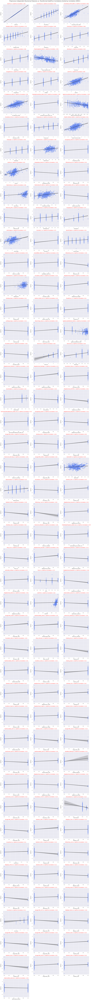

In [ ]:
# Select numerical columns from train_df
prep_numerical_columns = prep_train_combined_cleaned_complete_df.select_dtypes(include='number')

# Compute correlation matrix
corr = prep_numerical_columns.corr()

# Sort columns by correlation with 'SalePrice' in ascending order
sorted_columns = abs(corr['SalePrice']).sort_values(ascending=False).index

# Calculate the number of rows and columns for the subplots
num_plots = len(sorted_columns)

# Calculated the number of rows and columns for the subplots
num_cols = 3
num_rows = (num_plots - 1) // num_cols + 1

# Create subplots 
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

# Add a main title to the entire set of subplots
fig.suptitle("Preprocess Independent Numerical Features vs. Transformed SalePrice Correlations Sorted by Correlation (DESC)", y=1, fontsize=20)

# Create a scatter plot for each combination
for i, column in enumerate(sorted_columns):

    row_idx = i // num_cols
    col_idx = i % num_cols

    correlation = corr.loc[column, 'SalePrice']
    sns.regplot(x=column, data=prep_train_combined_cleaned_complete_df, y='SalePrice', ax=axes[row_idx, col_idx], line_kws={'color' : 'black'})
    axes[row_idx, col_idx].set_xlabel(column, fontsize=12)
    axes[row_idx, col_idx].set_ylabel('SalePrice', fontsize=12)
    axes[row_idx, col_idx].set_title(f" {column} vs. SalePrice (Correlation: {correlation:.2f})", fontsize=14, color='red')
    axes[row_idx, col_idx].grid(True)

# Remove empty subplots
for i in range(num_plots, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

# /Adjust layout
plt.tight_layout()
plt.show()


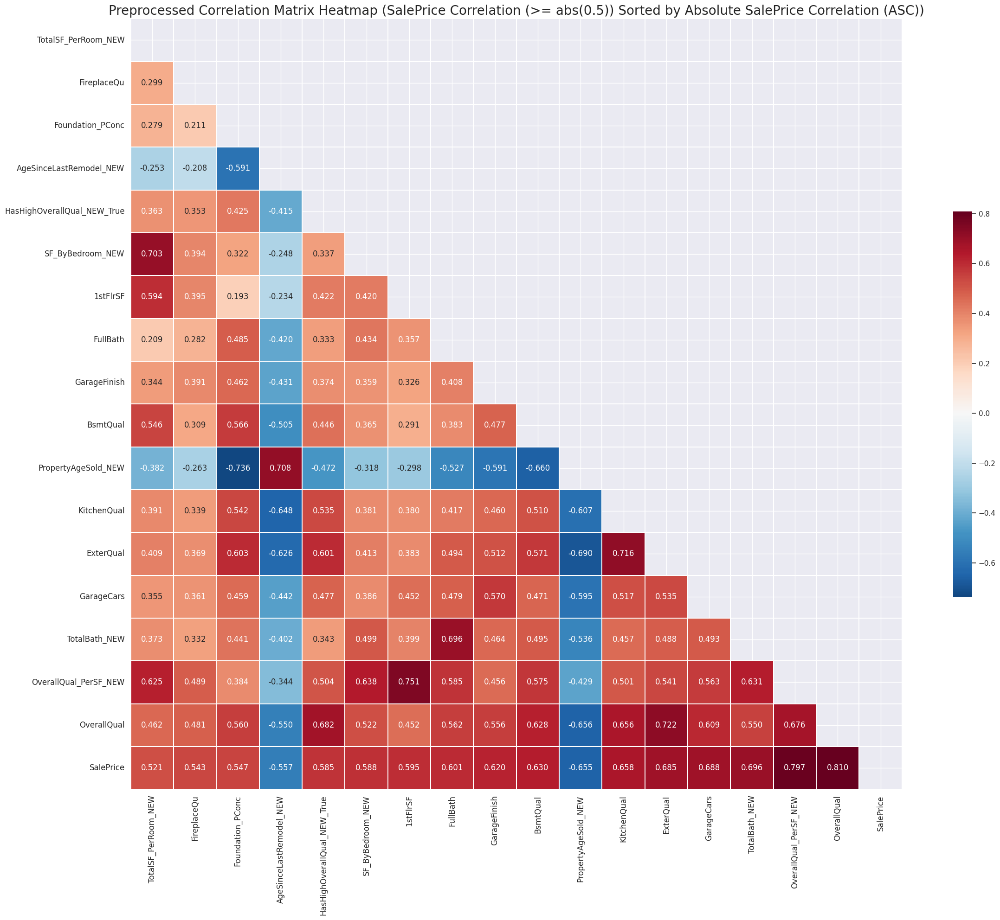

In [ ]:
# Select numerical columns from train_df
prep_numerical_columns = prep_train_combined_cleaned_complete_df.select_dtypes(include='number')

# Compute correlation matrix
corr = prep_numerical_columns.corr()

# Get the  features with absolute correlation >= 0.5 with 'SalePrice'
top_correlated_features = corr.index[abs(corr['SalePrice']) > 0.5]

# Calculate the absolute correlation for the top correlated features
correlation_with_saleprice = abs(corr.loc[top_correlated_features, 'SalePrice'])

# Sort the top_correlated_features by their correlation with 'SalePrice' is descending order
sorted_features = correlation_with_saleprice.sort_values(ascending=True).index

# Filter the correlation matrix to keep only the top correlated features
corr_filtered = corr.loc[sorted_features, sorted_features]

# Create a mask to remove the upper triangle
mask = np.triu(np.ones_like(corr_filtered, dtype=bool))

# Set up the matplotlib figure 
fig, ax = plt.subplots(figsize=(25, 20))

# Generate a custom diverging colormap (choose colors here )
cmap = sns.color_palette('RdBu_r',as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_filtered, mask=mask, cmap=cmap, center=0, square=True, linecolor='white', linewidths=0.01, cbar=True, cbar_kws={"shrink" : 0.5}, annot=True, 
            fmt='.3f')

# Set x and y  label font size 
ax.tick_params(axis='x', labelsize=12, rotation=90)
ax.tick_params(axis='y', labelsize=12, rotation=360)

# add a title 
plt.title("Preprocessed Correlation Matrix Heatmap (SalePrice Correlation (>= abs(0.5)) Sorted by Absolute SalePrice Correlation (ASC))", fontsize=20)


plt.tight_layout()
plt.show()

### 3. Preprocessing Pipeline

In [ ]:
# Here we call the new api set_config to tell sklearn we want to output a pandas DF and not a array after Pipeline transformer

set_config(transform_output='pandas')

`Let's create functions that will be used in our Pipeline (FunctionTransformer)`

In [ ]:
# Function to get   numerical columns from dataframe
def get_numerical_columns(df):
    return df.select_dtypes(include=np.number).columns.tolist()


In [ ]:
# Function to get ordinal categorical columns from DataFrame
def get_ordinal_columns(df):
    ordinal_cols = ['Utilities', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
                     'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'Electrical', 'KitchenQual',
                     'Functional', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence']
    
    return ordinal_cols


In [ ]:
# Function to get one hot categorical columns from DataFrame
def get_onehot_column(df):
    numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
    ordinal_cols = ['Utilities', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
                    'BsmtFinType2', 'HeatingQC', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu',
                    'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence']
    
    # Combine numerical, ordinal, and exclude_cols to get desired columns
    onehot_cols = [col for col in df.columns if col not in numerical_cols and col not in ordinal_cols]
    return onehot_cols

In [ ]:
# Function to delete highly correlated columns and columns with low correlation
def drop_columns(df):
    columns_to_drop = ['3SsnPorch', 'Alley_Pave', 'BldgType_TwnhsE', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtFinType2', 'BsmtHalfBath', 'Condition1_PosA', 
                       'Condition1_PosN', 'Condition1_RRAe', 'Condition1_RRAn', 'Condition1_RRNe', 'Condition1_RRNn', 'Condition2_Artery', 'Condition2_Feedr', 
                       'Condition2_Norm', 'Condition2_PosA', 'Condition2_PosN', 'Condition2_RRAe', 'Condition2_RRAn', 'Condition2_RRNn', 'ExterCond', 
                       'Exterior1st_AsphShn', 'Exterior1st_BrkComm', 'Exterior1st_BrkFace', 'Exterior1st_CBlock', 'Exterior1st_CemntBd', 'Exterior1st_HdBoard', 
                       'Exterior1st_ImStucc', 'Exterior1st_Plywood', 'Exterior1st_Stone', 'Exterior1st_Stucco', 'Exterior1st_WdShing', 'Exterior2nd_AsbShng', 
                       'Exterior2nd_AsphShn', 'Exterior2nd_Brk Cmn', 'Exterior2nd_BrkFace', 'Exterior2nd_CBlock', 'Exterior2nd_CmentBd', 'Exterior2nd_HdBoard', 
                       'Exterior2nd_ImStucc', 'Exterior2nd_MetalSd', 'Exterior2nd_Other', 'Exterior2nd_Plywood', 'Exterior2nd_Stone', 'Exterior2nd_Stucco', 
                       'Exterior2nd_VinylSd', 'Exterior2nd_Wd Sdng', 'Exterior2nd_Wd Shng', 'Fireplaces', 'Foundation_Stone', 'Foundation_Wood', 'GarageAgeAtSale', 
                       'GarageArea', 'GarageCond', 'GarageType_2Types', 'GarageType_Basment', 'GarageType_CarPort', 'GarageType_Unknown', 'GarageYrBlt_1900', 
                       'GarageYrBlt_1908', 'GarageYrBlt_1910', 'GarageYrBlt_1914', 'GarageYrBlt_1915', 'GarageYrBlt_1916', 'GarageYrBlt_1918', 'GarageYrBlt_1921', 
                       'GarageYrBlt_1922', 'GarageYrBlt_1923', 'GarageYrBlt_1924', 'GarageYrBlt_1925', 'GarageYrBlt_1926', 'GarageYrBlt_1927', 'GarageYrBlt_1928', 
                       'GarageYrBlt_1929', 'GarageYrBlt_1930', 'GarageYrBlt_1931', 'GarageYrBlt_1932', 'GarageYrBlt_1933', 'GarageYrBlt_1934', 'GarageYrBlt_1935', 
                       'GarageYrBlt_1936', 'GarageYrBlt_1937', 'GarageYrBlt_1938', 'GarageYrBlt_1939', 'GarageYrBlt_1940', 'GarageYrBlt_1942', 'GarageYrBlt_1943', 
                       'GarageYrBlt_1946', 'GarageYrBlt_1947', 'GarageYrBlt_1948', 'GarageYrBlt_1949', 'GarageYrBlt_1950', 'GarageYrBlt_1951', 'GarageYrBlt_1952', 
                       'GarageYrBlt_1953', 'GarageYrBlt_1954', 'GarageYrBlt_1955', 'GarageYrBlt_1957', 'GarageYrBlt_1958', 'GarageYrBlt_1959', 'GarageYrBlt_1960', 
                       'GarageYrBlt_1961', 'GarageYrBlt_1962', 'GarageYrBlt_1963', 'GarageYrBlt_1964', 'GarageYrBlt_1965', 'GarageYrBlt_1966', 'GarageYrBlt_1967', 
                       'GarageYrBlt_1968', 'GarageYrBlt_1969', 'GarageYrBlt_1970', 'GarageYrBlt_1971', 'GarageYrBlt_1972', 'GarageYrBlt_1974', 'GarageYrBlt_1975', 
                       'GarageYrBlt_1976', 'GarageYrBlt_1977', 'GarageYrBlt_1978', 'GarageYrBlt_1979', 'GarageYrBlt_1980', 'GarageYrBlt_1981', 'GarageYrBlt_1982', 
                       'GarageYrBlt_1983', 'GarageYrBlt_1984', 'GarageYrBlt_1985', 'GarageYrBlt_1986', 'GarageYrBlt_1987', 'GarageYrBlt_1988', 'GarageYrBlt_1989', 
                       'GarageYrBlt_1990', 'GarageYrBlt_1991', 'GarageYrBlt_1992', 'GarageYrBlt_1993', 'GarageYrBlt_1994', 'GarageYrBlt_1995', 'GarageYrBlt_1996', 
                       'GarageYrBlt_1997', 'GarageYrBlt_1998', 'GarageYrBlt_1999', 'GarageYrBlt_2000', 'GarageYrBlt_2002', 'GarageYrBlt_2003', 'GarageYrBlt_2004', 
                       'GarageYrBlt_2005', 'GarageYrBlt_2007', 'GarageYrBlt_2010', 'GrLivArea', 'HalfBath', 'Has2ndFloor_NEW_True', 'HasBasementBathroom_NEW_True', 
                       'HasBasement_NEW_True', 'HasFireplace_NEW_True', 'HasFullBath_NEW_True', 'HasGarage_NEW_True', 'HasMultipleFullBath_NEW_True', 'HasPool_NEW_True', 
                       'HasRemodeled_NEW_True', 'HasWoodDeck_NEW_True', 'Heating_Floor', 'Heating_GasW', 'Heating_OthW', 'Heating_Wall', 'HouseStyle_1Story', 
                       'HouseStyle_2.5Fin', 'HouseStyle_2.5Unf', 'HouseStyle_SFoyer', 'HouseStyle_SLvl', 'KitchenAbvGr', 'LandContour_Low', 'LandContour_Lvl', 
                       'LandSlope_Gtl', 'LandSlope_Mod', 'LandSlope_Sev', 'LotConfig_Corner', 'LotConfig_FR2', 'LotConfig_FR3', 'LotShape_IR1', 'LotShape_IR3', 
                       'LowQualFinSF', 'MSSubClass_190', 'MSSubClass_20', 'MSSubClass_40', 'MSSubClass_45', 'MSSubClass_50', 'MSSubClass_70', 'MSSubClass_75', 
                       'MSSubClass_80', 'MSSubClass_85', 'MSSubClass_90', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MasVnrType_BrkCmn', 'MasVnrType_BrkFace', 
                       'MasVnrType_Unknown', 'MiscFeature_Gar2', 'MiscFeature_Othr', 'MiscFeature_Shed', 'MiscFeature_TenC', 'MiscFeature_Unknown', 'MiscVal', 
                       'MoSold_1', 'MoSold_10', 'MoSold_11', 'MoSold_12', 'MoSold_2', 'MoSold_3', 'MoSold_4', 'MoSold_5', 'MoSold_6', 'MoSold_7', 'MoSold_8', 'MoSold_9', 
                       'Neighborhood_Blmngtn', 'Neighborhood_Blueste', 'Neighborhood_ClearCr', 'Neighborhood_Crawfor', 'Neighborhood_Gilbert', 'Neighborhood_Mitchel', 
                       'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_SWISU', 'Neighborhood_SawyerW', 'Neighborhood_Veenker', 'OverallCond', 'OverallQual', 
                       'PavedDrive_N', 'PavedDrive_P', 'PoolArea', 'PoolQC', 'RoofMatl_ClyTile', 'RoofMatl_CompShg', 'RoofMatl_Roll', 'RoofMatl_Tar&Grv', 'RoofMatl_WdShake', 
                       'RoofStyle_Flat', 'RoofStyle_Gable', 'RoofStyle_Gambrel', 'RoofStyle_Mansard', 'RoofStyle_Shed', 'SaleCondition_AdjLand', 'SaleCondition_Alloca', 
                       'SaleCondition_Family', 'SaleCondition_Partial', 'SaleType_COD', 'SaleType_CWD', 'SaleType_Con', 'SaleType_ConLD', 'SaleType_ConLI', 'SaleType_ConLw', 
                       'SaleType_Oth', 'SeasonSold_NEW_Fall', 'SeasonSold_NEW_Spring', 'SeasonSold_NEW_Summer', 'SeasonSold_NEW_Winter', 'Street_Pave', 'TotRmsAbvGrd', 
                       'TotalBsmtSF', 'TotalLivingAreaRatio_NEW', 'TotalSF_NEW', 'TotalSF_PerRoomOrBath_NEW', 'Utilities', 'YearBuilt_1872', 'YearBuilt_1875', 'YearBuilt_1880', 
                       'YearBuilt_1882', 'YearBuilt_1885', 'YearBuilt_1890', 'YearBuilt_1892', 'YearBuilt_1893', 'YearBuilt_1898', 'YearBuilt_1900', 'YearBuilt_1904', 
                       'YearBuilt_1905', 'YearBuilt_1908', 'YearBuilt_1911', 'YearBuilt_1912', 'YearBuilt_1913', 'YearBuilt_1914', 'YearBuilt_1915', 'YearBuilt_1916', 
                       'YearBuilt_1917', 'YearBuilt_1918', 'YearBuilt_1919', 'YearBuilt_1921', 'YearBuilt_1923', 'YearBuilt_1924', 'YearBuilt_1925', 'YearBuilt_1926', 
                       'YearBuilt_1927', 'YearBuilt_1928', 'YearBuilt_1929', 'YearBuilt_1931', 'YearBuilt_1932', 'YearBuilt_1934', 'YearBuilt_1935', 'YearBuilt_1936', 
                       'YearBuilt_1937', 'YearBuilt_1938', 'YearBuilt_1939', 'YearBuilt_1940', 'YearBuilt_1942', 'YearBuilt_1945', 'YearBuilt_1946', 'YearBuilt_1947', 
                       'YearBuilt_1948', 'YearBuilt_1949', 'YearBuilt_1950', 'YearBuilt_1951', 'YearBuilt_1952', 'YearBuilt_1953', 'YearBuilt_1954', 'YearBuilt_1955', 
                       'YearBuilt_1956', 'YearBuilt_1957', 'YearBuilt_1958', 'YearBuilt_1959', 'YearBuilt_1960', 'YearBuilt_1961', 'YearBuilt_1962', 'YearBuilt_1963', 
                       'YearBuilt_1964', 'YearBuilt_1965', 'YearBuilt_1966', 'YearBuilt_1967', 'YearBuilt_1968', 'YearBuilt_1969', 'YearBuilt_1970', 'YearBuilt_1971', 
                       'YearBuilt_1972', 'YearBuilt_1973', 'YearBuilt_1974', 'YearBuilt_1975', 'YearBuilt_1976', 'YearBuilt_1977', 'YearBuilt_1978', 'YearBuilt_1979', 
                       'YearBuilt_1980', 'YearBuilt_1981', 'YearBuilt_1982', 'YearBuilt_1983', 'YearBuilt_1984', 'YearBuilt_1985', 'YearBuilt_1986', 'YearBuilt_1987', 
                       'YearBuilt_1988', 'YearBuilt_1989', 'YearBuilt_1990', 'YearBuilt_1991', 'YearBuilt_1992', 'YearBuilt_1993', 'YearBuilt_1994', 'YearBuilt_1996', 
                       'YearBuilt_1997', 'YearBuilt_1998', 'YearBuilt_1999', 'YearBuilt_2000', 'YearBuilt_2001', 'YearBuilt_2006', 'YearBuilt_2009', 'YearBuilt_2010', 
                       'YearRemodAdd_1951', 'YearRemodAdd_1952', 'YearRemodAdd_1953', 'YearRemodAdd_1954', 'YearRemodAdd_1955', 'YearRemodAdd_1956', 'YearRemodAdd_1957', 
                       'YearRemodAdd_1958', 'YearRemodAdd_1959', 'YearRemodAdd_1960', 'YearRemodAdd_1961', 'YearRemodAdd_1962', 'YearRemodAdd_1963', 'YearRemodAdd_1964', 
                       'YearRemodAdd_1965', 'YearRemodAdd_1966', 'YearRemodAdd_1967', 'YearRemodAdd_1968', 'YearRemodAdd_1969', 'YearRemodAdd_1970', 'YearRemodAdd_1971', 
                       'YearRemodAdd_1972', 'YearRemodAdd_1973', 'YearRemodAdd_1974', 'YearRemodAdd_1975', 'YearRemodAdd_1976', 'YearRemodAdd_1977', 'YearRemodAdd_1978', 
                       'YearRemodAdd_1979', 'YearRemodAdd_1980', 'YearRemodAdd_1981', 'YearRemodAdd_1982', 'YearRemodAdd_1983', 'YearRemodAdd_1984', 'YearRemodAdd_1985', 
                       'YearRemodAdd_1986', 'YearRemodAdd_1987', 'YearRemodAdd_1988', 'YearRemodAdd_1989', 'YearRemodAdd_1990', 'YearRemodAdd_1991', 'YearRemodAdd_1992', 
                       'YearRemodAdd_1993', 'YearRemodAdd_1994', 'YearRemodAdd_1995', 'YearRemodAdd_1996', 'YearRemodAdd_1997', 'YearRemodAdd_1998', 'YearRemodAdd_1999', 
                       'YearRemodAdd_2000', 'YearRemodAdd_2001', 'YearRemodAdd_2002', 'YearRemodAdd_2003', 'YearRemodAdd_2004', 'YearRemodAdd_2009', 'YearRemodAdd_2010', 
                       'YrSold_2006', 'YrSold_2007', 'YrSold_2008', 'YrSold_2009', 'YrSold_2010']
    
    cleaned_data_frame = df.drop(columns = columns_to_drop, errors = 'ignore')
    
    return cleaned_data_frame



In [ ]:
# Create preprocessing Pipeline 
original_preprocessing_pipeline = Pipeline(verbose = False, steps = [

        ('null_imputer', ColumnTransformer(        
                                transformers = [                        
                                        ("numerical_null_imputer", KNNImputer(n_neighbors = 5, weights = 'distance'), make_column_selector(dtype_include = np.number)),
                                        ("categorical_null_imputer", SimpleImputer(strategy = 'constant', fill_value = 'Unknown'), make_column_selector(dtype_include = object))                       
                                ], verbose_feature_names_out = False))
        ,('custom_features', FunctionTransformer(func = custom_features, validate = False))
        ,('convert_to_correct_dtype', FunctionTransformer(func = convert_to_correct_dtypes, validate = False))
        ,('transformer', ColumnTransformer(
                                transformers = [
                                        ("numerical_transformer", Pipeline(steps = [
                                            ('power_transformer', PowerTransformer(method = 'yeo-johnson', standardize = False)),
                                            ('scaler', RobustScaler())
                                        ]), get_numerical_columns),
                                        ("ordinal_encoding_transformer", Pipeline(steps=[
                                            ('ordinal_encoder', FunctionTransformer(func = apply_custom_ordinal_encoding_mappings, validate = False))
                                        ]), get_ordinal_columns),
                                        ("onehot_encoding_transformer", Pipeline(steps = [
                                            ('onehot_encoder', OneHotEncoder(drop = 'if_binary', handle_unknown = 'ignore', sparse_output = False))
                                        ]), get_onehot_column)
                                ], verbose_feature_names_out = False))    
        ,('drop_columns', FunctionTransformer(func = drop_columns, validate = False))
  
    ])

original_preprocessing_pipeline

Pipeline(steps=[('null_imputer',
                 ColumnTransformer(transformers=[('numerical_null_imputer',
                                                  KNNImputer(weights='distance'),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x73091f7eca70>),
                                                 ('categorical_null_imputer',
                                                  SimpleImputer(fill_value='Unknown',
                                                                strategy='constant'),
                                                  <sklearn.compose._column_transformer.make_column_selector object...
                                                  <function get_ordinal_columns at 0x73092858c9a0>),
                                                 ('onehot_encoding_transformer',
                                                  Pipeline(steps=[('onehot_encoder',
                                                                   OneHotEncoder(drop='if_binary',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  <function get_onehot_column at 0x730920cbf9c0>)],
                                   verbose_feature_names_out=False)),
                ('drop_columns',
                 FunctionTransformer(func=<function drop_columns at 0x730920c62d40>))])

`Let's test Preprocessing Pipeling`

In [ ]:
target_transformer = QuantileTransformer(output_distribution='normal', n_quantiles=100)

In [ ]:
train_df, train_id_column = drop_id_column(train_df.copy())
X_train, y_train = drop_target_column(train_df.copy())

In [ ]:
X_train = original_preprocessing_pipeline.fit_transform(X_train)
X_train


,LotFrontage,LotArea,MasVnrArea,BsmtUnfSF,1stFlrSF,2ndFlrSF,BsmtFullBath,FullBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,TotalBath_NEW,TotalSF_PerRoom_NEW,OverallQual_PerSF_NEW,TotalOutdoorSF_NEW,SF_ByBedroom_NEW,PropertyAgeSold_NEW,AgeSinceLastRemodel_NEW,AgeRemodelAfterBuilt_NEW,ExterQual,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,HeatingQC,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,Fence,MSSubClass_30,MSSubClass_60,MSSubClass_120,MSSubClass_160,MSSubClass_180,YearBuilt_1910,YearBuilt_1920,YearBuilt_1922,YearBuilt_1930,YearBuilt_1941,YearBuilt_1995,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2007,YearBuilt_2008,YearRemodAdd_1950,YearRemodAdd_2005,YearRemodAdd_2006,YearRemodAdd_2007,YearRemodAdd_2008,GarageYrBlt_1920,GarageYrBlt_1941,GarageYrBlt_1945,GarageYrBlt_1956,GarageYrBlt_1973,GarageYrBlt_2001,GarageYrBlt_2006,GarageYrBlt_2008,GarageYrBlt_2009,MSZoning_C (all),MSZoning_RM,Alley_Grvl,Alley_Unknown,LotShape_IR2,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LotConfig_CulDSac,LotConfig_Inside,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Artery,Condition1_Feedr,Condition1_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_2Story,RoofStyle_Hip,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Heating_GasA,Heating_Grav,CentralAir_Y,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_Y,SaleType_New,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Normal,HasPorch_NEW_True,HasHalfBath_NEW_True,HasSecondKitchen_NEW_True,HasMultipleFireplaces_NEW_True,HasThreeOrMoreBedrooms_NEW_True,HasHighOverallQual_NEW_True
1070,0.097405,0.159483,0.972987,-0.037691,-0.063227,-0.000000,1.0,-1.0,0.0,-1.000000,-0.000000,-0.060799,-0.0,0.412735,0.000000,-0.367891,-0.418138,0.182130,-1.088159,0.273058,0.691778,-0.000000,3,3.0,3.0,1.0,4.0,3,5.0,3,6.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
1379,0.145440,0.062582,-0.000000,-0.182749,-0.812344,0.987838,-0.0,0.0,0.0,0.000000,0.919456,-0.768836,-0.0,-0.000000,1.000000,-1.459614,-0.815010,-0.288981,-0.528150,-1.004544,-0.725778,0.382817,3,4.0,3.0,1.0,1.0,4,0.0,4,6.0,0.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
138,0.145440,-0.102077,1.062994,-0.279796,-0.158360,1.014864,-0.0,0.0,0.0,1.139671,1.043168,0.339741,-0.0,-0.000000,1.000000,0.200883,0.352787,0.538502,0.605153,-0.630718,-0.223101,0.382817,4,4.0,3.0,2.0,6.0,5,5.0,4,6.0,3.0,3.0,3.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0
667,-0.251810,-0.355949,1.045056,-0.425922,0.935856,-0.000000,1.0,0.0,0.0,0.000000,1

In [ ]:
y_train = target_transformer.fit_transform(y_train.values.reshape(-1, 1))
y_train

,x0
0,-0.544847
1,0.059687
2,0.834427
3,0.464994
4,-0.791446
...,...
1163,0.139710
1164,-0.993592
1165,-2.398547
1166,-0.188565


`Let's compare Output from Preprocessing Pipeline and Manual Transformation and see if they are the same`

In [ ]:
prep_train_combined_cleaned_complete_df

,ExterQual,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,HeatingQC,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,Fence,MSSubClass_30,MSSubClass_60,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSZoning_C (all),MSZoning_RM,Alley_Grvl,Alley_Unknown,LotShape_IR2,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LotConfig_CulDSac,LotConfig_Inside,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Artery,Condition1_Feedr,Condition1_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_2Story,YearBuilt_1910,YearBuilt_1920,YearBuilt_1922,YearBuilt_1930,YearBuilt_1941,YearBuilt_1995,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2007,YearBuilt_2008,YearRemodAdd_1950,YearRemodAdd_2005,YearRemodAdd_2006,YearRemodAdd_2007,YearRemodAdd_2008,RoofStyle_Hip,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Heating_GasA,Heating_Grav,CentralAir_Y,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,GarageYrBlt_1920,GarageYrBlt_1941,GarageYrBlt_1945,GarageYrBlt_1956,GarageYrBlt_1973,GarageYrBlt_2001,GarageYrBlt_2006,GarageYrBlt_2008,GarageYrBlt_2009,PavedDrive_Y,SaleType_New,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Normal,HasPorch_NEW_True,HasHalfBath_NEW_True,HasMultipleFireplaces_NEW_True,HasThreeOrMoreBedrooms_NEW_True,HasHighOverallQual_NEW_True,LotFrontage,LotArea,OverallQual,MasVnrArea,BsmtUnfSF,1stFlrSF,2ndFlrSF,BsmtFullBath,FullBath,BedroomAbvGr,KitchenAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,TotalBath_NEW,TotalSF_PerRoom_NEW,OverallQual_PerSF_NEW,TotalOutdoorSF_NEW,SF_ByBedroom_NEW,PropertyAgeSold_NEW,AgeSinceLastRemodel_NEW,AgeRemodelAfterBuilt_NEW,SalePrice
0,3,3.0,3.0,1.0,4.0,3,5.0,3,6.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.097405,0.159483,-0.513706,0.972987,-0.037691,-0.063227,-0.000000,1.0,-1.0,0.0,0.0,-1.000000,-0.000000,-0.060799,-0.0,0.412735,0.000000,-0.367891,-0.418138,0.182130,-1.088159,0.273058,0.691778,-0.000000,-0.544847
1,3,4.0,3.0,1.0,1.0,4,0.0,4,6.0,0.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.145440,0.062582,-0.513706,-0.000000,-0.182749,-0.812344,0.987838,-0.0,0.0,0.0,0.0,0.000000,0.919456,-0.768836,-0.0,-0.000000,1.000000,-1.459614,-0.815010,-0.288981,-0.528150,-1.004544,-0.725778,0.382817,0.059687
2,4,4.0,3.0,2.0,6.0,5,5.0,4,6.0,3.0,3.0,3.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.145440,-0.102077,0.949826,1.062994,-0.279796,-0.158360,1.014864,-0.0,0.0,0.0,0.0,1.139671,1.043168,0.339741,-0.0,-0.000000,1.000000,0.200883,0.352787,0.538502,0.605153,-0.630718,-0.223101,0.382817,0.834427
3,3,4.0,3.0,1.0,6.0,5,5.0,

In [ ]:
X_train_manually_preprocessed = prep_train_combined_cleaned_complete_df.drop('SalePrice', axis=1)
y_train_manually_preprocessed = prep_train_combined_cleaned_complete_df['SalePrice']

In [ ]:
are_different = X_train.reset_index(drop=True).ne(X_train_manually_preprocessed.reset_index(drop=True)).any().any()

if are_different:
    
    print("The DataFrames ARE NOT IDENTICAL! Please investigate.")
    
else:
    
    print("The DataFrames ARE IDENTICAL! No actions needed.")

The DataFrames ARE NOT IDENTICAL! Please investigate.


*I actually have no idea about how to investigate these things*

### 4.Modeling and Evaluation

In this section, we will use cross-validate technique to identity the top 5 base model, following that, we'll implement RandomizeSearchCV to determine the most efficient parameters for each of there models

#### 4.1 Cross Validation for base regressor models

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, Lasso, ElasticNet, SGDRegressor
# from 
# Assuming X_train, y_train are defined

base_models = [
    ('LinearRegression', LinearRegression()),
    ('Ridge', Ridge()),
    ('Lasso', Lasso()),
    ('ElasticNet', ElasticNet()),
    ('SGDRegressor', SGDRegressor()),
    ('DecisionTreeRegressor', DecisionTreeRegressor()),
    ('KNeighborsRegressor', KNeighborsRegressor()),
    ('SVR', SVR()),
    ('RandomForestRegressor', RandomForestRegressor()),
    ("ExtraTreesRegressor", ExtraTreesRegressor()),
    ('AdaBoostRegressor', AdaBoostRegressor()),
    ('GradientBoostingRegressor', GradientBoostingRegressor()),
    # ('XGBRegressor', XGBRegressor()),
    # ('LGBMRegressor', LGBMRegressor(silent=None)),
    # ('CatBoostRegressor', CatBoostRegressor(silent=None, loss_function='RMSE', logging_level='Silent'))
]

# Initialize list to stores data
base_model_names = []
base_model_mean_train_scores = []
base_model_mean_test_scores = []
fold_rmse_columns = [[] for _ in range(5)] # Assuming 10 folds

# Iterate through models and append to lists
for name, model in base_models:

    # get cross-validation results
    cv_results = cross_validate(model, X_train, np.ravel(y_train), scoring=["neg_root_mean_squared_error"], cv=5, n_jobs=-1, return_train_score=True, return_estimator=True)

    # Append model name
    base_model_names.append(name)

    # Access mean train and test scores
    mean_train_scores = -np.mean(cv_results['train_neg_root_mean_squared_error'])
    mean_test_scores = -np.mean(cv_results['test_neg_root_mean_squared_error'])

    # Append mean training and testing scores
    base_model_mean_train_scores.append(mean_train_scores)
    base_model_mean_test_scores.append(mean_test_scores)

    # Append individual fold scores
    for i in range(5):
        fold_rmse_columns[i].extend(-cv_results['test_neg_root_mean_squared_error'][i::5]) # index the correct fold scores


# Create DataFrame from lists
base_models_cross_val_results_df = pd.DataFrame({'Model' : base_model_names,
                                                'Mean_Train_RMSE' : base_model_mean_train_scores,
                                                'Mean_Test_RMSE' : base_model_mean_test_scores})

# Add columns for individual cross_validation fold scores
for i in range(5):
    col_name = f'Fold_{i + 1}_Test_RMSE'
    base_models_cross_val_results_df[col_name] = fold_rmse_columns[i]

# Set the 'Model' column as index
base_models_cross_val_results_df = base_models_cross_val_results_df.set_index('Model')

# Sort the 'Model' columns as index
base_models_cross_val_results_df = base_models_cross_val_results_df.sort_values(by='Mean_Test_RMSE', ascending=True)


base_models_cross_val_results_df



NameError: name 'X_train' is not defined

**Top 5 Base Algorithms:**

- CatBoostRegressor
- SVR
- GradientBoostingRegressor
- Ridge
- LGBMRegressor

## It's important to note that the above cross-validation was applied to already preprocessed data, moving forward, we'll utilize RandomizeSearchCV

## This approach aims not only to identity optimal parameters for the model but also to explore the best parameters for the preprocessing pipeline.

Let's add one more step (PCA) to our Preprocessing Pipeline

In [ ]:
updated_preprocessing_pipeline = clone(original_preprocessing_pipeline)
updated_preprocessing_pipeline.steps.append(['pca', PCA(n_components=0.99)])
updated_preprocessing_pipeline

Pipeline(steps=[('null_imputer',
                 ColumnTransformer(transformers=[('numerical_null_imputer',
                                                  KNNImputer(weights='distance'),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x773a88e21100>),
                                                 ('categorical_null_imputer',
                                                  SimpleImputer(fill_value='Unknown',
                                                                strategy='constant'),
                                                  <sklearn.compose._column_transformer.make_column_selector object...
                                                  <function get_ordinal_columns at 0x773a88a598a0>),
                                                 ('onehot_encoding_transformer',
                                                  Pipeline(steps=[('onehot_encoder',
                                                                   OneHotEncoder(drop='if_binary',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  <function get_onehot_column at 0x773a952c1d00>)],
                                   verbose_feature_names_out=False)),
                ('drop_columns',
                 FunctionTransformer(func=<function drop_columns at 0x773a9059fba0>)),
                ['pca', PCA(n_components=0.99)]])

In [ ]:
model_pipelines = {
    "CatBoostRegressor" : Pipeline(steps=[
        ("preprocessing_pipeline", updated_preprocessing_pipeline),
        ("cat_boost", CatBoostRegressor(loss_function='RMSE', logging_level='Silent'))
    ]),
    "SVR" : Pipeline(steps=[
        ("preprocessing_pipeline", updated_preprocessing_pipeline),
        ("svr", SVR())
    ]),
    "GradientBoostingRegressor" : Pipeline(steps=[
        ("preprocessing_pipeline", updated_preprocessing_pipeline),
        ("gradient_boosting", GradientBoostingRegressor())
    ]),
    "Ridge" : Pipeline(steps=[
        ("preprocessing_pipeline", updated_preprocessing_pipeline),
        ("ridge", Ridge())
    ]),
    "LGBMRegressor" : Pipeline(steps=[
        ('preprocessing_pipeline', updated_preprocessing_pipeline),
        ('lgbm_regressor', LGBMRegressor(silent=None))
    ])
    
}

In [ ]:
param_grid_preprocessing_pipeline = {
      
    'preprocessing_pipeline__null_imputer__numerical_null_imputer': [
        KNNImputer(n_neighbors = n, weights = w) for n in [3, 5, 7] for w in ['distance', 'uniform']
    ] + [SimpleImputer(strategy = strategy) for strategy in ['mean', 'median']
    ]
    
    ,'preprocessing_pipeline__null_imputer__categorical_null_imputer': [
        SimpleImputer(strategy = 'constant', fill_value = 'Unknown'),
        SimpleImputer(strategy = 'most_frequent')
    ]
    
    ,'preprocessing_pipeline__transformer__numerical_transformer__power_transformer': [
        PowerTransformer(method = 'yeo-johnson', standardize = False),
        None  
    ]
    
    ,'preprocessing_pipeline__transformer__numerical_transformer__scaler': [
        MinMaxScaler(),
        StandardScaler(),
        RobustScaler(),
        None
    ]
    
    ,'preprocessing_pipeline__transformer__onehot_encoding_transformer__onehot_encoder': [
        OneHotEncoder(drop = 'if_binary', handle_unknown = 'ignore', sparse_output = False),
        OneHotEncoder(drop = 'first', handle_unknown = 'ignore', sparse_output = False),
        OneHotEncoder(drop = None, handle_unknown = 'ignore', sparse_output = False)
    ]   
    
    ,'preprocessing_pipeline__drop_columns': [
        FunctionTransformer(func = drop_columns, validate = False),
        None
    ]
    
    ,'preprocessing_pipeline__pca': [
        PCA(n_components = 0.99),
        None
    ]
   
}

param_grid_preprocessing_pipeline

{'preprocessing_pipeline__null_imputer__numerical_null_imputer': [KNNImputer(n_neighbors=3, weights='distance'),
  KNNImputer(n_neighbors=3),
  KNNImputer(weights='distance'),
  KNNImputer(),
  KNNImputer(n_neighbors=7, weights='distance'),
  KNNImputer(n_neighbors=7),
  SimpleImputer(),
  SimpleImputer(strategy='median')],
 'preprocessing_pipeline__null_imputer__categorical_null_imputer': [SimpleImputer(fill_value='Unknown', strategy='constant'),
  SimpleImputer(strategy='most_frequent')],
 'preprocessing_pipeline__transformer__numerical_transformer__power_transformer': [PowerTransformer(standardize=False),
  None],
 'preprocessing_pipeline__transformer__numerical_transformer__scaler': [MinMaxScaler(),
  StandardScaler(),
  RobustScaler(),
  None],
 'preprocessing_pipeline__transformer__onehot_encoding_transformer__onehot_encoder': [OneHotEncoder(drop='if_binary', handle_unknown='ignore', sparse_output=False),
  OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)

In [ ]:
# let's reset X_train
x_train, y_train  = drop_target_column(train_df.copy())
y_train = target_transformer.fit_transform(y_train.values.reshape(-1,1))

In [ ]:
X_train

,LotFrontage,LotArea,MasVnrArea,BsmtUnfSF,1stFlrSF,2ndFlrSF,BsmtFullBath,FullBath,BedroomAbvGr,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,TotalBath_NEW,TotalSF_PerRoom_NEW,OverallQual_PerSF_NEW,TotalOutdoorSF_NEW,SF_ByBedroom_NEW,PropertyAgeSold_NEW,AgeSinceLastRemodel_NEW,AgeRemodelAfterBuilt_NEW,ExterQual,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,HeatingQC,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,Fence,MSSubClass_30,MSSubClass_60,MSSubClass_120,MSSubClass_160,MSSubClass_180,YearBuilt_1910,YearBuilt_1920,YearBuilt_1922,YearBuilt_1930,YearBuilt_1941,YearBuilt_1995,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2007,YearBuilt_2008,YearRemodAdd_1950,YearRemodAdd_2005,YearRemodAdd_2006,YearRemodAdd_2007,YearRemodAdd_2008,GarageYrBlt_1920,GarageYrBlt_1941,GarageYrBlt_1945,GarageYrBlt_1956,GarageYrBlt_1973,GarageYrBlt_2001,GarageYrBlt_2006,GarageYrBlt_2008,GarageYrBlt_2009,MSZoning_C (all),MSZoning_RM,Alley_Grvl,Alley_Unknown,LotShape_IR2,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LotConfig_CulDSac,LotConfig_Inside,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_CollgCr,Neighborhood_Edwards,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_NAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Condition1_Artery,Condition1_Feedr,Condition1_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_2Story,RoofStyle_Hip,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_MetalSd,Exterior1st_VinylSd,Exterior1st_Wd Sdng,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Heating_GasA,Heating_Grav,CentralAir_Y,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_Y,SaleType_New,SaleType_WD,SaleCondition_Abnorml,SaleCondition_Normal,HasPorch_NEW_True,HasHalfBath_NEW_True,HasSecondKitchen_NEW_True,HasMultipleFireplaces_NEW_True,HasThreeOrMoreBedrooms_NEW_True,HasHighOverallQual_NEW_True
1070,0.097405,0.159483,0.972987,-0.037691,-0.063227,-0.000000,1.0,-1.0,0.0,-1.000000,-0.000000,-0.060799,-0.0,0.412735,0.000000,-0.367891,-0.418138,0.182130,-1.088159,0.273058,0.691778,-0.000000,3,3.0,3.0,1.0,4.0,3,5.0,3,6.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
1379,0.145440,0.062582,-0.000000,-0.182749,-0.812344,0.987838,-0.0,0.0,0.0,0.000000,0.919456,-0.768836,-0.0,-0.000000,1.000000,-1.459614,-0.815010,-0.288981,-0.528150,-1.004544,-0.725778,0.382817,3,4.0,3.0,1.0,1.0,4,0.0,4,6.0,0.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
138,0.145440,-0.102077,1.062994,-0.279796,-0.158360,1.014864,-0.0,0.0,0.0,1.139671,1.043168,0.339741,-0.0,-0.000000,1.000000,0.200883,0.352787,0.538502,0.605153,-0.630718,-0.223101,0.382817,4,4.0,3.0,2.0,6.0,5,5.0,4,6.0,3.0,3.0,3.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0
667,-0.251810,-0.355949,1.045056,-0.425922,0.935856,-0.000000,1.0,0.0,0.0,0.000000,1